In [10]:
import os

os.environ["CUDA_VISIBLE_DEVICES"] = "0"
os.environ["TF_FORCE_GPU_ALLOW_GROWTH"] = "true"

import tensorflow as tf

gpus = tf.config.list_physical_devices("GPU")

print("GPU:", gpus)

if gpus:
    tf.config.experimental.set_memory_growth(gpus[0], True)

GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [11]:
import sys
print(sys.version)

3.13.5 (main, Jul 15 2026, 20:25:40) [GCC 14.2.0]


In [12]:
!pip install PyDrive2 --break-system-packages

#Import Keras
!pip install -U tensorflow-addons --break-system-packages
!pip install -U vit-keras --break-system-packages

# Run this in the SAME Jupyter kernel
import sys
!{sys.executable} -m pip install -U vit-keras --break-system-packages


import sys
print("Python:", sys.executable)

try:
    import vit_keras
    print("✅ vit_keras imported successfully")
    print("Location:", vit_keras.__file__)
except Exception as e:
    print("❌ Import failed:")
    print(type(e).__name__, ":", e)

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
ERROR: Could not find a version that satisfies the requirement tensorflow-addons (from versions: none)
ERROR: No matching distribution found for tensorflow-addons
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Python: /usr/bin/python3
✅ vit_keras imported successfully
Location: /home/hassan_raza/.local/lib/python3.13/site-packages/vit_keras/__init__.py


In [13]:
!pip install -U vit-keras --break-system-packages

Defaulting to user installation because normal site-packages is not writeable


Setup & Imports (New Framework: Local Jupyter, University GPU)

In [14]:
# ============================================================
# CELL 1: SETUP — imports, GPU check, reproducibility,
# local project folders (Drive comes in the next cell)
# ============================================================

import os
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import shutil
import random
import zipfile
import json

from tqdm import tqdm

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models, optimizers, callbacks
from tensorflow.keras.applications import VGG16, DenseNet121

try:
    from tensorflow.keras.applications import ConvNeXtTiny
    from tensorflow.keras.applications.convnext import preprocess_input as convnext_preprocess
except ImportError:
    ConvNeXtTiny = None
    convnext_preprocess = None

# ============================================================
# VISION TRANSFORMER — SETUP
# ============================================================

VIT_AVAILABLE = True

print("Native Keras ViT is available.")

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    roc_curve,
    auc,
    confusion_matrix,
    classification_report
)

from sklearn.preprocessing import label_binarize


# ============================================================
# PYTHON VERSION
# ============================================================

print("Python:", sys.version)


# ============================================================
# GPU CHECK
# ============================================================

print("TensorFlow:", tf.__version__)

gpus = tf.config.list_physical_devices("GPU")

print("GPU available:", gpus)

if not gpus:
    print(
        "WARNING: No GPU detected -- training will be very slow. "
        "Check your university server's CUDA/driver setup before proceeding."
    )


# ============================================================
# REPRODUCIBILITY
# ============================================================

SEED = 42

tf.random.set_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)


# ============================================================
# LOCAL PROJECT FOLDERS
# ============================================================

PROJECT_ROOT = os.path.abspath(".")

DATA_DIR_LOCAL = os.path.join(
    PROJECT_ROOT,
    "ECG_DATA"
)

MODELS_DIR = os.path.join(
    PROJECT_ROOT,
    "models"
)

RESULTS_DIR = os.path.join(
    PROJECT_ROOT,
    "results"
)

PLOTS_DIR = os.path.join(
    PROJECT_ROOT,
    "plots"
)

GRADCAM_DIR = os.path.join(
    PROJECT_ROOT,
    "gradcam"
)

ERROR_ANALYSIS_DIR = os.path.join(
    PROJECT_ROOT,
    "error_analysis"
)

REPORTS_DIR = os.path.join(
    PROJECT_ROOT,
    "reports"
)


# ============================================================
# CREATE PROJECT FOLDERS
# ============================================================

for d in [
    MODELS_DIR,

    os.path.join(
        RESULTS_DIR,
        "metrics"
    ),

    os.path.join(
        RESULTS_DIR,
        "predictions"
    ),

    os.path.join(
        RESULTS_DIR,
        "calibration"
    ),

    os.path.join(
        RESULTS_DIR,
        "robustness"
    ),

    os.path.join(
        PLOTS_DIR,
        "confusion_matrix"
    ),

    os.path.join(
        PLOTS_DIR,
        "roc"
    ),

    os.path.join(
        PLOTS_DIR,
        "training"
    ),

    os.path.join(
        PLOTS_DIR,
        "gradcam"
    ),

    os.path.join(
        PLOTS_DIR,
        "robustness"
    ),

    GRADCAM_DIR,
    ERROR_ANALYSIS_DIR,
    REPORTS_DIR,
]:

    os.makedirs(
        d,
        exist_ok=True
    )


# ============================================================
# FINAL SETUP INFORMATION
# ============================================================

print("Project root:", PROJECT_ROOT)

print("Local dataset folder:", DATA_DIR_LOCAL)

print("Models folder:", MODELS_DIR)

print("Results folder:", RESULTS_DIR)

print("Plots folder:", PLOTS_DIR)

print("ViT available:", VIT_AVAILABLE)

print("Local folder structure created.")

Native Keras ViT is available.
Python: 3.13.5 (main, Jul 15 2026, 20:25:40) [GCC 14.2.0]
TensorFlow: 2.21.0
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Project root: /home/hassan_raza/Downloads/ECG
Local dataset folder: /home/hassan_raza/Downloads/ECG/ECG_DATA
Models folder: /home/hassan_raza/Downloads/ECG/models
Results folder: /home/hassan_raza/Downloads/ECG/results
Plots folder: /home/hassan_raza/Downloads/ECG/plots
ViT available: True
Local folder structure created.


In [15]:
# ============================================================
# CHECK REQUIRED VARIABLES FOR CELL 4
# ============================================================

import os

required_variables = [
    "DATA_DIR_LOCAL",
    "drive_service",
    "ECG_DRIVE_FOLDER_ID",
    "RESULTS_DIR",
    "PLOTS_DIR"
]

for var in required_variables:
    print(f"{var}: {'DEFINED' if var in globals() else 'MISSING'}")

DATA_DIR_LOCAL: DEFINED
drive_service: MISSING
ECG_DRIVE_FOLDER_ID: MISSING
RESULTS_DIR: DEFINED
PLOTS_DIR: DEFINED


Google Drive Connection + Universal Save/Load Helpers


Checking local ECG dataset...
Expected ECG_DATA location:
/home/hassan_raza/Downloads/ECG/ECG_DATA

Local ECG_DATA found successfully.
Train folder: /home/hassan_raza/Downloads/ECG/ECG_DATA/train
Test folder : /home/hassan_raza/Downloads/ECG/ECG_DATA/test

Train classes found: 4
Test classes found : 4

DATASET SUMMARY
split                                                            class  count
train       ECG Images of Myocardial Infarction Patients (240x12=2880)    956
train      ECG Images of Patient that have History of MI (172x12=2064)    516
train ECG Images of Patient that have abnormal heartbeat (233x12=2796)    699
train                           Normal Person ECG Images (284x12=3408)    852
 test       ECG Images of Myocardial Infarction Patients (240x12=2880)    239
 test      ECG Images of Patient that have History of MI (172x12=2064)    172
 test ECG Images of Patient that have abnormal heartbeat (233x12=2796)    233
 test                           Normal Person ECG Images

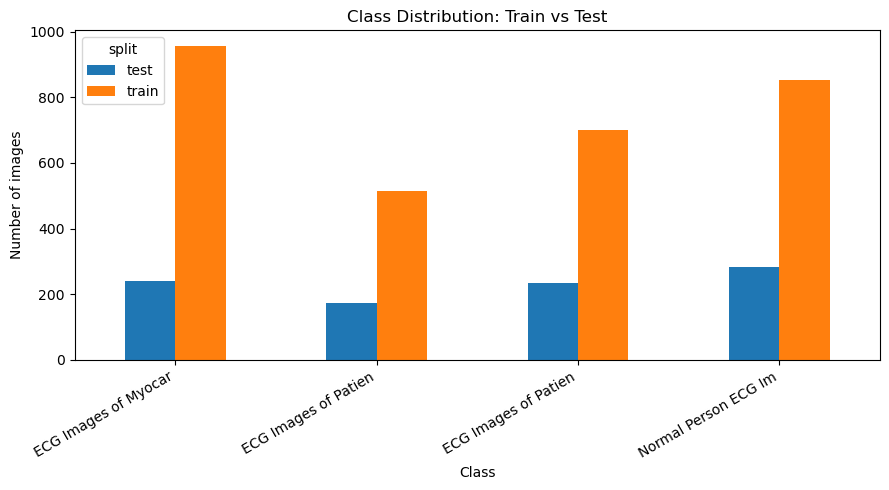


Class distribution chart saved locally:
/home/hassan_raza/Downloads/ECG/plots/training/class_distribution.png

CELL 4 COMPLETED SUCCESSFULLY
Dataset source : LOCAL COMPUTER
Drive download : DISABLED
Training data  : /home/hassan_raza/Downloads/ECG/ECG_DATA/train
Testing data   : /home/hassan_raza/Downloads/ECG/ECG_DATA/test
Number classes : 4

The model will train using the LOCAL ECG_DATA.
Google Drive will be used later for model/results backup.


In [16]:
# ============================================================
# CELL 2: GOOGLE DRIVE CONNECTION (for local Jupyter -- university GPU)
# Uses PyDrive2 with OAuth. First run opens a browser window for you
# to authorize access -- after that, a token is cached locally
# (mycreds.txt) so future sessions skip the browser step.
# ============================================================

# One-time install on the university server (uncomment, run once):
# !pip install PyDrive2
# ============================================================
# CELL 4: LOCAL DATASET LOADER + DATASET VERIFICATION
#
# IMPORTANT:
# - Dataset is used ONLY from the local machine.
# - This cell DOES NOT download ECG_DATA from Google Drive.
# - Google Drive will be used later for trained models,
#   results, plots, etc.
# ============================================================


# ============================================================
# LOCAL DATASET PATHS
# ============================================================

TRAIN_DIR = os.path.join(DATA_DIR_LOCAL, "train")
TEST_DIR = os.path.join(DATA_DIR_LOCAL, "test")


# ============================================================
# CHECK THAT ECG_DATA EXISTS LOCALLY
# ============================================================

print("Checking local ECG dataset...")
print("Expected ECG_DATA location:")
print(DATA_DIR_LOCAL)


if not os.path.exists(DATA_DIR_LOCAL):
    raise FileNotFoundError(
        "\nECG_DATA was not found on the local machine.\n\n"
        "Please manually copy/extract your ECG_DATA folder into:\n"
        f"{DATA_DIR_LOCAL}\n\n"
        "The notebook will NOT download the dataset from Google Drive."
    )


# ============================================================
# CHECK TRAIN AND TEST FOLDERS
# ============================================================

if not os.path.exists(TRAIN_DIR):
    raise FileNotFoundError(
        "\nTRAIN folder was not found.\n\n"
        f"Expected location:\n{TRAIN_DIR}\n\n"
        "Make sure your ECG_DATA folder contains a 'train' folder."
    )


if not os.path.exists(TEST_DIR):
    raise FileNotFoundError(
        "\nTEST folder was not found.\n\n"
        f"Expected location:\n{TEST_DIR}\n\n"
        "Make sure your ECG_DATA folder contains a 'test' folder."
    )


print("\nLocal ECG_DATA found successfully.")
print("Train folder:", TRAIN_DIR)
print("Test folder :", TEST_DIR)


# ============================================================
# CHECK THAT TRAIN AND TEST ARE NOT EMPTY
# ============================================================

train_classes = [
    d for d in os.listdir(TRAIN_DIR)
    if os.path.isdir(os.path.join(TRAIN_DIR, d))
]

test_classes = [
    d for d in os.listdir(TEST_DIR)
    if os.path.isdir(os.path.join(TEST_DIR, d))
]


if len(train_classes) == 0:
    raise RuntimeError(
        "\nThe local train folder exists but contains no class folders."
    )


if len(test_classes) == 0:
    raise RuntimeError(
        "\nThe local test folder exists but contains no class folders."
    )


print("\nTrain classes found:", len(train_classes))
print("Test classes found :", len(test_classes))


# ============================================================
# DATASET VERIFICATION
# ============================================================

def verify_dataset(train_dir, test_dir):

    summary = []

    for split_name, split_dir in [
        ("train", train_dir),
        ("test", test_dir)
    ]:

        for cls in sorted(os.listdir(split_dir)):

            cls_path = os.path.join(split_dir, cls)

            if os.path.isdir(cls_path):

                # Count files only
                n_images = len([
                    f for f in os.listdir(cls_path)
                    if os.path.isfile(os.path.join(cls_path, f))
                ])

                summary.append({
                    "split": split_name,
                    "class": cls,
                    "count": n_images
                })

    return pd.DataFrame(summary)


dataset_summary_df = verify_dataset(
    TRAIN_DIR,
    TEST_DIR
)


# ============================================================
# DISPLAY DATASET SUMMARY
# ============================================================

print("\n============================================================")
print("DATASET SUMMARY")
print("============================================================")

print(
    dataset_summary_df.to_string(index=False)
)


# ============================================================
# SAVE DATASET SUMMARY LOCALLY
# ============================================================

dataset_summary_path = os.path.join(
    RESULTS_DIR,
    "metrics",
    "dataset_summary.csv"
)

dataset_summary_df.to_csv(
    dataset_summary_path,
    index=False
)

print("\nDataset summary saved locally:")
print(dataset_summary_path)


# ============================================================
# DETECT CLASS NAMES
# ============================================================

CLASS_NAMES = sorted([
    d for d in os.listdir(TRAIN_DIR)
    if os.path.isdir(os.path.join(TRAIN_DIR, d))
])

NUM_CLASSES = len(CLASS_NAMES)


print("\n============================================================")
print("CLASS INFORMATION")
print("============================================================")

print(f"Detected {NUM_CLASSES} classes:")
print(CLASS_NAMES)


# ============================================================
# CHECK TRAIN / TEST CLASS CONSISTENCY
# ============================================================

train_class_set = set(
    d for d in os.listdir(TRAIN_DIR)
    if os.path.isdir(os.path.join(TRAIN_DIR, d))
)

test_class_set = set(
    d for d in os.listdir(TEST_DIR)
    if os.path.isdir(os.path.join(TEST_DIR, d))
)


if train_class_set != test_class_set:

    print("\nWARNING:")
    print("Train and test folders do not contain exactly the same classes.")

    print("\nClasses only in train:")
    print(sorted(train_class_set - test_class_set))

    print("\nClasses only in test:")
    print(sorted(test_class_set - train_class_set))

else:

    print("\nTrain/Test class structure is consistent.")


# ============================================================
# CLASS DISTRIBUTION CHART
# ============================================================

pivot_df = dataset_summary_df.pivot(
    index="class",
    columns="split",
    values="count"
)

# Replace missing values with 0
pivot_df = pivot_df.fillna(0)


fig, ax = plt.subplots(figsize=(9, 5))

pivot_df.plot(
    kind="bar",
    ax=ax
)

ax.set_title("Class Distribution: Train vs Test")
ax.set_ylabel("Number of images")
ax.set_xlabel("Class")

ax.set_xticklabels(
    [str(c)[:20] for c in pivot_df.index],
    rotation=30,
    ha="right"
)

plt.tight_layout()


class_distribution_path = os.path.join(
    PLOTS_DIR,
    "training",
    "class_distribution.png"
)

plt.savefig(
    class_distribution_path,
    dpi=150
)

plt.show()


print("\nClass distribution chart saved locally:")
print(class_distribution_path)


# ============================================================
# FINAL STATUS
# ============================================================

print("\n============================================================")
print("CELL 4 COMPLETED SUCCESSFULLY")
print("============================================================")

print("Dataset source : LOCAL COMPUTER")
print("Drive download : DISABLED")
print("Training data  :", TRAIN_DIR)
print("Testing data   :", TEST_DIR)
print("Number classes :", NUM_CLASSES)

print("\nThe model will train using the LOCAL ECG_DATA.")
print("Google Drive will be used later for model/results backup.")

Retrain-or-Load Prompt System

In [17]:
# ============================================================
# CELL 3 — LOCAL MODEL TRAINING / LOADING
# ============================================================
#
# Training happens locally.
# Google Drive is used only for permanent model storage.
# ============================================================

# ============================================================
# TRAIN OR LOAD LOCAL MODEL
# ============================================================

# ============================================================
# TRAIN OR LOAD LOCAL MODEL
# ============================================================

def train_or_load_local_model(
    model_name,
    build_fn,
    train_generator,
    val_generator
):

    local_model_path = os.path.join(
        MODELS_DIR,
        f"{model_name}.keras"
    )

    local_history_path = os.path.join(
        MODELS_DIR,
        f"{model_name}_history.json"
    )

    # ========================================================
    # MODEL EXISTS
    # ========================================================

    if os.path.exists(local_model_path):

        print("=" * 60)
        print(f"[{model_name}] LOCAL MODEL FOUND")
        print("=" * 60)

        print("Path:", local_model_path)

        # Load saved model on CPU
        with tf.device("/CPU:0"):
            model = tf.keras.models.load_model(
                local_model_path,
                compile=False
            )

        hist1 = None
        hist2 = None

        # ====================================================
        # LOAD HISTORY
        # ====================================================

        if os.path.exists(local_history_path):

            with open(
                local_history_path,
                "r"
            ) as f:

                history_data = json.load(f)

            if (
                isinstance(history_data, dict)
                and "accuracy" in history_data
            ):

                hist1 = history_data

            elif (
                isinstance(history_data, dict)
                and "stage1" in history_data
            ):

                hist1 = history_data.get("stage1")
                hist2 = history_data.get("stage2")

            print(
                f"[{model_name}] Training history loaded."
            )

        else:

            print(
                f"[{model_name}] WARNING: "
                "Training history not found."
            )

        print(
            f"[{model_name}] Loaded from local storage."
        )

        return (
            model,
            None,
            hist1,
            hist2
        )

    # ========================================================
    # MODEL DOES NOT EXIST → TRAIN
    # ========================================================

    print("=" * 60)
    print(f"[{model_name}] NO LOCAL MODEL FOUND")
    print("=" * 60)

    print("Training locally...")

    model, base = build_fn()

    model.summary()

    hist1, hist2 = train_two_stage(
        model,
        base,
        model_name,
        train_generator,
        val_generator
    )

    # ========================================================
    # SAVE MODEL
    # ========================================================

    model.save(local_model_path)

    # ========================================================
    # SAVE HISTORY
    # ========================================================

    history_data = {
        "stage1":
            hist1.history
            if hist1 is not None
            else None,

        "stage2":
            hist2.history
            if hist2 is not None
            else None
    }

    with open(
        local_history_path,
        "w"
    ) as f:

        json.dump(
            history_data,
            f
        )

    return (
        model,
        base,
        hist1,
        hist2
    )

Dataset Loader (retrieve from Drive) + Verification

Local ECG_DATA path:
/home/hassan_raza/Downloads/ECG/ECG_DATA
ECG_DATA already present locally -- skipping download.

Dataset summary:
split                                                            class  count
train       ECG Images of Myocardial Infarction Patients (240x12=2880)    956
train      ECG Images of Patient that have History of MI (172x12=2064)    516
train ECG Images of Patient that have abnormal heartbeat (233x12=2796)    699
train                           Normal Person ECG Images (284x12=3408)    852
 test       ECG Images of Myocardial Infarction Patients (240x12=2880)    239
 test      ECG Images of Patient that have History of MI (172x12=2064)    172
 test ECG Images of Patient that have abnormal heartbeat (233x12=2796)    233
 test                           Normal Person ECG Images (284x12=3408)    284

Detected 4 classes: ['ECG Images of Myocardial Infarction Patients (240x12=2880)', 'ECG Images of Patient that have History of MI (172x12=2064)', 'ECG Images of P

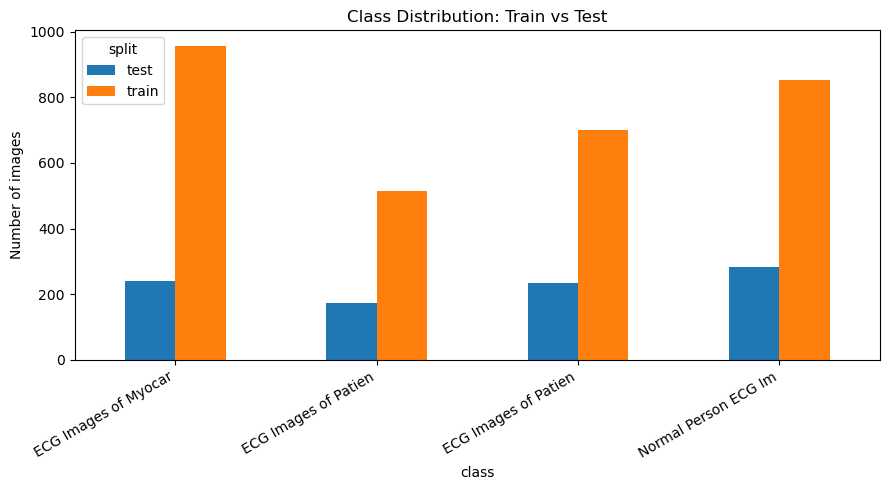

In [18]:
# ============================================================
# CELL 4: DATASET LOADER
# Downloads ECG_DATA from your Drive folder to local disk (only
# if not already present locally), then verifies the structure.
# ============================================================

def find_drive_subfolder_id(name, parent_id):
    """Returns the folder ID of a subfolder by name, or None if not found."""
    query = f"'{parent_id}' in parents and title='{name}' and mimeType='application/vnd.google-apps.folder' and trashed=false"
    matches = drive_service.ListFile({"q": query}).GetList()
    return matches[0]["id"] if matches else None


def download_drive_folder_recursive(drive_folder_id, local_path):
    """Recursively downloads every file inside a Drive folder (and its
    subfolders) into local_path, preserving the folder structure."""
    os.makedirs(local_path, exist_ok=True)

    query = f"'{drive_folder_id}' in parents and trashed=false"
    items = drive_service.ListFile({"q": query}).GetList()

    for item in tqdm(items, desc=f"Downloading {os.path.basename(local_path)}"):
        if item["mimeType"] == "application/vnd.google-apps.folder":
            download_drive_folder_recursive(item["id"], os.path.join(local_path, item["title"]))
        else:
            local_file_path = os.path.join(local_path, item["title"])
            if not os.path.exists(local_file_path):   # skip if already downloaded
                item.GetContentFile(local_file_path)

# ============================================================
# LOCAL DATASET PATH
# ============================================================

DATA_DIR_LOCAL = os.path.abspath("ECG_DATA")

print("Local ECG_DATA path:")
print(DATA_DIR_LOCAL)


# ============================================================
# CHECK LOCAL FIRST -- only hit Drive if the dataset isn't already here
# ============================================================

TRAIN_DIR = os.path.join(DATA_DIR_LOCAL, "train")
TEST_DIR = os.path.join(DATA_DIR_LOCAL, "test")

if os.path.exists(TRAIN_DIR) and os.path.exists(TEST_DIR) and len(os.listdir(TRAIN_DIR)) > 0:
    print("ECG_DATA already present locally -- skipping download.")

else:
    print("ECG_DATA not found locally -- downloading from Drive (this may take a while)...")
    ecg_data_drive_id = find_drive_subfolder_id("ECG_DATA", ECG_DRIVE_FOLDER_ID)

    if ecg_data_drive_id is None:
        raise FileNotFoundError(
            "Could not find a folder named 'ECG_DATA' inside your shared Drive folder. "
            "Check that the folder name matches exactly."
        )

    download_drive_folder_recursive(ecg_data_drive_id, DATA_DIR_LOCAL)
    print("Download complete.")


# ============================================================
# DATASET VERIFICATION (Phase 1 per spec)
# ============================================================

def verify_dataset(train_dir, test_dir):
    summary = []
    for split_name, split_dir in [("train", train_dir), ("test", test_dir)]:
        for cls in sorted(os.listdir(split_dir)):
            cls_path = os.path.join(split_dir, cls)
            if os.path.isdir(cls_path):
                n_images = len(os.listdir(cls_path))
                summary.append({"split": split_name, "class": cls, "count": n_images})
    return pd.DataFrame(summary)

dataset_summary_df = verify_dataset(TRAIN_DIR, TEST_DIR)
print("\nDataset summary:")
print(dataset_summary_df.to_string(index=False))

dataset_summary_df.to_csv(os.path.join(RESULTS_DIR, "metrics", "dataset_summary.csv"), index=False)

CLASS_NAMES = sorted(os.listdir(TRAIN_DIR))
NUM_CLASSES = len(CLASS_NAMES)
print(f"\nDetected {NUM_CLASSES} classes:", CLASS_NAMES)
# ============================================================
# ADD TO CELL 4: CLASS DISTRIBUTION CHART
# ============================================================

pivot_df = dataset_summary_df.pivot(index="class", columns="split", values="count")

fig, ax = plt.subplots(figsize=(9, 5))
pivot_df.plot(kind="bar", ax=ax)
ax.set_title("Class Distribution: Train vs Test")
ax.set_ylabel("Number of images")
ax.set_xticklabels([c[:20] for c in pivot_df.index], rotation=30, ha="right")
plt.tight_layout()
plt.savefig(os.path.join(PLOTS_DIR, "training", "class_distribution.png"), dpi=150)
plt.show()

ECG Grid Cropping Function

In [19]:
# ============================================================
# CELL 5: ECG GRID CROPPING FUNCTION
# Detects the red-bordered waveform box, strips patient ID /
# header / footer. Same method validated in your Colab work.
# ============================================================

def crop_to_ecg_grid(img_bgr):
    hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
    lower_red1 = np.array([0, 40, 100])
    upper_red1 = np.array([10, 255, 255])
    lower_red2 = np.array([160, 40, 100])
    upper_red2 = np.array([180, 255, 255])
    mask = cv2.inRange(hsv, lower_red1, upper_red1) | cv2.inRange(hsv, lower_red2, upper_red2)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return None

    largest = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest)
    pad = 3
    return img_bgr[y + pad:y + h - pad, x + pad:x + w - pad]


def is_dataset_already_processed(sample_dir, n_samples=5):
    """Heuristic check: samples a few images and tests whether they
    already look cropped (i.e. crop_to_ecg_grid finds nothing new to
    remove, meaning there's no red border / header left to strip)."""
    all_classes = [d for d in os.listdir(sample_dir) if os.path.isdir(os.path.join(sample_dir, d))]
    if not all_classes:
        return False

    sample_cls_dir = os.path.join(sample_dir, all_classes[0])
    sample_files = os.listdir(sample_cls_dir)[:n_samples]

    red_border_found_count = 0
    for fname in sample_files:
        img = cv2.imread(os.path.join(sample_cls_dir, fname))
        if img is None:
            continue
        cropped = crop_to_ecg_grid(img)
        # If a red border WAS detected and the crop meaningfully shrank
        # the image, this looks like RAW (uncropped) data.
        if cropped is not None and cropped.shape[0] < img.shape[0] * 0.95:
            red_border_found_count += 1

    # If most samples show a detectable red border to crop, treat as RAW.
    # If few/none do, the dataset is likely already cropped.
    return red_border_found_count < (len(sample_files) / 2)


dataset_looks_processed = is_dataset_already_processed(TRAIN_DIR)
print(f"Dataset appears to be already cropped: {dataset_looks_processed}")
if not dataset_looks_processed:
    print("-> Raw dataset detected. Cropping + balancing pipeline will run next.")
else:
    print("-> Dataset already looks processed. Cropping step can be skipped.")

Dataset appears to be already cropped: False
-> Raw dataset detected. Cropping + balancing pipeline will run next.


Crop + Balance Pipeline (conditional, with retrain-or-load style prompt)

In [21]:
# ============================================================
# CELL 6: CROP + SPLIT-THEN-BALANCE PIPELINE
#       WITH SAVED CROPPED + BALANCED DATA
# ============================================================

from sklearn.model_selection import train_test_split


# ============================================================
# PROCESSED DATA DIRECTORIES
# ============================================================

PROCESSED_DATA_DIR = os.path.join(
    PROJECT_ROOT,
    "ECG_DATA_PROCESSED"
)

PROCESSED_TRAIN_DIR = os.path.join(
    PROCESSED_DATA_DIR,
    "train"
)

PROCESSED_VAL_DIR = os.path.join(
    PROCESSED_DATA_DIR,
    "val"
)

PROCESSED_TEST_DIR = os.path.join(
    PROCESSED_DATA_DIR,
    "test"
)

VAL_SPLIT = 0.20


# ============================================================
# PERMANENT CROPPED DATASET
# ============================================================

CROPPED_DATA_DIR = os.path.join(
    PROJECT_ROOT,
    "ECG_DATA_CROPPED"
)

cropped_train_tmp = os.path.join(
    CROPPED_DATA_DIR,
    "train"
)

cropped_test_tmp = os.path.join(
    CROPPED_DATA_DIR,
    "test"
)


# ============================================================
# SAVED BALANCED DATASET
# ============================================================

BALANCED_DATA_DIR = os.path.join(
    PROJECT_ROOT,
    "ECG_DATA_BALANCED"
)

BALANCED_TRAIN_DIR = os.path.join(
    BALANCED_DATA_DIR,
    "train"
)


# ============================================================
# AUGMENTATION
# ============================================================

def augment_image_for_balancing(img):

    h, w = img.shape[:2]

    angle = random.uniform(-5, 5)

    M = cv2.getRotationMatrix2D(
        (w / 2, h / 2),
        angle,
        1.0
    )

    img = cv2.warpAffine(
        img,
        M,
        (w, h),
        borderMode=cv2.BORDER_REPLICATE
    )

    if random.random() > 0.5:
        img = cv2.flip(img, 1)

    return img


# ============================================================
# CROP ALL IMAGES
# ============================================================

def batch_crop(src_dir, dst_dir):

    os.makedirs(
        dst_dir,
        exist_ok=True
    )

    failed = []

    for cls in os.listdir(src_dir):

        src_cls_dir = os.path.join(
            src_dir,
            cls
        )

        dst_cls_dir = os.path.join(
            dst_dir,
            cls
        )

        if not os.path.isdir(src_cls_dir):
            continue

        os.makedirs(
            dst_cls_dir,
            exist_ok=True
        )

        for fname in tqdm(
            os.listdir(src_cls_dir),
            desc=f"Cropping {cls[:30]}"
        ):

            src_path = os.path.join(
                src_cls_dir,
                fname
            )

            dst_path = os.path.join(
                dst_cls_dir,
                fname
            )

            img = cv2.imread(src_path)

            if img is None:
                failed.append(fname)
                continue

            cropped = crop_to_ecg_grid(img)

            if cropped is None or cropped.size == 0:
                failed.append(fname)
                continue

            cv2.imwrite(
                dst_path,
                cropped
            )

    return failed


# ============================================================
# CHECK DATASET EXISTS
# ============================================================

def dataset_exists(dataset_dir):

    if not os.path.isdir(dataset_dir):
        return False

    image_count = 0

    for root, dirs, files in os.walk(dataset_dir):

        image_count += len(files)

    return image_count > 0


# ============================================================
# SPLIT BEFORE BALANCING
# ============================================================

def split_before_balancing(
    cropped_train_dir,
    train_out_dir,
    val_out_dir,
    val_split=VAL_SPLIT,
    seed=SEED
):

    os.makedirs(
        train_out_dir,
        exist_ok=True
    )

    os.makedirs(
        val_out_dir,
        exist_ok=True
    )

    for cls in os.listdir(cropped_train_dir):

        cls_dir = os.path.join(
            cropped_train_dir,
            cls
        )

        if not os.path.isdir(cls_dir):
            continue

        files = [
            f for f in os.listdir(cls_dir)
            if os.path.isfile(
                os.path.join(cls_dir, f)
            )
        ]

        if len(files) < 2:

            train_files = files
            val_files = []

        else:

            train_files, val_files = train_test_split(
                files,
                test_size=val_split,
                random_state=seed
            )

        train_cls_dir = os.path.join(
            train_out_dir,
            cls
        )

        val_cls_dir = os.path.join(
            val_out_dir,
            cls
        )

        os.makedirs(
            train_cls_dir,
            exist_ok=True
        )

        os.makedirs(
            val_cls_dir,
            exist_ok=True
        )

        for f in train_files:

            shutil.copy2(
                os.path.join(cls_dir, f),
                os.path.join(train_cls_dir, f)
            )

        for f in val_files:

            shutil.copy2(
                os.path.join(cls_dir, f),
                os.path.join(val_cls_dir, f)
            )


# ============================================================
# BALANCE TRAINING DATA
# ============================================================

def balance_train_only(
    source_train_dir,
    balanced_train_dir
):

    os.makedirs(
        balanced_train_dir,
        exist_ok=True
    )

    class_counts = {}

    for cls in os.listdir(source_train_dir):

        cls_dir = os.path.join(
            source_train_dir,
            cls
        )

        if not os.path.isdir(cls_dir):
            continue

        count = len([
            f for f in os.listdir(cls_dir)
            if os.path.isfile(
                os.path.join(cls_dir, f)
            )
        ])

        class_counts[cls] = count

    if not class_counts:

        raise RuntimeError(
            "No training classes found."
        )

    max_count = max(
        class_counts.values()
    )

    print(
        "Pre-balance train counts:",
        class_counts
    )

    print(
        "Target count per class:",
        max_count
    )

    for cls, count in class_counts.items():

        source_cls_dir = os.path.join(
            source_train_dir,
            cls
        )

        output_cls_dir = os.path.join(
            balanced_train_dir,
            cls
        )

        os.makedirs(
            output_cls_dir,
            exist_ok=True
        )

        files = [
            f for f in os.listdir(source_cls_dir)
            if os.path.isfile(
                os.path.join(source_cls_dir, f)
            )
        ]

        # Copy original images
        for f in files:

            shutil.copy2(
                os.path.join(
                    source_cls_dir,
                    f
                ),
                os.path.join(
                    output_cls_dir,
                    f
                )
            )

        # Create augmented images
        needed = max_count - count

        for i in tqdm(
            range(needed),
            desc=f"Balancing {cls[:30]}"
        ):

            src_file = random.choice(files)

            img = cv2.imread(
                os.path.join(
                    source_cls_dir,
                    src_file
                )
            )

            if img is None:
                continue

            augmented = augment_image_for_balancing(
                img
            )

            output_name = (
                f"aug_{i}_{src_file}"
            )

            cv2.imwrite(
                os.path.join(
                    output_cls_dir,
                    output_name
                ),
                augmented
            )

    balanced_counts = {}

    for cls in os.listdir(balanced_train_dir):

        cls_dir = os.path.join(
            balanced_train_dir,
            cls
        )

        if os.path.isdir(cls_dir):

            balanced_counts[cls] = len([
                f for f in os.listdir(cls_dir)
                if os.path.isfile(
                    os.path.join(cls_dir, f)
                )
            ])

    print(
        "Post-balance train counts:",
        balanced_counts
    )


# ============================================================
# CHECK RAW DATASET
# ============================================================

if not os.path.isdir(TRAIN_DIR):

    raise FileNotFoundError(
        f"Local training dataset not found:\n{TRAIN_DIR}"
    )

if not os.path.isdir(TEST_DIR):

    raise FileNotFoundError(
        f"Local test dataset not found:\n{TEST_DIR}"
    )


# ============================================================
# STEP 1 — CROPPED DATASET
# ============================================================

if dataset_exists(CROPPED_DATA_DIR):

    print(
        "\n✅ EXISTING CROPPED DATASET FOUND"
    )

    print(
        "Skipping cropping."
    )

    train_failed = []
    test_failed = []

else:

    print(
        "\n⚠️ CROPPED DATASET NOT FOUND"
    )

    print(
        "Cropping training images..."
    )

    train_failed = batch_crop(
        TRAIN_DIR,
        cropped_train_tmp
    )

    print(
        "Cropping test images..."
    )

    test_failed = batch_crop(
        TEST_DIR,
        cropped_test_tmp
    )


# ============================================================
# STEP 2 — CREATE PROCESSED DATASET
# ============================================================

if os.path.exists(PROCESSED_DATA_DIR):

    shutil.rmtree(
        PROCESSED_DATA_DIR
    )


print(
    "\nSTEP 2: Splitting train/validation..."
)

split_before_balancing(
    cropped_train_tmp,
    PROCESSED_TRAIN_DIR,
    PROCESSED_VAL_DIR
)


# ============================================================
# STEP 3 — BALANCE TRAINING DATA
# ============================================================

if dataset_exists(BALANCED_TRAIN_DIR):

    print(
        "\n✅ EXISTING BALANCED TRAIN DATA FOUND"
    )

    print(
        "Skipping balancing."
    )

else:

    print(
        "\n⚠️ BALANCED TRAIN DATA NOT FOUND"
    )

    print(
        "Balancing training data..."
    )

    balance_train_only(
        PROCESSED_TRAIN_DIR,
        BALANCED_TRAIN_DIR
    )


# ============================================================
# STEP 4 — USE SAVED BALANCED DATA AS FINAL TRAIN DATA
# ============================================================

if os.path.exists(PROCESSED_TRAIN_DIR):

    shutil.rmtree(
        PROCESSED_TRAIN_DIR
    )

shutil.copytree(
    BALANCED_TRAIN_DIR,
    PROCESSED_TRAIN_DIR
)


# ============================================================
# STEP 5 — COPY TEST DATA
# ============================================================

shutil.copytree(
    cropped_test_tmp,
    PROCESSED_TEST_DIR
)


# ============================================================
# FINAL DIRECTORIES
# ============================================================

FINAL_TRAIN_DIR = PROCESSED_TRAIN_DIR
FINAL_VAL_DIR = PROCESSED_VAL_DIR
FINAL_TEST_DIR = PROCESSED_TEST_DIR


# ============================================================
# FINAL STATUS
# ============================================================

print(
    "\n" + "=" * 60
)

print(
    "PROCESSING COMPLETE"
)

print(
    "=" * 60
)

print(
    "CROPPED DATA:",
    CROPPED_DATA_DIR
)

print(
    "BALANCED DATA:",
    BALANCED_DATA_DIR
)

print(
    "FINAL TRAIN:",
    FINAL_TRAIN_DIR
)

print(
    "FINAL VALIDATION:",
    FINAL_VAL_DIR
)

print(
    "FINAL TEST:",
    FINAL_TEST_DIR
)

print(
    "\n✅ Cropped dataset saved locally."
)

print(
    "✅ Balanced training dataset saved locally."
)

print(
    "✅ Existing cropped/balanced data will be reused."
)

print(
    "✅ Validation and test data are never augmented."
)

print(
    "✅ No Google Drive dataset download/upload."
)


✅ EXISTING CROPPED DATASET FOUND
Skipping cropping.

STEP 2: Splitting train/validation...

✅ EXISTING BALANCED TRAIN DATA FOUND
Skipping balancing.

PROCESSING COMPLETE
CROPPED DATA: /home/hassan_raza/Downloads/ECG/ECG_DATA_CROPPED
BALANCED DATA: /home/hassan_raza/Downloads/ECG/ECG_DATA_BALANCED
FINAL TRAIN: /home/hassan_raza/Downloads/ECG/ECG_DATA_PROCESSED/train
FINAL VALIDATION: /home/hassan_raza/Downloads/ECG/ECG_DATA_PROCESSED/val
FINAL TEST: /home/hassan_raza/Downloads/ECG/ECG_DATA_PROCESSED/test

✅ Cropped dataset saved locally.
✅ Balanced training dataset saved locally.
✅ Existing cropped/balanced data will be reused.
✅ Validation and test data are never augmented.
✅ No Google Drive dataset download/upload.



DATASET RESULTS

CROPPED TRAIN:
----------------------------------------
ECG Images of Myocardial Infarction Patients (240x12=2880): 956
ECG Images of Patient that have History of MI (172x12=2064): 516
ECG Images of Patient that have abnormal heartbeat (233x12=2796): 699
Normal Person ECG Images (284x12=3408): 852
TOTAL CROPPED TRAIN: 3023

BALANCED TRAIN:
----------------------------------------
ECG Images of Myocardial Infarction Patients (240x12=2880): 764
ECG Images of Patient that have History of MI (172x12=2064): 764
ECG Images of Patient that have abnormal heartbeat (233x12=2796): 764
Normal Person ECG Images (284x12=3408): 764
TOTAL BALANCED TRAIN: 3056

FINAL TRAIN:
----------------------------------------
ECG Images of Myocardial Infarction Patients (240x12=2880): 764
ECG Images of Patient that have History of MI (172x12=2064): 764
ECG Images of Patient that have abnormal heartbeat (233x12=2796): 764
Normal Person ECG Images (284x12=3408): 764
FINAL TRAIN: 3056

FINAL VAL:
-

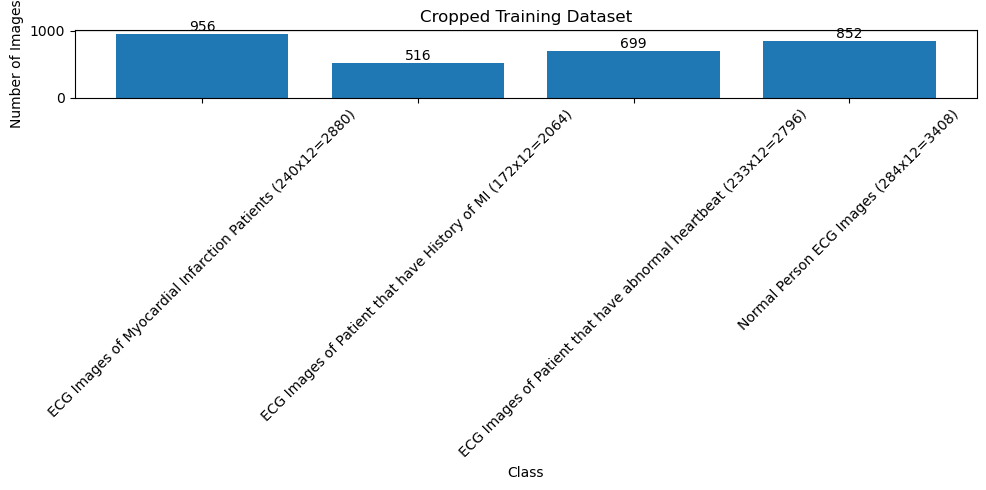

Graph saved: /home/hassan_raza/Downloads/ECG/plots/cropped_training_dataset.png


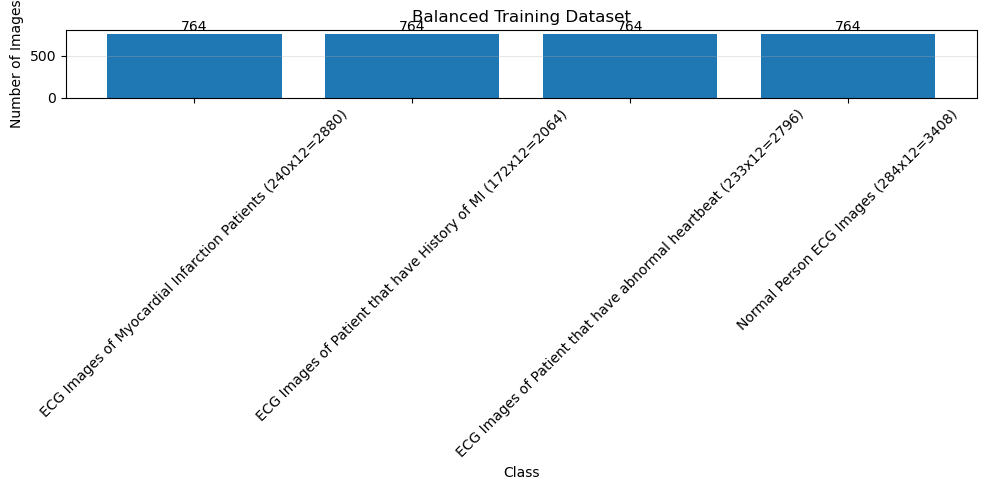

Graph saved: /home/hassan_raza/Downloads/ECG/plots/balanced_training_dataset.png


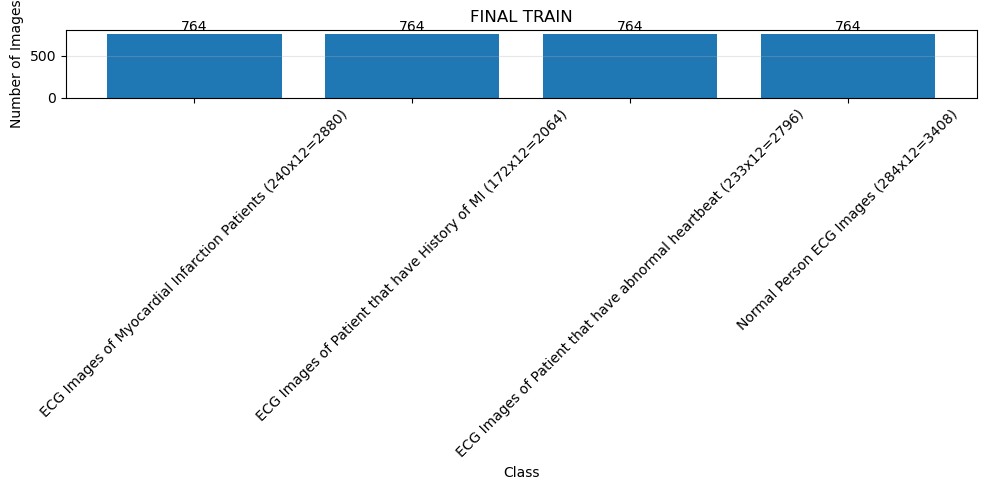

Graph saved: /home/hassan_raza/Downloads/ECG/plots/final_train.png


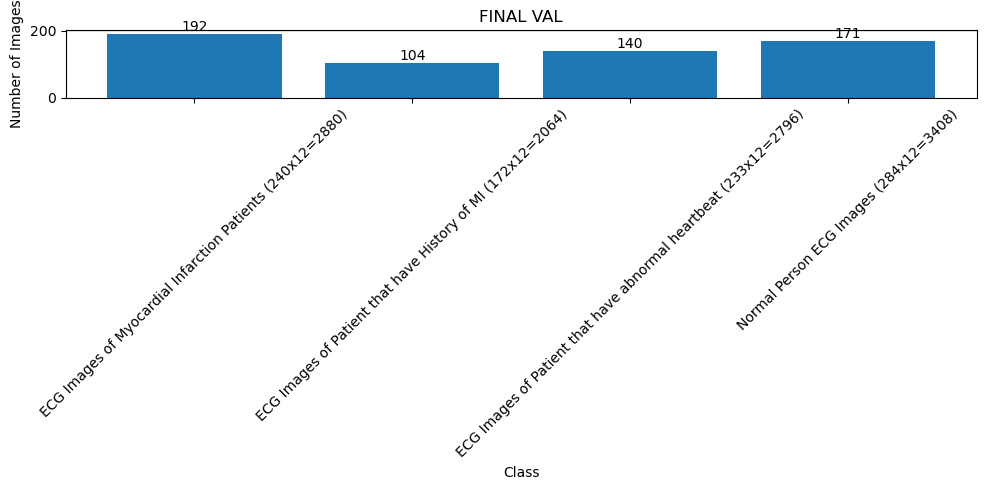

Graph saved: /home/hassan_raza/Downloads/ECG/plots/final_val.png


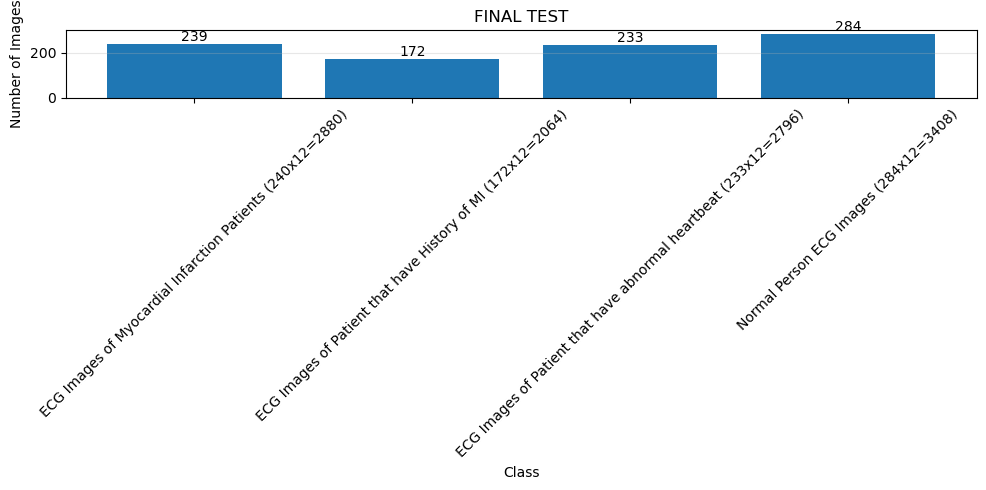

Graph saved: /home/hassan_raza/Downloads/ECG/plots/final_test.png


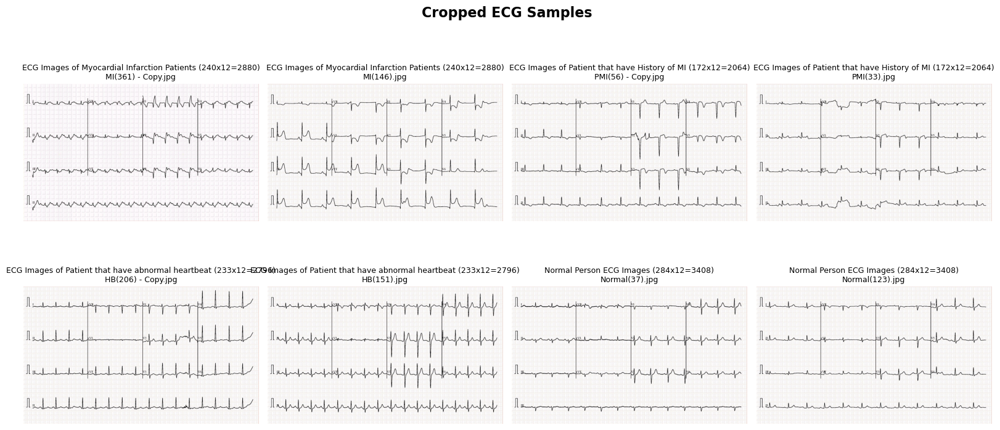

Sample visualization saved: /home/hassan_raza/Downloads/ECG/plots/cropped_ecg_samples_samples.png


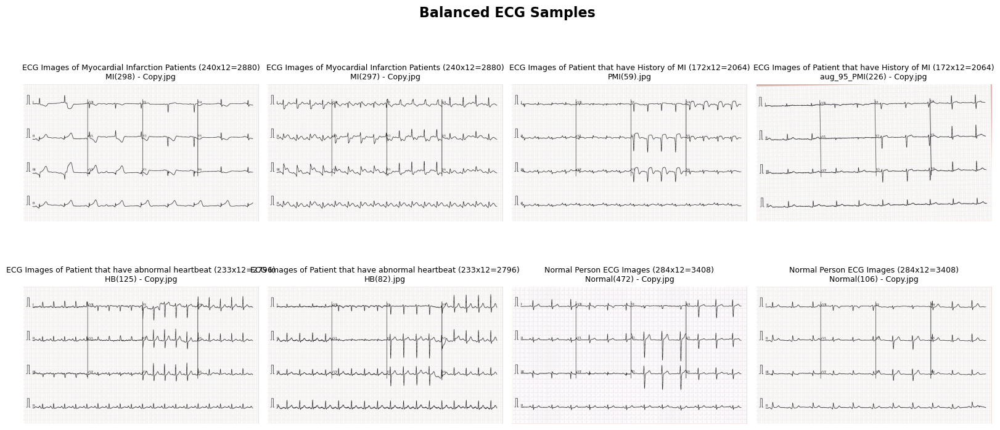

Sample visualization saved: /home/hassan_raza/Downloads/ECG/plots/balanced_ecg_samples_samples.png


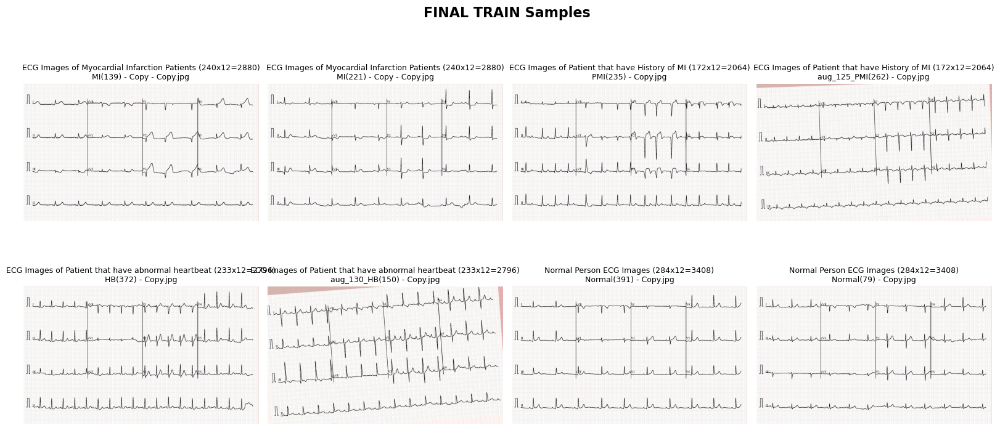

Sample visualization saved: /home/hassan_raza/Downloads/ECG/plots/final_train_samples_samples.png


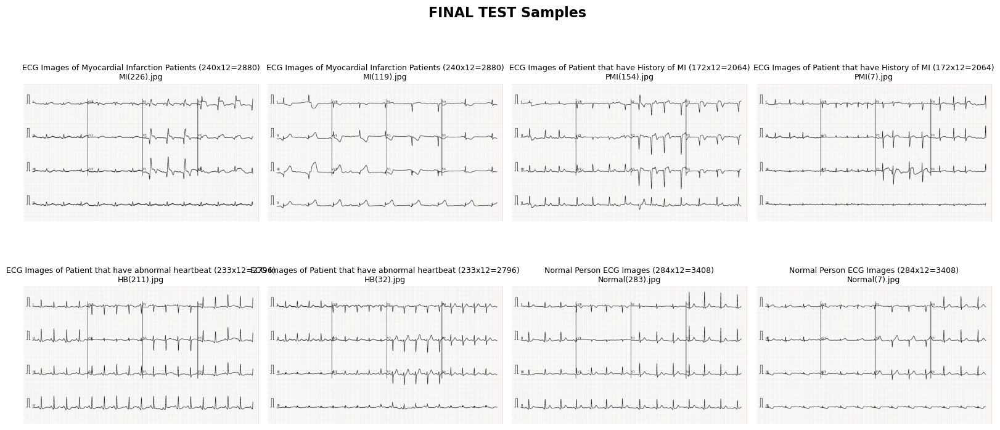

Sample visualization saved: /home/hassan_raza/Downloads/ECG/plots/final_test_samples_samples.png


In [22]:
# ============================================================
# CELL 6 — DATASET RESULTS + VISUALIZATION
# ============================================================

import os
import random
import cv2
import matplotlib.pyplot as plt
from collections import Counter


# ============================================================
# COUNT DATASET IMAGES
# ============================================================

def get_class_counts(dataset_dir):
    counts = {}

    if not os.path.exists(dataset_dir):
        return counts

    for class_name in sorted(os.listdir(dataset_dir)):
        class_path = os.path.join(dataset_dir, class_name)

        if os.path.isdir(class_path):
            count = len([
                f for f in os.listdir(class_path)
                if os.path.isfile(os.path.join(class_path, f))
            ])

            counts[class_name] = count

    return counts


# ============================================================
# PRINT DATASET RESULTS
# ============================================================

cropped_counts = get_class_counts(
    os.path.join(CROPPED_DATA_DIR, "train")
)

balanced_counts = get_class_counts(
    BALANCED_TRAIN_DIR
)

final_train_counts = get_class_counts(
    PROCESSED_TRAIN_DIR
)

final_val_counts = get_class_counts(
    PROCESSED_VAL_DIR
)

final_test_counts = get_class_counts(
    PROCESSED_TEST_DIR
)


print("\n" + "=" * 70)
print("DATASET RESULTS")
print("=" * 70)


print("\nCROPPED TRAIN:")
print("-" * 40)

cropped_total = sum(cropped_counts.values())

for cls, count in cropped_counts.items():
    print(f"{cls}: {count}")

print(f"TOTAL CROPPED TRAIN: {cropped_total}")


print("\nBALANCED TRAIN:")
print("-" * 40)

balanced_total = sum(balanced_counts.values())

for cls, count in balanced_counts.items():
    print(f"{cls}: {count}")

print(f"TOTAL BALANCED TRAIN: {balanced_total}")


print("\nFINAL TRAIN:")
print("-" * 40)

final_train_total = sum(final_train_counts.values())

for cls, count in final_train_counts.items():
    print(f"{cls}: {count}")

print(f"FINAL TRAIN: {final_train_total}")


print("\nFINAL VAL:")
print("-" * 40)

final_val_total = sum(final_val_counts.values())

for cls, count in final_val_counts.items():
    print(f"{cls}: {count}")

print(f"FINAL VAL: {final_val_total}")


print("\nFINAL TEST:")
print("-" * 40)

final_test_total = sum(final_test_counts.values())

for cls, count in final_test_counts.items():
    print(f"{cls}: {count}")

print(f"FINAL TEST: {final_test_total}")


print("\n" + "=" * 70)
print("FINAL DATASET SUMMARY")
print("=" * 70)

print(f"FINAL TRAIN: {final_train_total}")
print(f"FINAL VAL:   {final_val_total}")
print(f"FINAL TEST:  {final_test_total}")
print(f"TOTAL:       {final_train_total + final_val_total + final_test_total}")

print("=" * 70)


# ============================================================
# BAR CHART FUNCTION
# ============================================================

def plot_class_counts(counts, title):

    if not counts:
        print(f"No data available for: {title}")
        return

    classes = list(counts.keys())
    values = list(counts.values())

    plt.figure(figsize=(10, 5))

    bars = plt.bar(classes, values)

    plt.title(title)
    plt.xlabel("Class")
    plt.ylabel("Number of Images")
    plt.xticks(rotation=45)
    plt.grid(axis="y", alpha=0.3)

    for bar, value in zip(bars, values):
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height(),
            str(value),
            ha="center",
            va="bottom"
        )

    plt.tight_layout()

    # Save graph
    safe_title = (
        title.lower()
        .replace(" ", "_")
        .replace(":", "")
    )

    graph_path = os.path.join(
        PLOTS_DIR,
        f"{safe_title}.png"
    )

    os.makedirs(PLOTS_DIR, exist_ok=True)

    plt.savefig(
        graph_path,
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()

    print(f"Graph saved: {graph_path}")


# ============================================================
# VISUALIZE COUNTS
# ============================================================

plot_class_counts(
    cropped_counts,
    "Cropped Training Dataset"
)

plot_class_counts(
    balanced_counts,
    "Balanced Training Dataset"
)

plot_class_counts(
    final_train_counts,
    "FINAL TRAIN"
)

plot_class_counts(
    final_val_counts,
    "FINAL VAL"
)

plot_class_counts(
    final_test_counts,
    "FINAL TEST"
)


# ============================================================
# IMAGE SAMPLE VISUALIZATION
# ============================================================

def get_random_images(dataset_dir, samples_per_class=2):

    images = []

    if not os.path.exists(dataset_dir):
        return images

    for class_name in sorted(os.listdir(dataset_dir)):

        class_path = os.path.join(dataset_dir, class_name)

        if not os.path.isdir(class_path):
            continue

        files = [
            f for f in os.listdir(class_path)
            if os.path.isfile(os.path.join(class_path, f))
        ]

        if not files:
            continue

        selected = random.sample(
            files,
            min(samples_per_class, len(files))
        )

        for file_name in selected:

            image_path = os.path.join(
                class_path,
                file_name
            )

            img = cv2.imread(image_path)

            if img is None:
                continue

            img = cv2.cvtColor(
                img,
                cv2.COLOR_BGR2RGB
            )

            images.append(
                (img, class_name, file_name)
            )

    return images


def show_dataset_samples(
    dataset_dir,
    title,
    samples_per_class=2
):

    images = get_random_images(
        dataset_dir,
        samples_per_class
    )

    if not images:
        print(f"No images found for: {title}")
        return

    columns = 4
    rows = (len(images) + columns - 1) // columns

    plt.figure(
        figsize=(16, 4 * rows)
    )

    for i, (img, class_name, file_name) in enumerate(images):

        plt.subplot(rows, columns, i + 1)

        plt.imshow(img)

        plt.title(
            f"{class_name}\n{file_name}",
            fontsize=9
        )

        plt.axis("off")

    plt.suptitle(
        title,
        fontsize=16,
        fontweight="bold"
    )

    plt.tight_layout()

    safe_title = (
        title.lower()
        .replace(" ", "_")
        .replace(":", "")
    )

    sample_path = os.path.join(
        PLOTS_DIR,
        f"{safe_title}_samples.png"
    )

    plt.savefig(
        sample_path,
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()

    print(f"Sample visualization saved: {sample_path}")


# ============================================================
# SHOW CROPPED IMAGES
# ============================================================

show_dataset_samples(
    os.path.join(CROPPED_DATA_DIR, "train"),
    "Cropped ECG Samples",
    samples_per_class=2
)


# ============================================================
# SHOW BALANCED IMAGES
# ============================================================

show_dataset_samples(
    BALANCED_TRAIN_DIR,
    "Balanced ECG Samples",
    samples_per_class=2
)


# ============================================================
# SHOW FINAL TRAIN IMAGES
# ============================================================

show_dataset_samples(
    PROCESSED_TRAIN_DIR,
    "FINAL TRAIN Samples",
    samples_per_class=2
)


# ============================================================
# SHOW FINAL TEST IMAGES
# ============================================================

show_dataset_samples(
    PROCESSED_TEST_DIR,
    "FINAL TEST Samples",
    samples_per_class=2
)

In [24]:
# ============================================================
# FIX: RECREATE PROJECT + PROCESSED DATASET PATHS
# ============================================================

import os

# Your actual project folder
PROJECT_ROOT = "/home/hassan_raza/Downloads/ECG"

# Processed dataset
PROCESSED_DATA_DIR = os.path.join(
    PROJECT_ROOT,
    "ECG_DATA_PROCESSED"
)

PROCESSED_TRAIN_DIR = os.path.join(
    PROCESSED_DATA_DIR,
    "train"
)

PROCESSED_VAL_DIR = os.path.join(
    PROCESSED_DATA_DIR,
    "val"
)

PROCESSED_TEST_DIR = os.path.join(
    PROCESSED_DATA_DIR,
    "test"
)

# Final directories used by generators
FINAL_TRAIN_DIR = PROCESSED_TRAIN_DIR
FINAL_VAL_DIR = PROCESSED_VAL_DIR
FINAL_TEST_DIR = PROCESSED_TEST_DIR

# Other required project folders
MODELS_DIR = os.path.join(PROJECT_ROOT, "models")
RESULTS_DIR = os.path.join(PROJECT_ROOT, "results")
PLOTS_DIR = os.path.join(PROJECT_ROOT, "plots")
GRADCAM_DIR = os.path.join(PROJECT_ROOT, "gradcam")
ERROR_ANALYSIS_DIR = os.path.join(PROJECT_ROOT, "error_analysis")
REPORTS_DIR = os.path.join(PROJECT_ROOT, "reports")

# ============================================================
# CHECK EVERYTHING
# ============================================================

print("PROJECT ROOT:")
print(PROJECT_ROOT)

print("\nPROCESSED DATASET:")
print("Train:", FINAL_TRAIN_DIR)
print("Val:  ", FINAL_VAL_DIR)
print("Test: ", FINAL_TEST_DIR)

print("\nFOLDER STATUS:")
print("Train exists:", os.path.exists(FINAL_TRAIN_DIR))
print("Val exists:  ", os.path.exists(FINAL_VAL_DIR))
print("Test exists: ", os.path.exists(FINAL_TEST_DIR))

if os.path.exists(FINAL_TRAIN_DIR):
    print("\nTrain classes:", os.listdir(FINAL_TRAIN_DIR))

if os.path.exists(FINAL_VAL_DIR):
    print("Val classes:", os.listdir(FINAL_VAL_DIR))

if os.path.exists(FINAL_TEST_DIR):
    print("Test classes:", os.listdir(FINAL_TEST_DIR))

PROJECT ROOT:
/home/hassan_raza/Downloads/ECG

PROCESSED DATASET:
Train: /home/hassan_raza/Downloads/ECG/ECG_DATA_PROCESSED/train
Val:   /home/hassan_raza/Downloads/ECG/ECG_DATA_PROCESSED/val
Test:  /home/hassan_raza/Downloads/ECG/ECG_DATA_PROCESSED/test

FOLDER STATUS:
Train exists: True
Val exists:   True
Test exists:  True

Train classes: ['Normal Person ECG Images (284x12=3408)', 'ECG Images of Patient that have History of MI (172x12=2064)', 'ECG Images of Patient that have abnormal heartbeat (233x12=2796)', 'ECG Images of Myocardial Infarction Patients (240x12=2880)']
Val classes: ['Normal Person ECG Images (284x12=3408)', 'ECG Images of Patient that have History of MI (172x12=2064)', 'ECG Images of Patient that have abnormal heartbeat (233x12=2796)', 'ECG Images of Myocardial Infarction Patients (240x12=2880)']
Test classes: ['Normal Person ECG Images (284x12=3408)', 'ECG Images of Patient that have History of MI (172x12=2064)', 'ECG Images of Patient that have abnormal heartbeat

In [25]:
# ============================================================
# PREPROCESSING, AUGMENTATION & DATA GENERATORS
# ============================================================

import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

IMG_SIZE = (300, 300)
INPUT_SHAPE = (300, 300, 3)
BATCH_SIZE = 16

STAGE1_EPOCHS = 50
FINE_TUNE_EPOCHS = 15

STAGE1_LR = 1e-4
FINE_TUNE_LR = 1e-5

CLASS_WEIGHTS = None


def enhance_contrast(img, factor=1.5):
    mean = img.mean()
    img = (img - mean) * factor + mean
    return np.clip(img, 0, 255).astype("float32")


train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    rotation_range=5,
    width_shift_range=0.05,
    height_shift_range=0.05,
    shear_range=0.05,
    zoom_range=0.05,
    brightness_range=[0.9, 1.1],
    fill_mode="constant",
    cval=0,
    preprocessing_function=enhance_contrast,
)

eval_datagen = ImageDataGenerator(
    rescale=1.0 / 255
)

test_datagen = ImageDataGenerator(
    rescale=1.0 / 255
)


# ============================================================
# TRAIN GENERATOR
# ============================================================

train_generator = train_datagen.flow_from_directory(
    FINAL_TRAIN_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=True,
    seed=42,
)


# ============================================================
# VALIDATION GENERATOR
# ============================================================

val_generator = eval_datagen.flow_from_directory(
    FINAL_VAL_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False,
)


# ============================================================
# TEST GENERATOR
# ============================================================

test_generator = test_datagen.flow_from_directory(
    FINAL_TEST_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False,
)


# ============================================================
# INFORMATION
# ============================================================

print("\nGenerators created successfully.")

print("Batch size:", BATCH_SIZE)

print("\nClass indices:")
print(train_generator.class_indices)

CLASS_NAMES = list(train_generator.class_indices.keys())
NUM_CLASSES = len(CLASS_NAMES)

print("\nClasses:", NUM_CLASSES)

print("Training samples:", train_generator.samples)
print("Validation samples:", val_generator.samples)
print("Test samples:", test_generator.samples)

Found 3056 images belonging to 4 classes.
Found 607 images belonging to 4 classes.
Found 928 images belonging to 4 classes.

Generators created successfully.
Batch size: 16

Class indices:
{'ECG Images of Myocardial Infarction Patients (240x12=2880)': 0, 'ECG Images of Patient that have History of MI (172x12=2064)': 1, 'ECG Images of Patient that have abnormal heartbeat (233x12=2796)': 2, 'Normal Person ECG Images (284x12=3408)': 3}

Classes: 4
Training samples: 3056
Validation samples: 607
Test samples: 928


In [26]:
# ============================================================
# TWO-STAGE TRAINING UTILITY
# ============================================================

from tensorflow.keras import layers, models, optimizers, callbacks


def get_callbacks(name):
    return [
        callbacks.EarlyStopping(
            monitor="val_accuracy",
            patience=8,
            restore_best_weights=True
        ),

        callbacks.ModelCheckpoint(
            os.path.join(MODELS_DIR, f"{name}_checkpoint.keras"),
            monitor="val_accuracy",
            save_best_only=True
        ),

        callbacks.ReduceLROnPlateau(
            monitor="val_loss",
            factor=0.5,
            patience=4,
            min_lr=1e-7
        ),
    ]


def compile_model(model, lr):
    model.compile(
        optimizer=optimizers.Adam(
            learning_rate=lr
        ),
        loss="categorical_crossentropy",
        metrics=[
            "accuracy",
            tf.keras.metrics.Precision(name="precision"),
            tf.keras.metrics.Recall(name="recall"),
            tf.keras.metrics.AUC(name="auc"),
        ],
    )


def train_two_stage(
    model,
    base,
    name,
    train_gen,
    val_gen,
    stage1_epochs=STAGE1_EPOCHS,
    fine_tune_epochs=FINE_TUNE_EPOCHS
):

    # ========================================================
    # STAGE 1 — FEATURE EXTRACTION
    # ========================================================

    compile_model(
        model,
        STAGE1_LR
    )

    print(
        f"\n--- {name}: Stage 1 "
        "(feature extraction, base frozen) ---"
    )

    hist1 = model.fit(
        train_gen,
        validation_data=val_gen,
        epochs=stage1_epochs,
        class_weight=CLASS_WEIGHTS,
        callbacks=get_callbacks(name),
        verbose=1,
    )

    hist2 = None

    # ========================================================
    # STAGE 2 — FINE TUNING
    # ========================================================

    if base is not None:

        base.trainable = True

        # Keep BatchNorm frozen
        for layer in base.layers:
            if isinstance(
                layer,
                layers.BatchNormalization
            ):
                layer.trainable = False

        compile_model(
            model,
            FINE_TUNE_LR
        )

        print(
            f"\n--- {name}: Stage 2 "
            "(fine-tuning, base unfrozen, "
            "BatchNorm frozen) ---"
        )

        hist2 = model.fit(
            train_gen,
            validation_data=val_gen,
            epochs=fine_tune_epochs,
            class_weight=CLASS_WEIGHTS,
            callbacks=get_callbacks(
                name + "_finetuned"
            ),
            verbose=1,
        )

    return hist1, hist2


# ============================================================
# HISTORY PLOT
# ============================================================

def plot_history_flexible(
    hist1,
    hist2,
    name
):

    h1 = (
        hist1.history
        if hasattr(hist1, "history")
        else hist1
    )

    h2 = (
        hist2.history
        if hasattr(hist2, "history")
        else hist2
    ) if hist2 is not None else None

    if h1 is None:
        print(
            f"No training history available "
            f"for {name}."
        )
        return

    acc = h1["accuracy"] + (
        h2["accuracy"] if h2 else []
    )

    val_acc = h1["val_accuracy"] + (
        h2["val_accuracy"] if h2 else []
    )

    loss = h1["loss"] + (
        h2["loss"] if h2 else []
    )

    val_loss = h1["val_loss"] + (
        h2["val_loss"] if h2 else []
    )

    switch = len(h1["accuracy"])

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(12, 4)
    )

    axes[0].plot(
        acc,
        label="train"
    )

    axes[0].plot(
        val_acc,
        label="val"
    )

    axes[0].axvline(
        switch,
        color="gray",
        linestyle="--",
        label="fine-tune start"
    )

    axes[0].set_title(
        f"{name} — Accuracy"
    )

    axes[0].legend()

    axes[1].plot(
        loss,
        label="train"
    )

    axes[1].plot(
        val_loss,
        label="val"
    )

    axes[1].axvline(
        switch,
        color="gray",
        linestyle="--",
        label="fine-tune start"
    )

    axes[1].set_title(
        f"{name} — Loss"
    )

    axes[1].legend()

    plt.tight_layout()

    os.makedirs(
        os.path.join(
            PLOTS_DIR,
            "training"
        ),
        exist_ok=True
    )

    
    plt.savefig(
        os.path.join(
            PLOTS_DIR,
            "training",
            f"{name}_history.png"
        ),
        dpi=150
    )

    plt.show()

In [27]:
# ============================================================
# VGG16 MODEL
# ============================================================

from tensorflow.keras.applications import VGG16


def build_vgg16(
    input_shape=INPUT_SHAPE,
    num_classes=NUM_CLASSES
):

    base = VGG16(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape,
        pooling=None
    )

    base.trainable = False

    inputs = layers.Input(
        shape=input_shape
    )

    x = base(
        inputs,
        training=False
    )

    x = layers.GlobalAveragePooling2D()(x)

    x = layers.Dense(
        256,
        activation="relu"
    )(x)

    x = layers.Dropout(
        0.4
    )(x)

    outputs = layers.Dense(
        num_classes,
        activation="softmax"
    )(x)

    model = models.Model(
        inputs,
        outputs,
        name="vgg16_model"
    )

    return model, base

In [28]:
# ============================================================
# CHECK VGG16 MODEL
# ============================================================

vgg_local_path = os.path.join(
    MODELS_DIR,
    "vgg16.keras"
)

print(
    "VGG16 model exists locally:",
    os.path.exists(vgg_local_path)
)

if os.path.exists(vgg_local_path):
    print(
        "Path:",
        vgg_local_path
    )

VGG16 model exists locally: True
Path: /home/hassan_raza/Downloads/ECG/models/vgg16.keras


Preprocessing, Augmentation & Data Generators

In [29]:
# ============================================================
# CELL 7: PREPROCESSING, AUGMENTATION, DATA GENERATORS (FIXED)
# Uses separate physical train/val folders from Cell 6 instead of
# Keras' validation_split -- this is what actually closes the
# leakage gap (validation_split alone doesn't know about your
# balancing duplicates, physical folder separation does).
# ============================================================
IMG_SIZE = (300, 300)
INPUT_SHAPE = (300, 300, 3)
BATCH_SIZE = 8

STAGE1_EPOCHS = 50
FINE_TUNE_EPOCHS = 15
STAGE1_LR = 1e-4
FINE_TUNE_LR = 1e-5

CLASS_WEIGHTS = None  # training set is physically balanced


def enhance_contrast(img, factor=1.5):
    mean = img.mean()
    img = (img - mean) * factor + mean
    return np.clip(img, 0, 255).astype("float32")


train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    rotation_range=5,
    width_shift_range=0.05,
    height_shift_range=0.05,
    shear_range=0.05,
    zoom_range=0.05,
    brightness_range=[0.9, 1.1],
    fill_mode="constant",
    cval=0,
    preprocessing_function=enhance_contrast,
    # NOTE: no validation_split here anymore -- train and val are
    # now separate physical folders (FINAL_TRAIN_DIR / FINAL_VAL_DIR)
)

eval_datagen = ImageDataGenerator(rescale=1.0 / 255)   # no augmentation, no split needed
test_datagen = ImageDataGenerator(rescale=1.0 / 255)


assert FINAL_VAL_DIR is not None, (
    "No separate validation folder found. Your loaded/processed dataset predates "
    "the leakage fix -- rerun Cell 6 with 'reprocess' to generate a proper val split."
)

train_generator = train_datagen.flow_from_directory(
    FINAL_TRAIN_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=True,
    seed=SEED,
)

val_generator = eval_datagen.flow_from_directory(
    FINAL_VAL_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False,
)

test_generator = test_datagen.flow_from_directory(
    FINAL_TEST_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False,
)

print("Class indices:", train_generator.class_indices)
CLASS_NAMES = list(train_generator.class_indices.keys())
NUM_CLASSES = len(CLASS_NAMES)

print(f"Train: {train_generator.samples} | Val: {val_generator.samples} | Test: {test_generator.samples}")

Found 3056 images belonging to 4 classes.
Found 607 images belonging to 4 classes.
Found 928 images belonging to 4 classes.
Class indices: {'ECG Images of Myocardial Infarction Patients (240x12=2880)': 0, 'ECG Images of Patient that have History of MI (172x12=2064)': 1, 'ECG Images of Patient that have abnormal heartbeat (233x12=2796)': 2, 'Normal Person ECG Images (284x12=3408)': 3}
Train: 3056 | Val: 607 | Test: 928


In [30]:
# ============================================================
# GOOGLE DRIVE AUTHENTICATION
# ============================================================

import os

from pydrive2.auth import GoogleAuth
from pydrive2.drive import GoogleDrive

gauth = GoogleAuth(settings_file="settings.yaml")

# Check for saved credentials
if os.path.exists("mycreds.txt"):
    gauth.LoadCredentialsFile("mycreds.txt")

# No credentials → start fresh authentication
if gauth.credentials is None:
    print("Starting Google authentication...")

    gauth.LocalWebserverAuth()

    gauth.SaveCredentialsFile("mycreds.txt")

# Credentials exist but access token expired
elif gauth.access_token_expired:
    print("Refreshing Google Drive credentials...")

    gauth.Refresh()

    gauth.SaveCredentialsFile("mycreds.txt")

# Credentials are already valid
else:
    print("Using existing Google Drive credentials.")

# Create Drive service
drive_service = GoogleDrive(gauth)

print("Google Drive connection ready.")

Refreshing Google Drive credentials...
Google Drive connection ready.


In [31]:
# ============================================================
# STEP 4: CREATE / FIND TRAINED MODELS FOLDER
# ============================================================

ECG_DRIVE_FOLDER_ID = "1i7sQVpidQQctC7yO_-lhyCn66J4TRGfa"


def get_or_create_drive_subfolder(
    name,
    parent_id=ECG_DRIVE_FOLDER_ID
):

    query = (
        f"'{parent_id}' in parents "
        f"and title='{name}' "
        f"and mimeType='application/vnd.google-apps.folder' "
        f"and trashed=false"
    )

    existing = drive_service.ListFile({
        "q": query
    }).GetList()

    if existing:
        return existing[0]["id"]

    folder = drive_service.CreateFile({
        "title": name,
        "parents": [{"id": parent_id}],
        "mimeType": "application/vnd.google-apps.folder"
    })

    folder.Upload()

    return folder["id"]


DRIVE_MODELS_FOLDER_ID = get_or_create_drive_subfolder(
    "trained_models"
)

print("Google Drive connected successfully.")
print("ECG Drive folder:", ECG_DRIVE_FOLDER_ID)
print("Trained models folder:", DRIVE_MODELS_FOLDER_ID)

Google Drive connected successfully.
ECG Drive folder: 1i7sQVpidQQctC7yO_-lhyCn66J4TRGfa
Trained models folder: 1KvZ8HIP99dlj1MKw7fk2ulTOt715BgNa


In [32]:
# ============================================================
# GOOGLE DRIVE MODEL FOLDER
# ============================================================

ECG_DRIVE_FOLDER_ID = "1i7sQVpidQQctC7yO_-lhyCn66J4TRGfa"

def get_or_create_drive_subfolder(
    name,
    parent_id=ECG_DRIVE_FOLDER_ID
):

    query = (
        f"'{parent_id}' in parents "
        f"and title='{name}' "
        f"and mimeType='application/vnd.google-apps.folder' "
        f"and trashed=false"
    )

    existing = drive_service.ListFile({
        "q": query
    }).GetList()

    if existing:
        print(f"Using existing Drive folder: {name}")
        return existing[0]["id"]

    folder = drive_service.CreateFile({
        "title": name,
        "parents": [{"id": parent_id}],
        "mimeType": "application/vnd.google-apps.folder"
    })

    folder.Upload()

    print(f"Created Drive folder: {name}")

    return folder["id"]


DRIVE_MODELS_FOLDER_ID = get_or_create_drive_subfolder(
    "trained_models"
)

print("DRIVE_MODELS_FOLDER_ID:", DRIVE_MODELS_FOLDER_ID)

Using existing Drive folder: trained_models
DRIVE_MODELS_FOLDER_ID: 1KvZ8HIP99dlj1MKw7fk2ulTOt715BgNa


In [33]:
# ============================================================
# DRIVE MODEL UPLOAD HELPER
# ============================================================

def upload_file_to_drive(
    local_path,
    drive_folder_id,
    drive_filename=None
):

    if not os.path.exists(local_path):
        raise FileNotFoundError(
            f"Local file not found: {local_path}"
        )

    drive_filename = (
        drive_filename
        or os.path.basename(local_path)
    )

    query = (
        f"'{drive_folder_id}' in parents "
        f"and title='{drive_filename}' "
        f"and trashed=false"
    )

    existing = drive_service.ListFile({
        "q": query
    }).GetList()

    # Replace old version if it exists
    for f in existing:
        print(f"Replacing old Drive file: {drive_filename}")
        f.Delete()

    # Upload new file
    file_obj = drive_service.CreateFile({
        "title": drive_filename,
        "parents": [
            {"id": drive_folder_id}
        ]
    })

    file_obj.SetContentFile(local_path)
    file_obj.Upload()

    print(
        f"Uploaded to Drive successfully: {drive_filename}"
    )

    return file_obj["id"]

In [34]:
# ============================================================
# UPLOAD EXISTING TRAINED CNN MODEL TO GOOGLE DRIVE
# ============================================================

import os

cnn_model_path = "/home/hassan_raza/Downloads/ECG/models/custom_cnn.keras"

print("CNN model exists:", os.path.exists(cnn_model_path))
print("CNN model path:", cnn_model_path)

if not os.path.exists(cnn_model_path):
    raise FileNotFoundError(
        f"Custom CNN model not found:\n{cnn_model_path}"
    )

upload_file_to_drive(
    cnn_model_path,
    DRIVE_MODELS_FOLDER_ID
)

print("\nCustom CNN uploaded successfully.")

CNN model exists: True
CNN model path: /home/hassan_raza/Downloads/ECG/models/custom_cnn.keras
Replacing old Drive file: custom_cnn.keras
Uploaded to Drive successfully: custom_cnn.keras

Custom CNN uploaded successfully.


In [35]:
# ============================================================
# UPLOAD EXISTING TRAINED CNN MODEL TO GOOGLE DRIVE
# ============================================================

upload_file_to_drive(
    cnn_model_path,
    DRIVE_MODELS_FOLDER_ID
)

Replacing old Drive file: custom_cnn.keras
Uploaded to Drive successfully: custom_cnn.keras


'1ghvQTj9CndtEloJ93NcwQnG_72-4DW4c'

Two-Stage Training Utility

In [37]:
# ============================================================
# CELL 8: TWO-STAGE TRAINING UTILITY
# Stage 1: base frozen, train only the classification head (lr=1e-4)
# Stage 2: base unfrozen (BatchNorm layers stay frozen), fine-tune (lr=1e-5)
# This is called internally by build_or_load_model() from Cell 3.
# ============================================================

def get_callbacks(name):
    return [
        callbacks.EarlyStopping(monitor="val_accuracy", patience=8, restore_best_weights=True),
        callbacks.ModelCheckpoint(
            os.path.join(MODELS_DIR, f"{name}_checkpoint.keras"),
            monitor="val_accuracy", save_best_only=True
        ),
        callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=4, min_lr=1e-7),
    ]


def compile_model(model, lr):
    model.compile(
        optimizer=optimizers.Adam(learning_rate=lr),
        loss="categorical_crossentropy",
        metrics=[
            "accuracy",
            tf.keras.metrics.Precision(name="precision"),
            tf.keras.metrics.Recall(name="recall"),
            tf.keras.metrics.AUC(name="auc"),
        ],
    )


def train_two_stage(model, base, name, train_gen, val_gen,
                     stage1_epochs=STAGE1_EPOCHS, fine_tune_epochs=FINE_TUNE_EPOCHS):
    """Runs Stage 1 (frozen base) then Stage 2 (fine-tuning), if a base
    model exists. Models with no base (custom CNN, fusion models with
    permanently frozen sources) only train in Stage 1."""
    compile_model(model, STAGE1_LR)
    print(f"\n--- {name}: Stage 1 (feature extraction, base frozen) ---")
    hist1 = model.fit(
        train_gen, validation_data=val_gen, epochs=stage1_epochs,
        class_weight=CLASS_WEIGHTS, callbacks=get_callbacks(name), verbose=1,
    )

    hist2 = None
    if base is not None:
        base.trainable = True
        for layer in base.layers:
            if isinstance(layer, layers.BatchNormalization):
                layer.trainable = False

        compile_model(model, FINE_TUNE_LR)
        print(f"\n--- {name}: Stage 2 (fine-tuning, base unfrozen, BatchNorm frozen) ---")
        hist2 = model.fit(
            train_gen, validation_data=val_gen, epochs=fine_tune_epochs,
            class_weight=CLASS_WEIGHTS, callbacks=get_callbacks(name + "_finetuned"), verbose=1,
        )
    return hist1, hist2


def plot_history_flexible(hist1, hist2, name):
    """Accepts either Keras History objects OR plain dicts (loaded from
    Drive JSON) -- works whether a model was just trained or loaded."""
    h1 = hist1.history if hasattr(hist1, "history") else hist1
    h2 = (hist2.history if hasattr(hist2, "history") else hist2) if hist2 is not None else None

    if h1 is None:
        print(f"No training history available for {name} -- nothing to plot.")
        return

    acc = h1["accuracy"] + (h2["accuracy"] if h2 else [])
    val_acc = h1["val_accuracy"] + (h2["val_accuracy"] if h2 else [])
    loss = h1["loss"] + (h2["loss"] if h2 else [])
    val_loss = h1["val_loss"] + (h2["val_loss"] if h2 else [])
    switch = len(h1["accuracy"])

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    axes[0].plot(acc, label="train")
    axes[0].plot(val_acc, label="val")
    axes[0].axvline(switch, color="gray", linestyle="--", label="fine-tune start")
    axes[0].set_title(f"{name} — Accuracy")
    axes[0].legend()

    axes[1].plot(loss, label="train")
    axes[1].plot(val_loss, label="val")
    axes[1].axvline(switch, color="gray", linestyle="--", label="fine-tune start")
    axes[1].set_title(f"{name} — Loss")
    axes[1].legend()

    plt.tight_layout()
    plt.savefig(os.path.join(PLOTS_DIR, "training", f"{name}_history.png"), dpi=150)
    plt.show()

Model Definitions (All Standalone Architectures)

In [38]:
# ============================================================
# CELL 9: MODEL DEFINITIONS
# Custom CNN + 8 transfer-learning architectures, per spec Section 22.
# ============================================================

def build_custom_cnn(input_shape=INPUT_SHAPE, num_classes=NUM_CLASSES):
    """Baseline model, trained from scratch (no pretrained weights)."""
    model = models.Sequential([
        layers.Input(shape=input_shape),
        layers.Conv2D(32, 3, activation="relu", padding="same"),
        layers.BatchNormalization(),
        layers.MaxPooling2D(),

        layers.Conv2D(64, 3, activation="relu", padding="same"),
        layers.BatchNormalization(),
        layers.MaxPooling2D(),

        layers.Conv2D(128, 3, activation="relu", padding="same"),
        layers.BatchNormalization(),
        layers.MaxPooling2D(),

        layers.Conv2D(256, 3, activation="relu", padding="same"),
        layers.BatchNormalization(),
        layers.MaxPooling2D(),

        layers.GlobalAveragePooling2D(),
        layers.Dense(256, activation="relu"),
        layers.Dropout(0.4),
        layers.Dense(num_classes, activation="softmax"),
    ], name="custom_cnn")
    return model, None


def _generic_transfer_model(base_model_fn, input_shape, num_classes, name):
    """Shared pattern for VGG16, ResNet50, EfficientNetB0, InceptionV3,
    MobileNetV2, ConvNeXt -- frozen initially, generic classification head."""
    base = base_model_fn(weights="imagenet", include_top=False, input_shape=input_shape, pooling=None)
    base.trainable = False

    inputs = layers.Input(shape=input_shape)
    x = base(inputs, training=False)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(256, activation="relu")(x)
    x = layers.Dropout(0.4)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = models.Model(inputs, outputs, name=name)
    return model, base


def build_vgg16(input_shape=INPUT_SHAPE, num_classes=NUM_CLASSES):
    return _generic_transfer_model(VGG16, input_shape, num_classes, "vgg16_model")


def build_resnet50(input_shape=INPUT_SHAPE, num_classes=NUM_CLASSES):
    return _generic_transfer_model(tf.keras.applications.ResNet50, input_shape, num_classes, "resnet50_model")


def build_efficientnetb0(input_shape=INPUT_SHAPE, num_classes=NUM_CLASSES):
    return _generic_transfer_model(tf.keras.applications.EfficientNetB0, input_shape, num_classes, "efficientnetb0_model")


def build_inceptionv3(input_shape=INPUT_SHAPE, num_classes=NUM_CLASSES):
    return _generic_transfer_model(tf.keras.applications.InceptionV3, input_shape, num_classes, "inceptionv3_model")


def build_mobilenetv2(input_shape=INPUT_SHAPE, num_classes=NUM_CLASSES):
    return _generic_transfer_model(tf.keras.applications.MobileNetV2, input_shape, num_classes, "mobilenetv2_model")


def build_convnext(input_shape=INPUT_SHAPE, num_classes=NUM_CLASSES):
    if ConvNeXtTiny is None:
        return None, None
    return _generic_transfer_model(ConvNeXtTiny, input_shape, num_classes, "convnext_model")


def build_densenet121(input_shape=INPUT_SHAPE, num_classes=NUM_CLASSES):
    base = DenseNet121(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape
    )

    base.trainable = False

    inputs = layers.Input(shape=input_shape)
    x = base(inputs, training=False)

    x = layers.GlobalAveragePooling2D()(x)

    x = layers.Dense(256, activation="relu")(x)
    x = layers.Dropout(0.4)(x)

    outputs = layers.Dense(
        num_classes,
        activation="softmax"
    )(x)

    model = models.Model(
        inputs,
        outputs,
        name="densenet121_model"
    )

    return model, base

VIT_IMG_SIZE = 224

# ============================================================
# VISION TRANSFORMER — MODEL BUILDER
# ============================================================

def build_vit(
    input_shape=INPUT_SHAPE,
    num_classes=NUM_CLASSES
):
    inputs = layers.Input(shape=input_shape)

    patch_size = 25
    num_patches = (input_shape[0] // patch_size) * (input_shape[1] // patch_size)

    projection_dim = 64
    num_heads = 4
    transformer_units = [projection_dim * 2, projection_dim]
    transformer_layers = 4

    x = layers.Conv2D(
        projection_dim,
        kernel_size=patch_size,
        strides=patch_size,
        padding="valid"
    )(inputs)

    x = layers.Reshape(
        (num_patches, projection_dim)
    )(x)

    positions = tf.range(
        start=0,
        limit=num_patches,
        delta=1
    )

    position_embedding = layers.Embedding(
        input_dim=num_patches,
        output_dim=projection_dim
    )(positions)

    x = x + position_embedding

    for _ in range(transformer_layers):

        x1 = layers.LayerNormalization(
            epsilon=1e-6
        )(x)

        attention_output = layers.MultiHeadAttention(
            num_heads=num_heads,
            key_dim=projection_dim
        )(x1, x1)

        x2 = layers.Add()([
            attention_output,
            x
        ])

        x3 = layers.LayerNormalization(
            epsilon=1e-6
        )(x2)

        x3 = layers.Dense(
            transformer_units[0],
            activation=tf.nn.gelu
        )(x3)

        x3 = layers.Dropout(0.1)(x3)

        x3 = layers.Dense(
            transformer_units[1],
            activation=tf.nn.gelu
        )(x3)

        x = layers.Add()([
            x3,
            x2
        ])

    x = layers.LayerNormalization(
        epsilon=1e-6
    )(x)

    x = layers.GlobalAveragePooling1D()(x)

    x = layers.Dense(
        256,
        activation="gelu"
    )(x)

    x = layers.Dropout(0.4)(x)

    outputs = layers.Dense(
        num_classes,
        activation="softmax"
    )(x)

    model = models.Model(
        inputs,
        outputs,
        name="vision_transformer"
    )

    return model, None

In [39]:
#Create folder to save graphs 

import os

PLOTS_DIR = "/home/hassan_raza/Downloads/ECG/plots"

os.makedirs(
    os.path.join(PLOTS_DIR, "training"),
    exist_ok=True
)

print("Training plots folder ready:")
print(os.path.join(PLOTS_DIR, "training"))

Training plots folder ready:
/home/hassan_raza/Downloads/ECG/plots/training


Train All 9 Standalone Models (using Cell 3's retrain-or-load system)

1/9: CUSTOM CNN (baseline)
[custom_cnn] LOCAL MODEL FOUND
Path: /home/hassan_raza/Downloads/ECG/models/custom_cnn.keras
[custom_cnn] Training history loaded.
[custom_cnn] Loaded from local storage.


I0000 00:00:1789284743.022914 2948049 gpu_device.cc:2043] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 3809 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3070, pci bus id: 0000:08:00.0, compute capability: 8.6


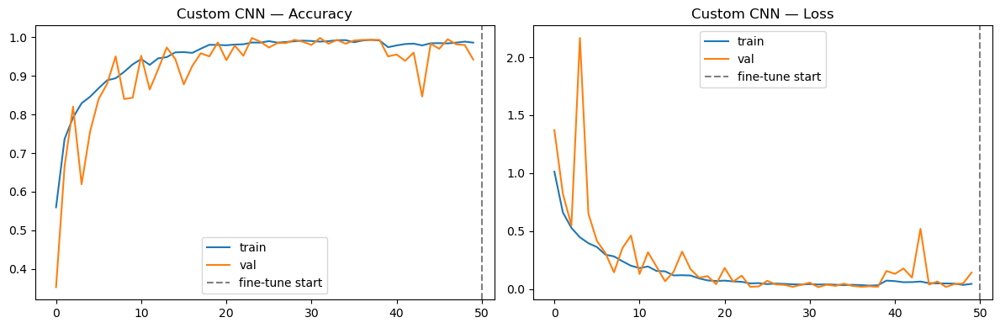

In [40]:
print("=" * 60)
print("1/9: CUSTOM CNN (baseline)")
print("=" * 60)

cnn_model, cnn_base, cnn_hist1, cnn_hist2 = train_or_load_local_model(
    "custom_cnn",
    build_custom_cnn,
    train_generator,
    val_generator
)

plot_history_flexible(
    cnn_hist1,
    cnn_hist2,
    "Custom CNN"
)

2/9: VGG16
[vgg16] LOCAL MODEL FOUND
Path: /home/hassan_raza/Downloads/ECG/models/vgg16.keras
[vgg16] Training history loaded.
[vgg16] Loaded from local storage.


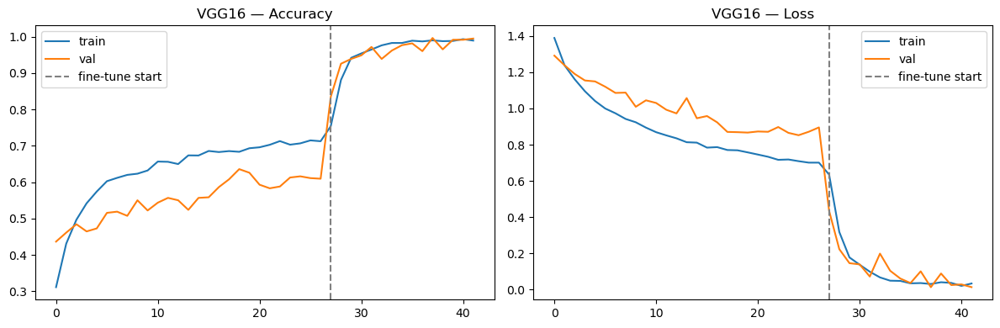

In [41]:
print("=" * 60)
print("2/9: VGG16")
print("=" * 60)

vgg_model, vgg_base, vgg_hist1, vgg_hist2 = train_or_load_local_model(
    "vgg16",
    build_vgg16,
    train_generator,
    val_generator
)

plot_history_flexible(
    vgg_hist1,
    vgg_hist2,
    "VGG16"
)

3/9: DENSENET121 (primary model)
[densenet121] LOCAL MODEL FOUND
Path: /home/hassan_raza/Downloads/ECG/models/densenet121.keras
[densenet121] Training history loaded.
[densenet121] Loaded from local storage.


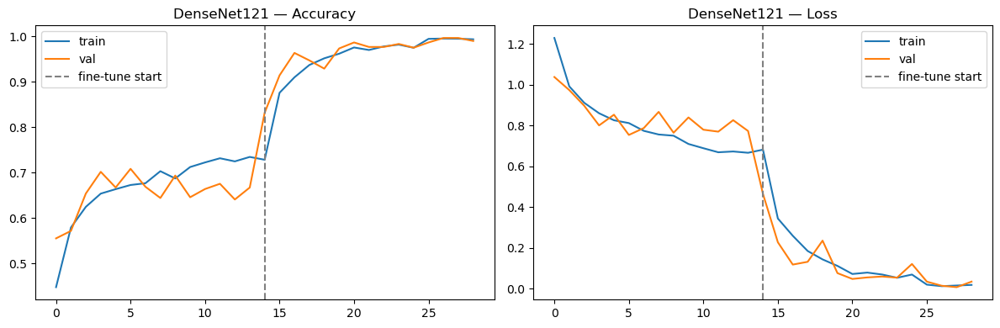

In [42]:
print("=" * 60)
print("3/9: DENSENET121 (primary model)")
print("=" * 60)

dense_model, dense_base, dense_hist1, dense_hist2 = train_or_load_local_model(
    "densenet121",
    build_densenet121,
    train_generator,
    val_generator
)

plot_history_flexible(
    dense_hist1,
    dense_hist2,
    "DenseNet121"
)

4/9: RESNET50
[resnet50] LOCAL MODEL FOUND
Path: /home/hassan_raza/Downloads/ECG/models/resnet50.keras
[resnet50] Training history loaded.
[resnet50] Loaded from local storage.


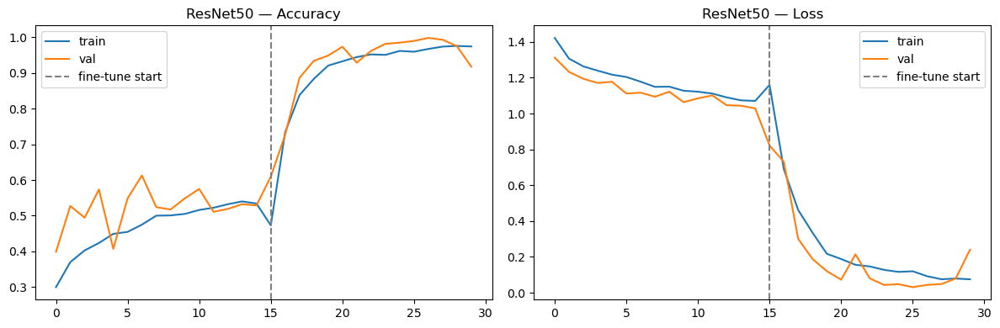

In [43]:
print("=" * 60)
print("4/9: RESNET50")
print("=" * 60)

resnet_model, resnet_base, resnet_hist1, resnet_hist2 = train_or_load_local_model(
    "resnet50", build_resnet50, train_generator, val_generator
)

plot_history_flexible(resnet_hist1, resnet_hist2, "ResNet50")

5/9: CONVNEXT
[convnext] LOCAL MODEL FOUND
Path: /home/hassan_raza/Downloads/ECG/models/convnext.keras
[convnext] Training history loaded.
[convnext] Loaded from local storage.


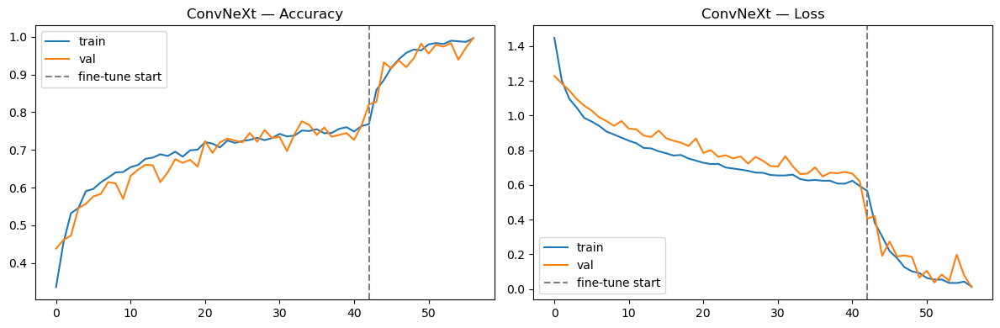

In [44]:
print("=" * 60)
print("5/9: CONVNEXT")
print("=" * 60)

if ConvNeXtTiny is None:
    print("ConvNeXtTiny unavailable in this TensorFlow version -- skipping.")
    convnext_model, convnext_base, convnext_hist1, convnext_hist2 = None, None, None, None
else:
    convnext_model, convnext_base, convnext_hist1, convnext_hist2 = train_or_load_local_model(
        "convnext", build_convnext, train_generator, val_generator
    )
    plot_history_flexible(convnext_hist1, convnext_hist2, "ConvNeXt")

6/9: EFFICIENTNETB0
[efficientnetb0] LOCAL MODEL FOUND
Path: /home/hassan_raza/Downloads/ECG/models/efficientnetb0.keras
[efficientnetb0] Training history loaded.
[efficientnetb0] Loaded from local storage.


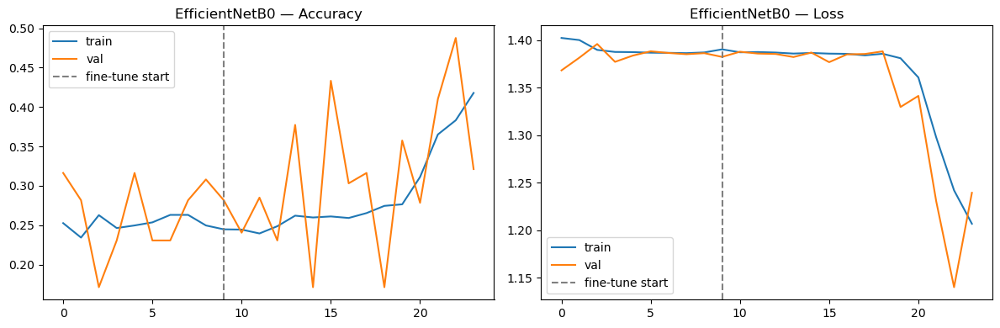

In [45]:
print("=" * 60)
print("6/9: EFFICIENTNETB0")
print("=" * 60)
efficientnet_model, efficientnet_base, efficientnet_hist1, efficientnet_hist2 = train_or_load_local_model(
    "efficientnetb0", build_efficientnetb0, train_generator, val_generator
)
plot_history_flexible(efficientnet_hist1, efficientnet_hist2, "EfficientNetB0")

7/9: INCEPTIONV3
[inceptionv3] LOCAL MODEL FOUND
Path: /home/hassan_raza/Downloads/ECG/models/inceptionv3.keras
[inceptionv3] Training history loaded.
[inceptionv3] Loaded from local storage.


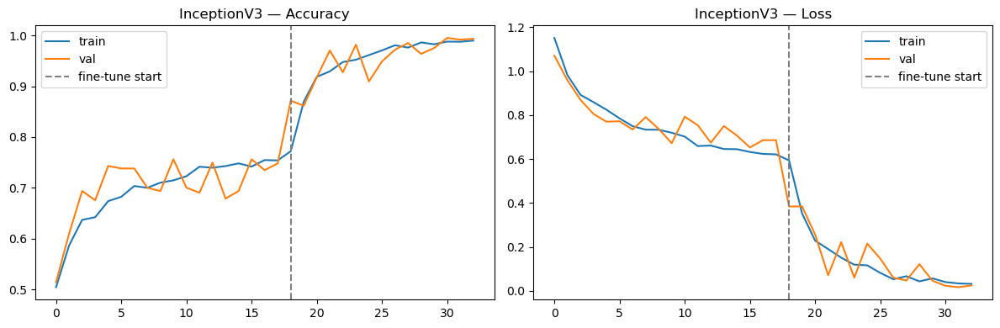

In [46]:
print("=" * 60)
print("7/9: INCEPTIONV3")
print("=" * 60)
inception_model, inception_base, inception_hist1, inception_hist2 = train_or_load_local_model(
    "inceptionv3", build_inceptionv3, train_generator, val_generator
)
plot_history_flexible(inception_hist1, inception_hist2, "InceptionV3")

8/9: MOBILENETV2
[mobilenetv2] LOCAL MODEL FOUND
Path: /home/hassan_raza/Downloads/ECG/models/mobilenetv2.keras
[mobilenetv2] Training history loaded.
[mobilenetv2] Loaded from local storage.


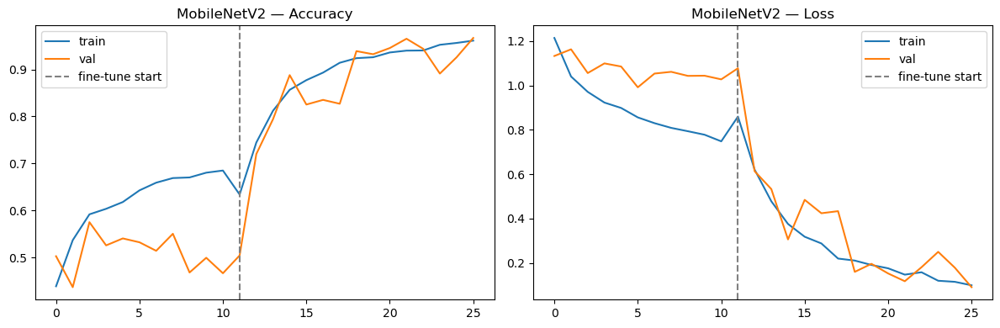

In [47]:
print("=" * 60)
print("8/9: MOBILENETV2")
print("=" * 60)
mobilenet_model, mobilenet_base, mobilenet_hist1, mobilenet_hist2 = train_or_load_local_model(
    "mobilenetv2", build_mobilenetv2, train_generator, val_generator
)
plot_history_flexible(mobilenet_hist1, mobilenet_hist2, "MobileNetV2")

9/9: VISION TRANSFORMER (ViT)
[vit] LOCAL MODEL FOUND
Path: /home/hassan_raza/Downloads/ECG/models/vit.keras
[vit] Training history loaded.
[vit] Loaded from local storage.


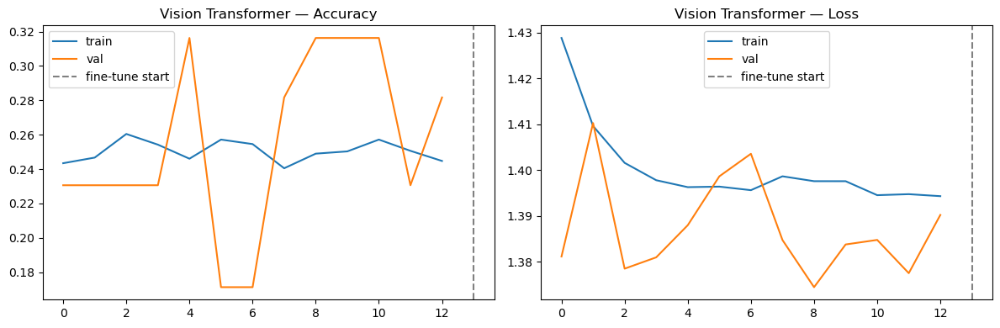

In [48]:
# ============================================================
# 9/9: VISION TRANSFORMER (ViT)
# ============================================================

print("=" * 60)
print("9/9: VISION TRANSFORMER (ViT)")
print("=" * 60)

vit_model, vit_base, vit_hist1, vit_hist2 = train_or_load_local_model(
    "vit",
    build_vit,
    train_generator,
    val_generator
)

plot_history_flexible(
    vit_hist1,
    vit_hist2,
    "Vision Transformer"
)

Feature-Level Fusion Models (DenseNet121+VGG16 and DenseNet121+ResNet50)

In [49]:
# ============================================================
# DRIVE IMPORTS
# ============================================================

from pydrive2.auth import GoogleAuth
from pydrive2.drive import GoogleDrive

print("PyDrive2 imported successfully.")

PyDrive2 imported successfully.


In [50]:
import os

os.remove("mycreds.txt")
print("Old credentials deleted.")


Old credentials deleted.


In [51]:
# ============================================================
# STEP 1: CREATE GOOGLE DRIVE OAUTH SETTINGS
# ============================================================

settings_content = """
client_config_backend: file
client_config_file: client_secrets.json

save_credentials: True
save_credentials_backend: file
save_credentials_file: mycreds.txt

get_refresh_token: True

oauth_scope:
  - https://www.googleapis.com/auth/drive
"""

with open("settings.yaml", "w") as f:
    f.write(settings_content)

print("settings.yaml created successfully.")

settings.yaml created successfully.


In [52]:
# ============================================================
# STEP 2: FRESH GOOGLE AUTHENTICATION
# ============================================================

from pydrive2.auth import GoogleAuth
from pydrive2.drive import GoogleDrive

gauth = GoogleAuth(
    settings_file="settings.yaml"
)

# Fresh authentication
gauth.LocalWebserverAuth()

# Save credentials containing refresh token
gauth.SaveCredentialsFile("mycreds.txt")

drive_service = GoogleDrive(gauth)

print("Google Drive authentication successful.")
print("Credentials saved to mycreds.txt")

/home/hassan_raza/.local/lib/python3.13/site-packages/oauth2client/_helpers.py:255: UserWarning: Cannot access mycreds.txt: No such file or directory
  warnings.warn(_MISSING_FILE_MESSAGE.format(filename))


Your browser has been opened to visit:

    https://accounts.google.com/o/oauth2/auth?client_id=694957623143-lu9t72qco36kh39t5rtqtj25q3dqth4i.apps.googleusercontent.com&redirect_uri=http%3A%2F%2Flocalhost%3A8080%2F&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive&access_type=offline&response_type=code&approval_prompt=force

Authentication successful.
Google Drive authentication successful.
Credentials saved to mycreds.txt


In [53]:
# ============================================================
# STEP 3: VERIFY REFRESH TOKEN
# ============================================================

print(
    "Refresh token available:",
    gauth.credentials.refresh_token is not None
)

Refresh token available: True


In [54]:
# ============================================================
# STEP 5: TEST DRIVE CONNECTION
# ============================================================

files = drive_service.ListFile({
    "q": f"'{ECG_DRIVE_FOLDER_ID}' in parents and trashed=false"
}).GetList()

print("Drive connection working.")
print("Items found in ECG Drive folder:", len(files))

for f in files[:10]:
    print("-", f["title"])

Drive connection working.
Items found in ECG Drive folder: 6
- ECG_DATA_PROCESSED
- results
- trained_models
- ECG_FINAL_PROJECT.ipynb
- client_secrets.json
- ECG_DATA


In [55]:
# ============================================================
# CELL 11: FEATURE-LEVEL FUSION MODELS
# Per spec Sections 25-26. Combines internal feature vectors from
# two ALREADY-TRAINED models (not fresh ImageNet weights) into a
# joint classifier. Both source models stay frozen -- only the
# new fusion head trains.
# ============================================================

def build_feature_fusion_model(
    model_a,
    model_b,
    input_shape=INPUT_SHAPE,
    num_classes=NUM_CLASSES,
    name="fusion_model"
):
    with tf.device("/GPU:0"):

        # Create GPU copies of the already-trained models
        gpu_model_a = tf.keras.models.clone_model(model_a)
        gpu_model_b = tf.keras.models.clone_model(model_b)

        gpu_model_a.set_weights(model_a.get_weights())
        gpu_model_b.set_weights(model_b.get_weights())

        gpu_model_a.trainable = False
        gpu_model_b.trainable = False

        # Feature extractors
        feat_a = models.Model(
            gpu_model_a.input,
            gpu_model_a.layers[-2].output,
            name=f"{name}_feat_a"
        )

        feat_b = models.Model(
            gpu_model_b.input,
            gpu_model_b.layers[-2].output,
            name=f"{name}_feat_b"
        )

        inputs = layers.Input(shape=input_shape)

        fa = feat_a(inputs, training=False)
        fb = feat_b(inputs, training=False)

        x = layers.Concatenate()([fa, fb])
        x = layers.Dense(256, activation="relu")(x)
        x = layers.Dropout(0.4)(x)
        x = layers.Dense(128, activation="relu")(x)
        x = layers.Dropout(0.3)(x)

        outputs = layers.Dense(
            num_classes,
            activation="softmax"
        )(x)

        fusion_model = models.Model(
            inputs,
            outputs,
            name=name
        )

    return fusion_model, None

FUSION 1/2: DenseNet121 + VGG16
[fusion_densenet_vgg] LOCAL MODEL FOUND
Path: /home/hassan_raza/Downloads/ECG/models/fusion_densenet_vgg.keras
[fusion_densenet_vgg] Training history loaded.
[fusion_densenet_vgg] Loaded from local storage.


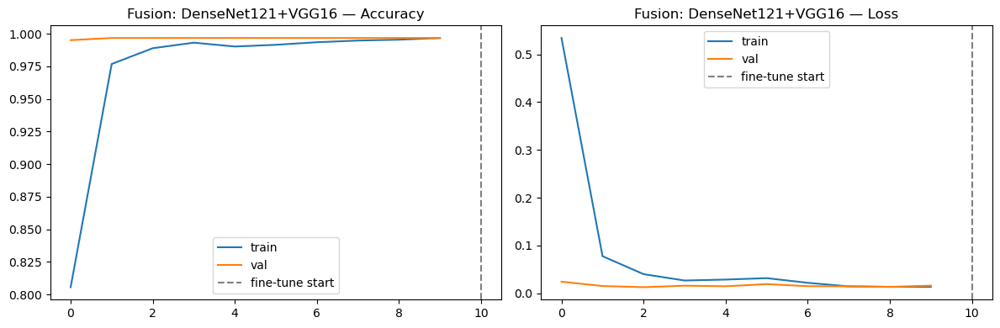

In [56]:
print("=" * 60)
print("FUSION 1/2: DenseNet121 + VGG16")
print("=" * 60)

def _build_fusion_dv():
    return build_feature_fusion_model(
        dense_model,
        vgg_model,
        name="fusion_densenet_vgg"
    )

fusion_dv_model, fusion_dv_base, fusion_dv_hist1, fusion_dv_hist2 = train_or_load_local_model(
    "fusion_densenet_vgg",
    _build_fusion_dv,
    train_generator,
    val_generator
)

plot_history_flexible(
    fusion_dv_hist1,
    fusion_dv_hist2,
    "Fusion: DenseNet121+VGG16"
)

FUSION 2/2: DenseNet121 + ResNet50 (Priority 1 per spec Section 70)
[fusion_densenet_resnet] LOCAL MODEL FOUND
Path: /home/hassan_raza/Downloads/ECG/models/fusion_densenet_resnet.keras
[fusion_densenet_resnet] Training history loaded.
[fusion_densenet_resnet] Loaded from local storage.


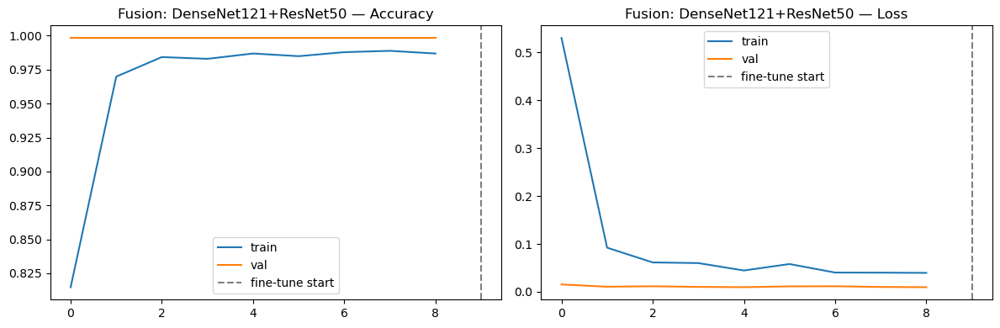

In [57]:
print("=" * 60)
print("FUSION 2/2: DenseNet121 + ResNet50 (Priority 1 per spec Section 70)")
print("=" * 60)

def _build_fusion_dr():
    return build_feature_fusion_model(
        dense_model,
        resnet_model,
        name="fusion_densenet_resnet"
    )

fusion_dr_model, fusion_dr_base, fusion_dr_hist1, fusion_dr_hist2 = train_or_load_local_model(
    "fusion_densenet_resnet",
    _build_fusion_dr,
    train_generator,
    val_generator
)

plot_history_flexible(
    fusion_dr_hist1,
    fusion_dr_hist2,
    "Fusion: DenseNet121+ResNet50"
)

Multi-Model Ensemble (Decision-Level Fusion)

Saved ensemble results found at:
  /home/hassan_raza/Downloads/ECG/results/predictions/ensemble_cache.npz
Use saved results instead of rerunning prediction? (y/n): y
Using saved ensemble results.

=== Ensemble (Soft-Voting) ===
                                                                  precision    recall  f1-score   support

      ECG Images of Myocardial Infarction Patients (240x12=2880)       1.00      1.00      1.00       239
     ECG Images of Patient that have History of MI (172x12=2064)       1.00      1.00      1.00       172
ECG Images of Patient that have abnormal heartbeat (233x12=2796)       1.00      0.99      0.99       233
                          Normal Person ECG Images (284x12=3408)       0.99      1.00      0.99       284

                                                        accuracy                           1.00       928
                                                       macro avg       1.00      1.00      1.00       928
                            

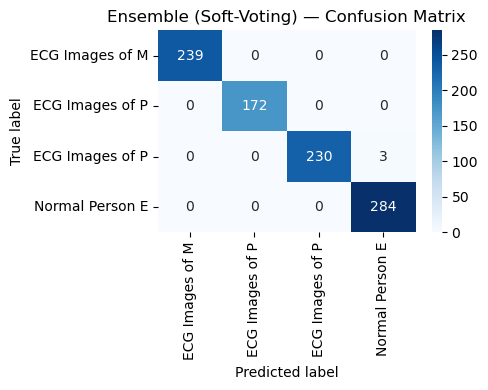

In [62]:
# ============================================================
# CELL 12: MULTI-MODEL ENSEMBLE (Priority 2 per spec Section 70)
# Soft-voting: averages predicted probabilities across selected
# models. Also computes per-model predictions needed later for
# the Consensus Score (Cell 13).
#
# Adds caching: if ensemble predictions were already computed and
# saved to disk, ask whether to reuse them or rerun from scratch.
# ============================================================

def get_ensemble_predictions(model_dict, test_gen):
    test_gen.reset()
    y_true = test_gen.classes[:test_gen.samples]

    per_model_probs = {}

    for m_name, model in model_dict.items():
        if model is None:
            print(f"Skipping {m_name} (not available)")
            continue

        print(f"\nTesting: {m_name}")
        test_gen.reset()

        try:
            with tf.device("/CPU:0"):
                probs = model.predict(
                    test_gen,
                    verbose=0
                )[:test_gen.samples]

            per_model_probs[m_name] = probs
            print(f"  {m_name}: predictions collected")

        except Exception as e:
            print(f"  ❌ {m_name} FAILED")
            print(f"  Error: {type(e).__name__}: {e}")

    if not per_model_probs:
        raise RuntimeError("No model produced predictions.")

    ensemble_probs = np.mean(
        list(per_model_probs.values()),
        axis=0
    )

    return y_true, per_model_probs, ensemble_probs


def evaluate_predictions(y_true, y_prob, name):
    """Shared evaluation used by every model AND the ensemble --
    same metrics/plots as your individual model evaluations."""
    y_pred = np.argmax(y_prob, axis=1)
    y_true_onehot = label_binarize(y_true, classes=list(range(NUM_CLASSES)))

    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average="macro", zero_division=0)
    rec = recall_score(y_true, y_pred, average="macro", zero_division=0)
    f1 = f1_score(y_true, y_pred, average="macro", zero_division=0)
    try:
        auc_score = roc_auc_score(y_true_onehot, y_prob, average="macro", multi_class="ovr")
    except ValueError:
        auc_score = np.nan

    print(f"\n=== {name} ===")
    report = classification_report(y_true, y_pred, target_names=CLASS_NAMES, zero_division=0)
    print(report)
    safe_name = name.replace(" ", "_").replace(":", "").replace("+", "_")
    with open(os.path.join(RESULTS_DIR, "metrics", f"{safe_name}_report.txt"), "w") as f:
        f.write(report)

    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=[c[:15] for c in CLASS_NAMES],
                yticklabels=[c[:15] for c in CLASS_NAMES])
    plt.title(f"{name} — Confusion Matrix")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")
    plt.tight_layout()
    plt.savefig(os.path.join(PLOTS_DIR, "confusion_matrix", f"{safe_name}_cm.png"), dpi=150)
    plt.show()

    return {"Model": name, "Accuracy": acc, "Precision": prec, "Recall": rec, "F1": f1, "AUC": auc_score,
            "y_true": y_true, "y_pred": y_pred, "y_prob": y_prob}


# Build the ensemble from your strongest models (per spec Section 57:
# "select the strongest models" rather than blindly including everything)
ensemble_models = {
    "DenseNet121": dense_model,
    "ResNet50": resnet_model,
    "Fusion: DenseNet+VGG": fusion_dv_model,
    "Fusion: DenseNet+ResNet": fusion_dr_model,
}

# ------------------------------------------------------------
# CACHING: check for previously saved ensemble predictions
# ------------------------------------------------------------
ensemble_cache_path = os.path.join(RESULTS_DIR, "predictions", "ensemble_cache.npz")

def _safe_key(name):
    return "prob__" + name.replace(" ", "_").replace(":", "").replace("+", "_")

use_saved = False

if os.path.exists(ensemble_cache_path):
    choice = input(
        f"Saved ensemble results found at:\n  {ensemble_cache_path}\n"
        "Use saved results instead of rerunning prediction? (y/n): "
    ).strip().lower()
    use_saved = choice == "y"
else:
    print("No local results found, rerunning the cell.")

if use_saved:
    print("Using saved ensemble results.")
    cache = np.load(ensemble_cache_path, allow_pickle=True)
    y_true_all = cache["y_true"]
    ensemble_probs = cache["ensemble_probs"]
    per_model_probs = {
        name: cache[_safe_key(name)]
        for name in ensemble_models
        if _safe_key(name) in cache
    }
else:
    if os.path.exists(ensemble_cache_path):
        print("Rerunning ensemble prediction (ignoring saved results)...")
    y_true_all, per_model_probs, ensemble_probs = get_ensemble_predictions(ensemble_models, test_generator)

    # Save results for next time
    os.makedirs(os.path.dirname(ensemble_cache_path), exist_ok=True)
    save_dict = {"y_true": y_true_all, "ensemble_probs": ensemble_probs}
    for name, probs in per_model_probs.items():
        save_dict[_safe_key(name)] = probs
    np.savez(ensemble_cache_path, **save_dict)
    print(f"Results saved to: {ensemble_cache_path}")

# Evaluation (report + confusion matrix) always runs on whichever
# probs are now in memory -- cheap, no model inference involved.
ensemble_result = evaluate_predictions(y_true_all, ensemble_probs, "Ensemble (Soft-Voting)")

Model Consensus Score

Saved consensus results found at:
  /home/hassan_raza/Downloads/ECG/results/predictions/consensus_scores.csv
Use saved results instead of rerunning? (y/n): y
Using saved consensus results.

Consensus computed across 4 models: ['DenseNet121', 'ResNet50', 'Fusion: DenseNet+VGG', 'Fusion: DenseNet+ResNet']

Consensus score distribution:
  100% agreement: 924 / 928 images
  75%+ agreement: 927 / 928 images
  Below 50% agreement: 0 / 928 images
  Average consensus: 99.9%

Accuracy when consensus >= 75%: 99.8%
Accuracy when consensus < 75%:  100.0%
(If the first number is meaningfully higher, that supports RQ3 -- disagreement flags unreliable predictions)


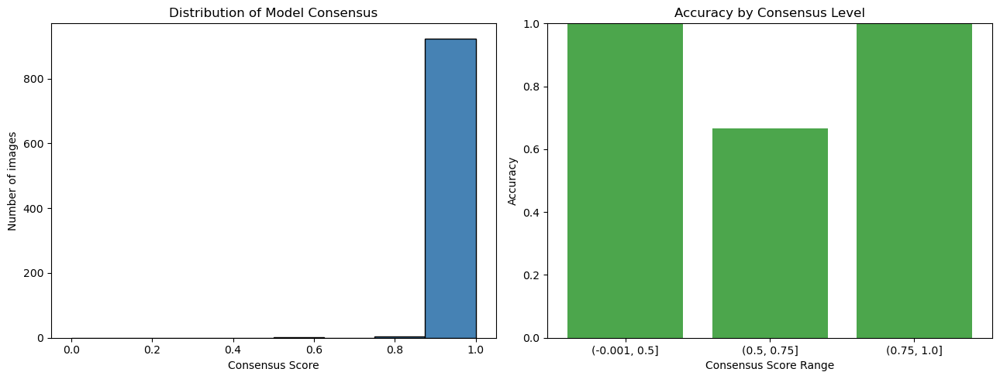

In [63]:
# ============================================================
# CELL 13: MODEL CONSENSUS SCORE (Priority 3 per spec Section 70)
# Measures how strongly the individual models agree on each
# prediction. This is a PROJECT-DEFINED metric, not a clinically
# validated medical score -- stated explicitly per spec Section 6.
#
# Adds caching: if consensus scores were already computed and saved
# to disk, ask whether to reuse them or rerun from scratch.
# ============================================================

def compute_consensus_scores(per_model_probs):
    """For each test image, finds the majority-voted class across all
    models in the ensemble, then computes what fraction of models
    agreed with that majority.

    Returns:
        consensus_scores: array of floats in [0, 1], one per image
        majority_predictions: array of predicted class indices (the consensus prediction)
        per_model_predicted_classes: dict of {model_name: predicted class array}
    """
    model_names = list(per_model_probs.keys())
    n_images = len(next(iter(per_model_probs.values())))
    n_models = len(model_names)

    per_model_predicted_classes = {
        name: np.argmax(probs, axis=1) for name, probs in per_model_probs.items()
    }

    consensus_scores = np.zeros(n_images)
    majority_predictions = np.zeros(n_images, dtype=int)

    for i in range(n_images):
        votes = [per_model_predicted_classes[name][i] for name in model_names]
        vote_counts = np.bincount(votes, minlength=NUM_CLASSES)
        majority_class = np.argmax(vote_counts)
        agreement_count = vote_counts[majority_class]

        majority_predictions[i] = majority_class
        consensus_scores[i] = agreement_count / n_models

    return consensus_scores, majority_predictions, per_model_predicted_classes


# ------------------------------------------------------------
# CACHING: check for previously saved consensus results
# ------------------------------------------------------------
consensus_cache_path = os.path.join(RESULTS_DIR, "predictions", "consensus_scores.csv")

use_saved = False

if os.path.exists(consensus_cache_path):
    choice = input(
        f"Saved consensus results found at:\n  {consensus_cache_path}\n"
        "Use saved results instead of rerunning? (y/n): "
    ).strip().lower()
    use_saved = choice == "y"
else:
    print("No local results found, rerunning the cell.")

if use_saved:
    print("Using saved consensus results.")
    consensus_df = pd.read_csv(consensus_cache_path)

    consensus_scores = consensus_df["consensus_score"].to_numpy()
    majority_predictions = np.array(
        [CLASS_NAMES.index(c) for c in consensus_df["majority_prediction"]]
    )

    pred_cols = [c for c in consensus_df.columns if c.endswith("_prediction") and c != "majority_prediction"]
    per_model_predicted_classes = {
        col[: -len("_prediction")]: np.array([CLASS_NAMES.index(c) for c in consensus_df[col]])
        for col in pred_cols
    }
else:
    if os.path.exists(consensus_cache_path):
        print("Rerunning consensus computation (ignoring saved results)...")

    consensus_scores, majority_predictions, per_model_predicted_classes = compute_consensus_scores(per_model_probs)

    consensus_df = pd.DataFrame({
        "true_label": [CLASS_NAMES[i] for i in y_true_all],
        "majority_prediction": [CLASS_NAMES[i] for i in majority_predictions],
        "consensus_score": consensus_scores,
        "correct": (majority_predictions == y_true_all),
    })
    for name, preds in per_model_predicted_classes.items():
        consensus_df[f"{name}_prediction"] = [CLASS_NAMES[i] for i in preds]

    os.makedirs(os.path.dirname(consensus_cache_path), exist_ok=True)
    consensus_df.to_csv(consensus_cache_path, index=False)
    print(f"Results saved to: {consensus_cache_path}")

# ------------------------------------------------------------
# Everything below runs regardless of cache path -- cheap to
# recompute from whichever consensus_df/scores are now in memory.
# ------------------------------------------------------------
print(f"\nConsensus computed across {len(per_model_predicted_classes)} models: {list(per_model_predicted_classes.keys())}")
print(f"\nConsensus score distribution:")
print(f"  100% agreement: {(consensus_scores == 1.0).sum()} / {len(consensus_scores)} images")
print(f"  75%+ agreement: {(consensus_scores >= 0.75).sum()} / {len(consensus_scores)} images")
print(f"  Below 50% agreement: {(consensus_scores < 0.5).sum()} / {len(consensus_scores)} images")
print(f"  Average consensus: {consensus_scores.mean()*100:.1f}%")

# Quick sanity check -- does higher consensus correlate with correctness?
# (This is exactly the kind of evidence spec Section 65's RQ3 asks about)
high_consensus_acc = consensus_df[consensus_df["consensus_score"] >= 0.75]["correct"].mean()
low_consensus_acc = consensus_df[consensus_df["consensus_score"] < 0.75]["correct"].mean()
print(f"\nAccuracy when consensus >= 75%: {high_consensus_acc*100:.1f}%")
print(f"Accuracy when consensus < 75%:  {low_consensus_acc*100:.1f}%")
print("(If the first number is meaningfully higher, that supports RQ3 -- disagreement flags unreliable predictions)")

# ============================================================
# CONSENSUS VISUALIZATIONS
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(13, 5))

axes[0].hist(consensus_scores, bins=np.linspace(0, 1, 9), edgecolor="black", color="steelblue")
axes[0].set_xlabel("Consensus Score")
axes[0].set_ylabel("Number of images")
axes[0].set_title("Distribution of Model Consensus")

consensus_bins = pd.cut(consensus_df["consensus_score"], bins=[0, 0.5, 0.75, 1.0], include_lowest=True)
acc_by_consensus = consensus_df.groupby(consensus_bins, observed=True)["correct"].mean()

axes[1].bar(acc_by_consensus.index.astype(str), acc_by_consensus.values, color="green", alpha=0.7)
axes[1].set_xlabel("Consensus Score Range")
axes[1].set_ylabel("Accuracy")
axes[1].set_title("Accuracy by Consensus Level")
axes[1].set_ylim(0, 1)

plt.tight_layout()
plt.savefig(os.path.join(PLOTS_DIR, "robustness", "consensus_analysis.png"), dpi=150)
plt.show()

Uncertainty Estimation (Monte Carlo Dropout)

Saved uncertainty results found at:
  /home/hassan_raza/Downloads/ECG/results/predictions/uncertainty_scores.csv
Use saved results instead of rerunning MC Dropout? (y/n): y
Using saved uncertainty results.
Uncertainty score range: 0.0000 - 0.1440
Median (threshold): 0.0000
Low uncertainty: 464 images
High uncertainty: 464 images

Accuracy when uncertainty = Low:  100.0%
Accuracy when uncertainty = High: 99.4%
(If Low uncertainty has meaningfully higher accuracy, that supports RQ4)


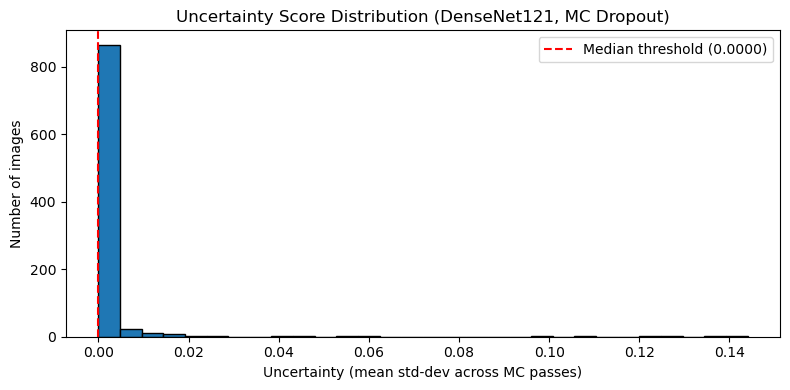

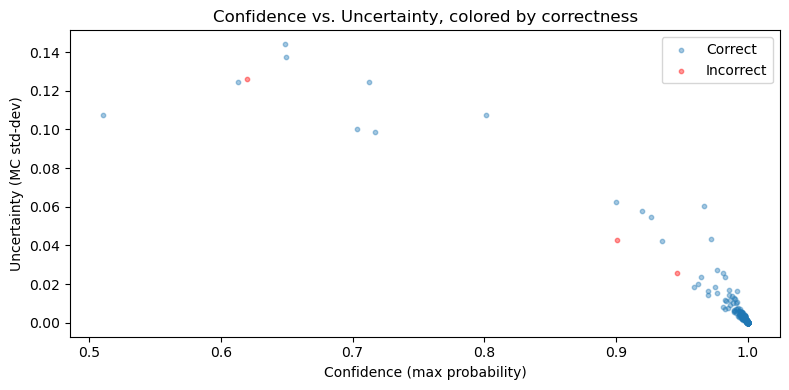

In [65]:
# ============================================================
# CELL 14: UNCERTAINTY ESTIMATION (Priority 4 per spec Section 70)
# Monte Carlo Dropout: runs multiple stochastic forward passes
# (dropout layers stay ACTIVE at inference, unlike normal prediction)
# and uses the variance across passes as an uncertainty signal.
# Applied to DenseNet121 (primary model) since it has two dropout
# layers (0.6, 0.5) well-suited to this technique.
#
# Adds caching: if uncertainty scores were already computed and saved
# to disk, ask whether to reuse them or rerun from scratch.
# ============================================================

N_MC_PASSES = 20   # number of stochastic forward passes per image

def mc_dropout_predict(model, test_gen, n_passes=N_MC_PASSES):
    test_gen.reset()

    all_images = []
    for _ in range(len(test_gen)):
        imgs, _ = next(test_gen)
        all_images.append(imgs)

    all_images = np.concatenate(all_images, axis=0)[:test_gen.samples]

    batch_size = 8
    all_passes = []

    for p in tqdm(range(n_passes), desc="MC Dropout passes"):
        pass_probs = []

        for start in range(0, len(all_images), batch_size):
            batch = all_images[start:start + batch_size]

            with tf.device("/GPU:0"):
                probs = model(batch, training=True).numpy()

            pass_probs.append(probs)

        pass_probs = np.concatenate(pass_probs, axis=0)
        all_passes.append(pass_probs)

    all_passes = np.stack(all_passes, axis=0)

    mean_probs = all_passes.mean(axis=0)
    std_probs = all_passes.std(axis=0)

    return mean_probs, std_probs


# ------------------------------------------------------------
# CACHING: check for previously saved uncertainty results
# ------------------------------------------------------------
uncertainty_cache_path = os.path.join(RESULTS_DIR, "predictions", "uncertainty_scores.csv")

use_saved = False

if os.path.exists(uncertainty_cache_path):
    choice = input(
        f"Saved uncertainty results found at:\n  {uncertainty_cache_path}\n"
        "Use saved results instead of rerunning MC Dropout? (y/n): "
    ).strip().lower()
    use_saved = choice == "y"
else:
    print("No local results found, rerunning the cell.")

if use_saved:
    print("Using saved uncertainty results.")
    uncertainty_df = pd.read_csv(uncertainty_cache_path)

    uncertainty_scores = uncertainty_df["uncertainty_score"].to_numpy()
    mc_confidence = uncertainty_df["mc_confidence"].to_numpy()
    uncertainty_labels = uncertainty_df["uncertainty_label"].to_numpy()
    mc_correct = uncertainty_df["correct"].to_numpy()
    mc_predictions = np.array([CLASS_NAMES.index(c) for c in uncertainty_df["mc_prediction"]])

    # Threshold is just the median of the scores -- deterministic to
    # recompute from the same saved scores, so no need to store it separately.
    uncertainty_threshold = np.median(uncertainty_scores)

    # NOTE: full per-class probability arrays (mc_mean_probs, mc_std_probs)
    # are NOT reconstructed from the CSV -- only the summary columns that
    # were saved. If a later cell needs those raw arrays specifically,
    # rerun instead of using the cache.
    mc_mean_probs, mc_std_probs = None, None
else:
    if os.path.exists(uncertainty_cache_path):
        print("Rerunning MC Dropout uncertainty estimation (ignoring saved results)...")

    mc_mean_probs, mc_std_probs = mc_dropout_predict(dense_model, test_generator)

    uncertainty_scores = mc_std_probs.mean(axis=1)
    uncertainty_threshold = np.median(uncertainty_scores)
    uncertainty_labels = np.where(uncertainty_scores >= uncertainty_threshold, "High", "Low")

    mc_predictions = np.argmax(mc_mean_probs, axis=1)
    mc_confidence = np.max(mc_mean_probs, axis=1)
    mc_correct = (mc_predictions == y_true_all)

    uncertainty_df = pd.DataFrame({
        "true_label": [CLASS_NAMES[i] for i in y_true_all],
        "mc_prediction": [CLASS_NAMES[i] for i in mc_predictions],
        "mc_confidence": mc_confidence,
        "uncertainty_score": uncertainty_scores,
        "uncertainty_label": uncertainty_labels,
        "correct": mc_correct,
    })

    os.makedirs(os.path.dirname(uncertainty_cache_path), exist_ok=True)
    uncertainty_df.to_csv(uncertainty_cache_path, index=False)
    print(f"Results saved to: {uncertainty_cache_path}")

# ------------------------------------------------------------
# Everything below runs regardless of cache path -- cheap to
# recompute/replot from whatever's now in memory.
# ------------------------------------------------------------
print(f"Uncertainty score range: {uncertainty_scores.min():.4f} - {uncertainty_scores.max():.4f}")
print(f"Median (threshold): {uncertainty_threshold:.4f}")
print(f"Low uncertainty: {(uncertainty_labels == 'Low').sum()} images")
print(f"High uncertainty: {(uncertainty_labels == 'High').sum()} images")

# Sanity check: does high uncertainty correlate with being WRONG?
# (Evidence for RQ4: "Can uncertainty estimation identify predictions
# where the model should not be trusted?")
low_unc_acc = mc_correct[uncertainty_labels == "Low"].mean()
high_unc_acc = mc_correct[uncertainty_labels == "High"].mean()
print(f"\nAccuracy when uncertainty = Low:  {low_unc_acc*100:.1f}%")
print(f"Accuracy when uncertainty = High: {high_unc_acc*100:.1f}%")
print("(If Low uncertainty has meaningfully higher accuracy, that supports RQ4)")

# Histogram of uncertainty scores
plt.figure(figsize=(8, 4))
plt.hist(uncertainty_scores, bins=30, edgecolor="black")
plt.axvline(uncertainty_threshold, color="red", linestyle="--", label=f"Median threshold ({uncertainty_threshold:.4f})")
plt.title("Uncertainty Score Distribution (DenseNet121, MC Dropout)")
plt.xlabel("Uncertainty (mean std-dev across MC passes)")
plt.ylabel("Number of images")
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(PLOTS_DIR, "robustness", "uncertainty_histogram.png"), dpi=150)
plt.show()

# Confidence vs. correctness -- another standard uncertainty diagnostic
plt.figure(figsize=(8, 4))
plt.scatter(mc_confidence[mc_correct], uncertainty_scores[mc_correct], alpha=0.4, label="Correct", s=10)
plt.scatter(mc_confidence[~mc_correct], uncertainty_scores[~mc_correct], alpha=0.4, label="Incorrect", s=10, color="red")
plt.xlabel("Confidence (max probability)")
plt.ylabel("Uncertainty (MC std-dev)")
plt.title("Confidence vs. Uncertainty, colored by correctness")
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(PLOTS_DIR, "robustness", "confidence_vs_uncertainty.png"), dpi=150)
plt.show()

Reliability Engine + Abstention

No local results found, rerunning the cell.
Computing reliability thresholds from VALIDATION data...


MC Dropout passes (validation): 100%|██████████| 10/10 [26:48<00:00, 160.81s/it]



Testing: DenseNet121
  DenseNet121: predictions collected

Testing: ResNet50
  ResNet50: predictions collected

Testing: Fusion: DenseNet+VGG
  Fusion: DenseNet+VGG: predictions collected

Testing: Fusion: DenseNet+ResNet
  Fusion: DenseNet+ResNet: predictions collected
Confidence threshold (from validation): 1.0000
Consensus threshold: 0.75
Uncertainty threshold (from validation): 0.0000
Results saved to: /home/hassan_raza/Downloads/ECG/results/predictions/reliability_decisions.csv
Results saved to: /home/hassan_raza/Downloads/ECG/results/metrics/reliability_thresholds.json

RELIABILITY ENGINE RESULTS
Total test images: 928
ACCEPTED: 522 (56.2%)
NEEDS REVIEW: 406 (43.8%)

Accuracy on ACCEPTED predictions: 100.00%
Accuracy on NEEDS REVIEW predictions: 99.26%
Overall accuracy (no abstention): 99.68%

(If accuracy on ACCEPTED is meaningfully higher than overall,
 that supports RQ5 -- abstention successfully filters out unreliable predictions)


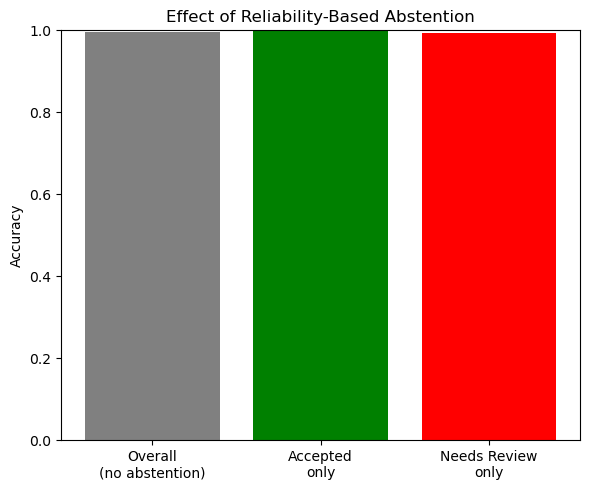

In [74]:
# ============================================================
# CELL 15: RELIABILITY ENGINE + ABSTENTION (Priority 5 per spec Section 70)
# Combines confidence, consensus, and uncertainty into a single
# ACCEPT / NEEDS REVIEW decision per image, per spec Sections 8, 44-45.
#
# Per spec Section 8: thresholds are chosen using VALIDATION data,
# not tuned on the test set (which would be a form of cheating /
# overfitting your reliability thresholds to the eval set).
#
# Adds caching: if reliability decisions AND thresholds were already
# computed and saved to disk, ask whether to reuse them or rerun.
# ============================================================

def mc_dropout_predict_on_generator(model, gen, n_passes=10, batch_size=16):
    gen.reset()

    all_images = []
    for _ in range(len(gen)):
        imgs, _ = next(gen)
        all_images.append(imgs)

    all_images = np.concatenate(all_images, axis=0)[:gen.samples]

    all_passes = []

    for p in tqdm(range(n_passes), desc="MC Dropout passes (validation)"):
        pass_probs = []

        for start in range(0, len(all_images), batch_size):
            batch = all_images[start:start + batch_size]

            with tf.device("/CPU:0"):
                probs = model(batch, training=True).numpy()

            pass_probs.append(probs)

        pass_probs = np.concatenate(pass_probs, axis=0)
        all_passes.append(pass_probs)

    all_passes = np.stack(all_passes, axis=0)

    return all_passes.mean(axis=0), all_passes.std(axis=0)


def reliability_decision(confidence, consensus, uncertainty):
    """ACCEPT if confidence is high, consensus is high, and uncertainty
    is low. NEEDS REVIEW otherwise. Per spec Section 8's example logic."""
    if confidence >= CONFIDENCE_THRESHOLD and consensus >= CONSENSUS_THRESHOLD and uncertainty < UNCERTAINTY_THRESHOLD:
        return "ACCEPT"
    return "NEEDS REVIEW"


# ------------------------------------------------------------
# CACHING: thresholds + per-image decisions are both needed by
# later cells (PDF report, ablation study), so both get cached.
# ------------------------------------------------------------
reliability_cache_path = os.path.join(RESULTS_DIR, "predictions", "reliability_decisions.csv")
thresholds_cache_path = os.path.join(RESULTS_DIR, "metrics", "reliability_thresholds.json")

both_cached = os.path.exists(reliability_cache_path) and os.path.exists(thresholds_cache_path)

use_saved = False

if both_cached:
    choice = input(
        f"Saved reliability results found at:\n  {reliability_cache_path}\n  {thresholds_cache_path}\n"
        "Use saved results instead of rerunning? (y/n): "
    ).strip().lower()
    use_saved = choice == "y"
else:
    print("No local results found, rerunning the cell.")

if use_saved:
    print("Using saved reliability results.")

    with open(thresholds_cache_path, "r") as f:
        thresholds = json.load(f)
    CONFIDENCE_THRESHOLD = thresholds["CONFIDENCE_THRESHOLD"]
    CONSENSUS_THRESHOLD = thresholds["CONSENSUS_THRESHOLD"]
    UNCERTAINTY_THRESHOLD = thresholds["UNCERTAINTY_THRESHOLD"]

    reliability_df = pd.read_csv(reliability_cache_path)
    mc_confidence = reliability_df["confidence"].to_numpy()
    consensus_scores = reliability_df["consensus"].to_numpy()
    uncertainty_scores = reliability_df["uncertainty"].to_numpy()
    reliability_decisions = reliability_df["decision"].tolist()
    mc_correct = reliability_df["correct"].to_numpy()
    mc_predictions = np.array([CLASS_NAMES.index(c) for c in reliability_df["prediction"]])

    print(f"Confidence threshold (from validation): {CONFIDENCE_THRESHOLD:.4f}")
    print(f"Consensus threshold: {CONSENSUS_THRESHOLD}")
    print(f"Uncertainty threshold (from validation): {UNCERTAINTY_THRESHOLD:.4f}")

else:
    if both_cached:
        print("Rerunning reliability engine (ignoring saved results)...")

    # ---------------- Step 1: choose thresholds using VALIDATION data ----------------
    print("Computing reliability thresholds from VALIDATION data...")
    val_mean_probs, val_std_probs = mc_dropout_predict_on_generator(dense_model, val_generator, n_passes=10)
    val_confidence = np.max(val_mean_probs, axis=1)
    val_uncertainty = val_std_probs.mean(axis=1)
    val_true = val_generator.classes[: len(val_confidence)]
    val_pred = np.argmax(val_mean_probs, axis=1)
    val_correct = (val_pred == val_true)

    val_ensemble_models = {
        "DenseNet121": dense_model, "ResNet50": resnet_model,
        "Fusion: DenseNet+VGG": fusion_dv_model, "Fusion: DenseNet+ResNet": fusion_dr_model,
    }
    _, val_per_model_probs, _ = get_ensemble_predictions(val_ensemble_models, val_generator)
    val_consensus_scores, _, _ = compute_consensus_scores(val_per_model_probs)

    CONFIDENCE_THRESHOLD = np.percentile(val_confidence, 40)
    CONSENSUS_THRESHOLD = 0.75
    UNCERTAINTY_THRESHOLD = np.percentile(val_uncertainty, 60)

    print(f"Confidence threshold (from validation): {CONFIDENCE_THRESHOLD:.4f}")
    print(f"Consensus threshold: {CONSENSUS_THRESHOLD}")
    print(f"Uncertainty threshold (from validation): {UNCERTAINTY_THRESHOLD:.4f}")

    os.makedirs(os.path.dirname(thresholds_cache_path), exist_ok=True)
    with open(thresholds_cache_path, "w") as f:
        json.dump({
            "CONFIDENCE_THRESHOLD": float(CONFIDENCE_THRESHOLD),
            "CONSENSUS_THRESHOLD": float(CONSENSUS_THRESHOLD),
            "UNCERTAINTY_THRESHOLD": float(UNCERTAINTY_THRESHOLD),
        }, f)

    # ---------------- Step 2: apply these thresholds to TEST data ----------------
    reliability_decisions = [
        reliability_decision(mc_confidence[i], consensus_scores[i], uncertainty_scores[i])
        for i in range(len(mc_confidence))
    ]

    reliability_df = pd.DataFrame({
        "true_label": [CLASS_NAMES[i] for i in y_true_all],
        "prediction": [CLASS_NAMES[i] for i in mc_predictions],
        "confidence": mc_confidence,
        "consensus": consensus_scores,
        "uncertainty": uncertainty_scores,
        "decision": reliability_decisions,
        "correct": mc_correct,
    })

    os.makedirs(os.path.dirname(reliability_cache_path), exist_ok=True)
    reliability_df.to_csv(reliability_cache_path, index=False)
    print(f"Results saved to: {reliability_cache_path}")
    print(f"Results saved to: {thresholds_cache_path}")

# ------------------------------------------------------------
# Step 3: evaluate the abstention mechanism (RQ5) -- runs
# regardless of cache path, cheap to recompute from whatever's
# now in memory.
# ------------------------------------------------------------
n_accept = (reliability_df["decision"] == "ACCEPT").sum()
n_review = (reliability_df["decision"] == "NEEDS REVIEW").sum()
acc_on_accepted = reliability_df[reliability_df["decision"] == "ACCEPT"]["correct"].mean()
acc_on_reviewed = reliability_df[reliability_df["decision"] == "NEEDS REVIEW"]["correct"].mean()
acc_overall = reliability_df["correct"].mean()

print(f"\n{'='*50}")
print("RELIABILITY ENGINE RESULTS")
print(f"{'='*50}")
print(f"Total test images: {len(reliability_df)}")
print(f"ACCEPTED: {n_accept} ({n_accept/len(reliability_df)*100:.1f}%)")
print(f"NEEDS REVIEW: {n_review} ({n_review/len(reliability_df)*100:.1f}%)")
print(f"\nAccuracy on ACCEPTED predictions: {acc_on_accepted*100:.2f}%")
print(f"Accuracy on NEEDS REVIEW predictions: {acc_on_reviewed*100:.2f}%")
print(f"Overall accuracy (no abstention): {acc_overall*100:.2f}%")
print(f"\n(If accuracy on ACCEPTED is meaningfully higher than overall,")
print(f" that supports RQ5 -- abstention successfully filters out unreliable predictions)")

fig, ax = plt.subplots(figsize=(6, 5))
ax.bar(["Overall\n(no abstention)", "Accepted\nonly", "Needs Review\nonly"],
       [acc_overall, acc_on_accepted, acc_on_reviewed],
       color=["gray", "green", "red"])
ax.set_ylabel("Accuracy")
ax.set_title("Effect of Reliability-Based Abstention")
ax.set_ylim(0, 1)
plt.tight_layout()
plt.savefig(os.path.join(PLOTS_DIR, "robustness", "abstention_effect.png"), dpi=150)
plt.show()

Multi-Model Grad-CAM

Saved Grad-CAM results found:
  /home/hassan_raza/Downloads/ECG/results/predictions/gradcam_overlap.csv
  /home/hassan_raza/Downloads/ECG/plots/gradcam/multi_model_sample_0.png
  /home/hassan_raza/Downloads/ECG/plots/gradcam/multi_model_sample_1.png
  /home/hassan_raza/Downloads/ECG/plots/gradcam/multi_model_sample_2.png
Use saved results instead of rerunning? (y/n): y
Using saved Grad-CAM results.

--- Sample image 0 ---


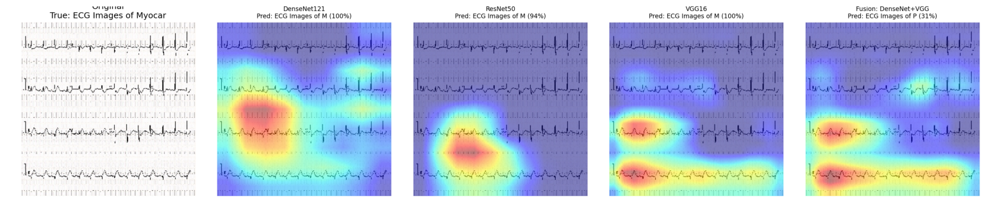

--- Sample image 1 ---


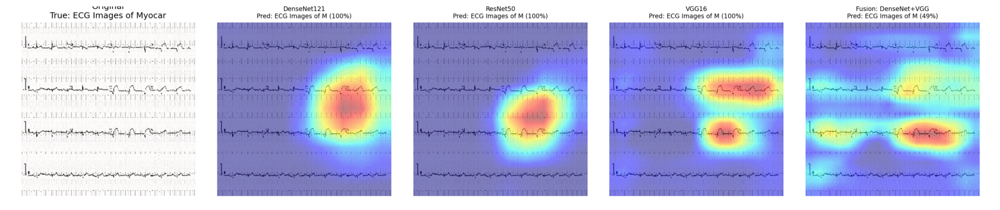

--- Sample image 2 ---


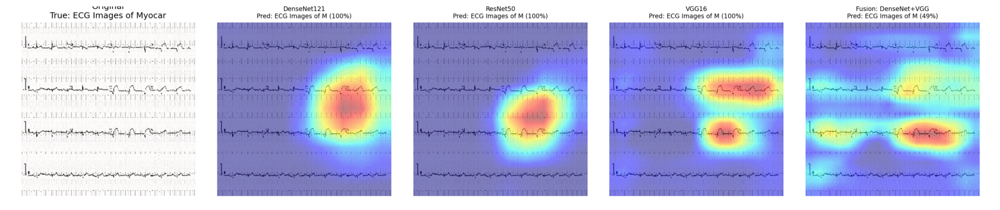


Pairwise Grad-CAM region overlap (IoU) across sampled images:
    model_a              model_b  iou_overlap
DenseNet121 Fusion: DenseNet+VGG     0.055556
DenseNet121             ResNet50     0.222222
DenseNet121                VGG16     0.000000
   ResNet50 Fusion: DenseNet+VGG     0.216954
   ResNet50                VGG16     0.000000
      VGG16 Fusion: DenseNet+VGG     0.000000

Full per-image overlap records:
 image_idx     model_a              model_b  iou_overlap
         0 DenseNet121             ResNet50     0.000000
         0 DenseNet121                VGG16     0.000000
         0 DenseNet121 Fusion: DenseNet+VGG     0.000000
         0    ResNet50                VGG16     0.000000
         0    ResNet50 Fusion: DenseNet+VGG     0.275862
         0       VGG16 Fusion: DenseNet+VGG     0.000000
         1 DenseNet121             ResNet50     0.333333
         1 DenseNet121                VGG16     0.000000
         1 DenseNet121 Fusion: DenseNet+VGG     0.083333
         1  

In [73]:
# ============================================================
# CELL 16: MULTI-MODEL GRAD-CAM
#
# Adds caching: if Grad-CAM results (the per-image comparison PNGs
# + the overlap CSV) were already generated and saved to disk, ask
# whether to reuse them or rerun. If reused, still DISPLAYS the full
# saved results (images + overlap table) as output, not just a message.
# If rerun, the old PNGs/CSV are overwritten with fresh ones.
# ============================================================

def find_last_conv_layer(model):
    for layer in reversed(model.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            return None, layer.name

        if isinstance(layer, tf.keras.Model):
            base_name, conv_name = find_last_conv_layer(layer)
            if conv_name is not None:
                return layer.name, conv_name

    return None, None


def find_backbone_submodel(container_model, conv_layer_name):
    """
    Finds the nested Model layer inside container_model's OWN top-level
    layers whose own layers include conv_layer_name, and its index in
    container_model.layers. Handles both cases in this notebook:
    - standalone models, where the backbone (e.g. 'densenet121') sits
      directly at the top level and contains the conv layer directly.
    - fusion branches (feat_a/feat_b), where the real backbone (e.g.
      'vgg16') is nested one level inside the branch's own top-level
      layers.
    """
    for idx, layer in enumerate(container_model.layers):
        if isinstance(layer, tf.keras.Model):
            if conv_layer_name in [l.name for l in layer.layers]:
                return layer, idx
    return None, None


def run_container_with_conv_capture(container_model, img_tensor, conv_layer_name):
    """
    Threads img_tensor through container_model's own top-level layers
    in order -- safe, because at THIS level the layers are always a
    strict linear chain (any internal branching/merging, e.g. DenseNet's
    Concatenate blocks or ResNet's residual Add layers, happens INSIDE
    the nested backbone layer, which is handled separately below).

    When the loop reaches the nested backbone layer that actually
    contains conv_layer_name, it builds a clean Keras Model slice
    directly on THAT sub-model's own self-consistent graph (valid
    because it's the original, never-rewired application instance),
    extracting both the target conv layer's output and the backbone's
    normal output in one call, then continues threading the real
    output through container_model's remaining layers.
    """
    backbone, backbone_idx = find_backbone_submodel(container_model, conv_layer_name)

    if backbone is None:
        raise ValueError(
            f"Could not find a nested layer containing "
            f"'{conv_layer_name}' inside '{container_model.name}'."
        )

    conv_and_out_model = tf.keras.models.Model(
        inputs=backbone.input,
        outputs=[
            backbone.get_layer(conv_layer_name).output,
            backbone.output,
        ],
    )

    x = img_tensor
    conv_output = None

    for idx, layer in enumerate(container_model.layers):

        if isinstance(layer, tf.keras.layers.InputLayer):
            continue

        if idx == backbone_idx:
            conv_output, x = conv_and_out_model(x, training=False)
        else:
            x = layer(x, training=False)

    return x, conv_output


def make_gradcam_heatmap(
    img_array,
    model,
    base_model_name,
    last_conv_layer_name
):

    with tf.device("/CPU:0"):

        img_tensor = tf.convert_to_tensor(img_array)

        # ========================================================
        # NORMAL MODEL
        # DenseNet121 / ResNet50 / VGG16
        # ========================================================
        if not model.name.startswith("fusion_"):

            with tf.GradientTape() as tape:

                predictions, conv_output = run_container_with_conv_capture(
                    model, img_tensor, last_conv_layer_name
                )

                if conv_output is None:
                    raise ValueError(
                        f"Could not find {last_conv_layer_name} "
                        f"in {model.name}"
                    )

                tape.watch(conv_output)

                pred_index = tf.argmax(predictions[0])
                class_channel = predictions[:, pred_index]

            grads = tape.gradient(class_channel, conv_output)

        # ========================================================
        # FUSION MODEL
        # ========================================================
        else:

            target_branch = model.get_layer(base_model_name)

            if base_model_name.endswith("_feat_a"):
                other_branch_name = f"{model.name}_feat_b"
            else:
                other_branch_name = f"{model.name}_feat_a"

            other_branch = model.get_layer(other_branch_name)

            with tf.GradientTape() as tape:

                target_features, conv_output = run_container_with_conv_capture(
                    target_branch, img_tensor, last_conv_layer_name
                )

                if conv_output is None:
                    raise ValueError(
                        f"Could not find {last_conv_layer_name} "
                        f"in {model.name}"
                    )

                tape.watch(conv_output)

                other_features = other_branch(img_tensor, training=False)

                x = layers.Concatenate()([target_features, other_features])

                concat_found = False

                for layer in model.layers:

                    if isinstance(layer, tf.keras.layers.Concatenate):
                        concat_found = True
                        continue

                    if not concat_found:
                        continue

                    if isinstance(layer, tf.keras.layers.InputLayer):
                        continue

                    x = layer(x, training=False)

                predictions = x
                pred_index = tf.argmax(predictions[0])
                class_channel = predictions[:, pred_index]

            grads = tape.gradient(class_channel, conv_output)

        if grads is None:
            raise ValueError(f"Gradients are None for {model.name}")

        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
        conv_output = conv_output[0]
        heatmap = conv_output @ pooled_grads[..., tf.newaxis]
        heatmap = tf.squeeze(heatmap)
        heatmap = tf.maximum(heatmap, 0)
        heatmap = heatmap / (tf.reduce_max(heatmap) + 1e-8)

        return (
            heatmap.numpy(),
            int(pred_index.numpy()),
            predictions[0].numpy()
        )


def compute_heatmap_overlap(
    heatmap_a,
    heatmap_b,
    threshold=0.5
):
    size = (
        min(heatmap_a.shape[0], heatmap_b.shape[0]),
        min(heatmap_a.shape[1], heatmap_b.shape[1])
    )

    a_resized = cv2.resize(heatmap_a, size)
    b_resized = cv2.resize(heatmap_b, size)

    a_mask = a_resized >= threshold
    b_mask = b_resized >= threshold

    intersection = np.logical_and(a_mask, b_mask).sum()
    union = np.logical_or(a_mask, b_mask).sum()

    return intersection / union if union > 0 else 0.0


# ============================================================
# MODELS TO COMPARE
# ============================================================

gradcam_models = {
    "DenseNet121": dense_model,
    "ResNet50": resnet_model,
    "VGG16": vgg_model,
    "Fusion: DenseNet+VGG": fusion_dv_model,
}

N_GRADCAM_SAMPLES = 3  # must match n_samples_to_show used when these were generated

# ------------------------------------------------------------
# CACHING: check for previously saved Grad-CAM comparison PNGs
# + the overlap CSV. Both must exist for the cache to count.
# ------------------------------------------------------------
gradcam_png_paths = [
    os.path.join(PLOTS_DIR, "gradcam", f"multi_model_sample_{i}.png")
    for i in range(N_GRADCAM_SAMPLES)
]
overlap_cache_path = os.path.join(RESULTS_DIR, "predictions", "gradcam_overlap.csv")

both_cached = os.path.exists(overlap_cache_path) and all(os.path.exists(p) for p in gradcam_png_paths)

use_saved = False

if both_cached:
    choice = input(
        f"Saved Grad-CAM results found:\n  {overlap_cache_path}\n  "
        + "\n  ".join(gradcam_png_paths)
        + "\nUse saved results instead of rerunning? (y/n): "
    ).strip().lower()
    use_saved = choice == "y"
else:
    print("No local results found, rerunning the cell.")

if use_saved:
    print("Using saved Grad-CAM results.\n")

    # --- Display the full saved comparison images, one per sampled test image ---
    for i, png_path in enumerate(gradcam_png_paths):
        print(f"--- Sample image {i} ---")
        saved_img = plt.imread(png_path)
        plt.figure(figsize=(4 * (len(gradcam_models) + 1), 4))
        plt.imshow(saved_img)
        plt.axis("off")
        plt.show()

    # --- Display the full saved overlap table ---
    overlap_df = pd.read_csv(overlap_cache_path)
    print("\nPairwise Grad-CAM region overlap (IoU) across sampled images:")
    print(
        overlap_df.groupby(["model_a", "model_b"])["iou_overlap"]
        .mean()
        .reset_index()
        .to_string(index=False)
    )
    print("\nFull per-image overlap records:")
    print(overlap_df.to_string(index=False))

else:
    if both_cached:
        print("Rerunning Grad-CAM generation (old results will be overwritten)...")

    # ---------------- FIND LAST CONV LAYERS ----------------
    gradcam_layer_info = {}

    for m_name, model in gradcam_models.items():
        if model is not None:
            base_name, conv_name = find_last_conv_layer(model)
            gradcam_layer_info[m_name] = (base_name, conv_name)
            print(f"{m_name}: base={base_name}, last conv layer={conv_name}")

    # ---------------- TEST IMAGES ----------------
    test_generator.reset()
    sample_images, sample_labels = next(test_generator)
    n_samples_to_show = min(N_GRADCAM_SAMPLES, sample_images.shape[0])

    overlap_records = []

    # ---------------- GENERATE GRAD-CAM ----------------
    for img_idx in range(n_samples_to_show):

        img_array = np.expand_dims(sample_images[img_idx], axis=0)
        true_class = CLASS_NAMES[np.argmax(sample_labels[img_idx])]

        heatmaps = {}

        fig, axes = plt.subplots(
            1, len(gradcam_models) + 1,
            figsize=(4 * (len(gradcam_models) + 1), 4)
        )

        axes[0].imshow(np.clip(img_array[0], 0, 1))
        axes[0].set_title(f"Original\nTrue: {true_class[:20]}")
        axes[0].axis("off")

        for i, (m_name, model) in enumerate(gradcam_models.items()):

            if model is None:
                axes[i + 1].axis("off")
                continue

            base_name, conv_name = gradcam_layer_info[m_name]

            heatmap, pred_idx, probs = make_gradcam_heatmap(
                img_array, model, base_name, conv_name
            )

            heatmaps[m_name] = heatmap

            heatmap_resized = cv2.resize(heatmap, (img_array.shape[2], img_array.shape[1]))

            axes[i + 1].imshow(np.clip(img_array[0], 0, 1))
            axes[i + 1].imshow(heatmap_resized, cmap="jet", alpha=0.5)
            axes[i + 1].set_title(
                f"{m_name}\nPred: {CLASS_NAMES[pred_idx][:15]} ({probs[pred_idx] * 100:.0f}%)",
                fontsize=9
            )
            axes[i + 1].axis("off")

        plt.tight_layout()
        plt.savefig(
            os.path.join(PLOTS_DIR, "gradcam", f"multi_model_sample_{img_idx}.png"),
            dpi=150
        )
        plt.show()

        # ---------------- PAIRWISE OVERLAP ----------------
        model_names_list = list(heatmaps.keys())

        for a in range(len(model_names_list)):
            for b in range(a + 1, len(model_names_list)):
                overlap = compute_heatmap_overlap(
                    heatmaps[model_names_list[a]],
                    heatmaps[model_names_list[b]]
                )
                overlap_records.append({
                    "image_idx": img_idx,
                    "model_a": model_names_list[a],
                    "model_b": model_names_list[b],
                    "iou_overlap": overlap
                })

    # ---------------- SAVE RESULTS ----------------
    overlap_df = pd.DataFrame(overlap_records)

    print("\nPairwise Grad-CAM region overlap (IoU) across sampled images:")
    print(
        overlap_df.groupby(["model_a", "model_b"])["iou_overlap"]
        .mean()
        .reset_index()
        .to_string(index=False)
    )

    os.makedirs(os.path.dirname(overlap_cache_path), exist_ok=True)
    overlap_df.to_csv(overlap_cache_path, index=False)
    print(f"\nResults saved to: {overlap_cache_path}")
    print(f"Results saved to: {os.path.join(PLOTS_DIR, 'gradcam')} (multi_model_sample_0/1/2.png)")
    
    

In [77]:
gradcam_layer_info = {}

for m_name, model in gradcam_models.items():
    if model is not None:
        base_name, conv_name = find_last_conv_layer(model)
        gradcam_layer_info[m_name] = (base_name, conv_name)
        print(f"{m_name}: base={base_name}, last conv layer={conv_name}")

DenseNet121: base=densenet121, last conv layer=conv5_block16_2_conv
ResNet50: base=resnet50, last conv layer=conv5_block3_3_conv
VGG16: base=vgg16, last conv layer=block5_conv3
Fusion: DenseNet+VGG: base=fusion_densenet_vgg_feat_b, last conv layer=block5_conv3


Occlusion Sensitivity Analysis

No local results found, rerunning the cell.
Running occlusion sensitivity on image 0...


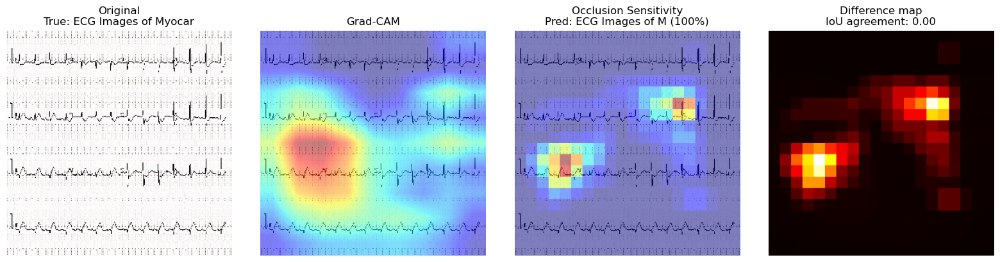

  Grad-CAM vs Occlusion agreement (IoU): 0.000

Running occlusion sensitivity on image 1...


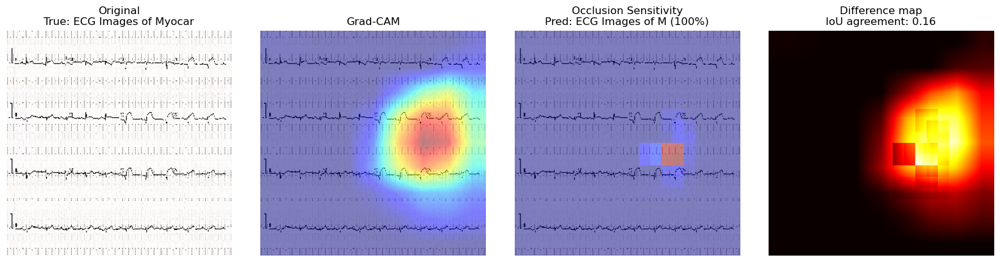

  Grad-CAM vs Occlusion agreement (IoU): 0.160

Running occlusion sensitivity on image 2...


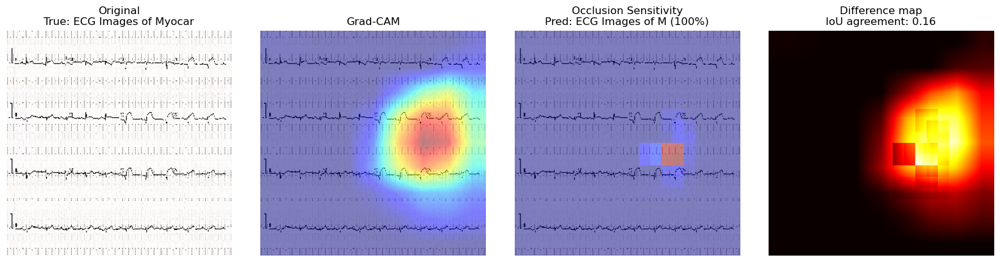

  Grad-CAM vs Occlusion agreement (IoU): 0.160

Results saved to: /home/hassan_raza/Downloads/ECG/results/predictions/occlusion_vs_gradcam.csv


In [78]:
# ============================================================
# CELL 17: OCCLUSION SENSITIVITY ANALYSIS (Priority 6, spec Sections 42-43)
# Systematically covers small patches of an image, re-predicts each
# time, and measures how much the prediction confidence drops.
# Compared against Grad-CAM to check: are the regions Grad-CAM
# highlights ACTUALLY influential, or just visually plausible?
#
# Caching: if results were already generated and saved to disk, ask
# whether to reuse them or rerun. If reused, DISPLAYS the full saved
# results -- table AND the saved comparison images -- as output, not
# just a message. If rerun, old results (CSV + PNGs) are overwritten.
# ============================================================

def occlusion_sensitivity_map(model, img_array, patch_size=30, stride=15):
    """Slides a gray patch across the image, measuring how much the
    model's confidence in its ORIGINAL predicted class drops when
    that region is covered. Returns a heatmap same size as the image,
    where higher values = that region matters more to the prediction.
    """
    h, w = img_array.shape[1], img_array.shape[2]

    # Force these ops onto CPU -- this model's variables were loaded
    # with tf.device("/CPU:0") earlier, so predict() must run on the
    # same device or TF raises an INVALID_ARGUMENT device-mismatch
    # error trying to reach a CPU-resident variable from a GPU op.
    with tf.device("/CPU:0"):

        original_probs = model.predict(img_array, verbose=0)[0]
        original_class = np.argmax(original_probs)
        original_confidence = original_probs[original_class]

        heatmap = np.zeros((h, w))
        counts = np.zeros((h, w))

        positions = [(y, x) for y in range(0, h - patch_size, stride) for x in range(0, w - patch_size, stride)]

        occluded_batch = []
        for (y, x) in positions:
            occluded = img_array[0].copy()
            occluded[y:y+patch_size, x:x+patch_size, :] = 0.5   # gray patch
            occluded_batch.append(occluded)

        occluded_batch = np.array(occluded_batch)
        occluded_probs = model.predict(occluded_batch, batch_size=32, verbose=0)

    for idx, (y, x) in enumerate(positions):
        confidence_drop = original_confidence - occluded_probs[idx][original_class]
        heatmap[y:y+patch_size, x:x+patch_size] += confidence_drop
        counts[y:y+patch_size, x:x+patch_size] += 1

    counts[counts == 0] = 1   # avoid divide-by-zero in untouched corners
    heatmap = heatmap / counts
    heatmap = np.clip(heatmap, 0, None)   # negative = occlusion INCREASED confidence, clip for visualization
    if heatmap.max() > 0:
        heatmap = heatmap / heatmap.max()   # normalize to [0, 1]

    return heatmap, original_class, original_confidence


# ------------------------------------------------------------
# CACHING: check for previously saved occlusion-vs-Grad-CAM results
# ------------------------------------------------------------
occlusion_cache_path = os.path.join(RESULTS_DIR, "predictions", "occlusion_vs_gradcam.csv")

use_saved = False

if os.path.exists(occlusion_cache_path):
    choice = input(
        f"Saved occlusion sensitivity results found at:\n  {occlusion_cache_path}\n"
        "Use saved results instead of rerunning? (y/n): "
    ).strip().lower()
    use_saved = choice == "y"
else:
    print("No local results found, rerunning the cell.")

if use_saved:
    print("Using saved occlusion sensitivity results.\n")
    occlusion_results_df = pd.read_csv(occlusion_cache_path)

    # --- Display the full saved comparison image per row in the cache ---
    for _, row in occlusion_results_df.iterrows():
        img_idx = int(row["image_idx"])
        saved_png_path = os.path.join(PLOTS_DIR, "gradcam", f"gradcam_vs_occlusion_{img_idx}.png")

        print(f"--- Sample image {img_idx} ---")
        print(f"True: {row['true_class']} | Predicted: {row['predicted_class']} "
              f"({row['confidence']*100:.0f}%) | Grad-CAM vs Occlusion IoU: {row['gradcam_occlusion_iou']:.3f}")

        if os.path.exists(saved_png_path):
            saved_img = plt.imread(saved_png_path)
            plt.figure(figsize=(16, 4))
            plt.imshow(saved_img)
            plt.axis("off")
            plt.show()
        else:
            print(f"  (Saved plot not found at {saved_png_path} -- CSV exists but image is missing.)")
        print()

    # --- Display the full saved results table too ---
    print("Full saved results table:")
    print(occlusion_results_df.to_string(index=False))

else:
    if os.path.exists(occlusion_cache_path):
        print("Rerunning occlusion sensitivity analysis (old results will be overwritten)...")

    # Run on the same sample images used in Cell 16's Grad-CAM comparison,
    # using DenseNet121 (primary model) for this analysis
    test_generator.reset()
    sample_images, sample_labels = next(test_generator)
    n_samples = min(3, sample_images.shape[0])

    occlusion_records = []

    for img_idx in range(n_samples):
        img_array = np.expand_dims(sample_images[img_idx], axis=0)
        true_class = CLASS_NAMES[np.argmax(sample_labels[img_idx])]

        print(f"Running occlusion sensitivity on image {img_idx}...")
        occ_heatmap, pred_class, pred_conf = occlusion_sensitivity_map(dense_model, img_array)

        # Also compute Grad-CAM on the same image for direct comparison
        base_name, conv_name = gradcam_layer_info["DenseNet121"]
        gradcam_heatmap, _, _ = make_gradcam_heatmap(img_array, dense_model, base_name, conv_name)
        gradcam_resized = cv2.resize(gradcam_heatmap, (occ_heatmap.shape[1], occ_heatmap.shape[0]))

        agreement = compute_heatmap_overlap(occ_heatmap, gradcam_resized, threshold=0.5)

        occlusion_records.append({
            "image_idx": img_idx,
            "true_class": true_class,
            "predicted_class": CLASS_NAMES[pred_class],
            "confidence": pred_conf,
            "gradcam_occlusion_iou": agreement,
        })

        fig, axes = plt.subplots(1, 4, figsize=(16, 4))
        axes[0].imshow(np.clip(img_array[0], 0, 1))
        axes[0].set_title(f"Original\nTrue: {true_class[:20]}")
        axes[0].axis("off")

        axes[1].imshow(np.clip(img_array[0], 0, 1))
        axes[1].imshow(gradcam_resized, cmap="jet", alpha=0.5)
        axes[1].set_title("Grad-CAM")
        axes[1].axis("off")

        axes[2].imshow(np.clip(img_array[0], 0, 1))
        axes[2].imshow(occ_heatmap, cmap="jet", alpha=0.5)
        axes[2].set_title(f"Occlusion Sensitivity\nPred: {CLASS_NAMES[pred_class][:15]} ({pred_conf*100:.0f}%)")
        axes[2].axis("off")

        diff = np.abs(occ_heatmap - gradcam_resized)
        axes[3].imshow(diff, cmap="hot")
        axes[3].set_title(f"Difference map\nIoU agreement: {agreement:.2f}")
        axes[3].axis("off")

        plt.tight_layout()
        plt.savefig(os.path.join(PLOTS_DIR, "gradcam", f"gradcam_vs_occlusion_{img_idx}.png"), dpi=150)
        plt.show()

        print(f"  Grad-CAM vs Occlusion agreement (IoU): {agreement:.3f}\n")

    occlusion_results_df = pd.DataFrame(occlusion_records)
    os.makedirs(os.path.dirname(occlusion_cache_path), exist_ok=True)
    occlusion_results_df.to_csv(occlusion_cache_path, index=False)
    print(f"Results saved to: {occlusion_cache_path}")

Robustness Testing (Controlled Image Degradation)

In [79]:
# ============================================================
# CELL 18: ROBUSTNESS TESTING (Priority 7 per spec Section 70)
# Creates controlled corrupted versions of the ENTIRE test set,
# measures how accuracy/F1/confidence degrade under each condition.
# Per spec Section 41.
#
# Caching: if robustness results were already computed and saved to
# disk, ask whether to reuse them or rerun. If reused, displays the
# full saved results table. If rerun, old results are overwritten.
#
# NOTE: also includes an "Original" (clean, uncorrupted) baseline row,
# since the ablation study cell later filters on
# robustness_df["Condition"] != "Original" -- that row must exist.
# ============================================================

def apply_brightness(img, factor=1.4):
    return np.clip(img * factor, 0, 1)

def apply_darkness(img, factor=0.6):
    return np.clip(img * factor, 0, 1)

def apply_contrast(img, factor=1.6):
    mean = img.mean()
    return np.clip((img - mean) * factor + mean, 0, 1)

def apply_gaussian_noise(img, std=0.05):
    noise = np.random.normal(0, std, img.shape)
    return np.clip(img + noise, 0, 1)

def apply_blur(img, ksize=7):
    return cv2.GaussianBlur(img, (ksize, ksize), 0)

def apply_rotation(img, angle=15):
    h, w = img.shape[:2]
    M = cv2.getRotationMatrix2D((w / 2, h / 2), angle, 1.0)
    return cv2.warpAffine(img, M, (w, h), borderMode=cv2.BORDER_REPLICATE)

def apply_compression(img, quality=20):
    """Simulates JPEG compression artifacts."""
    img_uint8 = (img * 255).astype(np.uint8)
    _, encoded = cv2.imencode(".jpg", img_uint8, [cv2.IMWRITE_JPEG_QUALITY, quality])
    decoded = cv2.imdecode(encoded, cv2.IMREAD_COLOR)
    return decoded.astype("float32") / 255.0

def apply_occlusion(img, patch_frac=0.2):
    h, w = img.shape[:2]
    ph, pw = int(h * patch_frac), int(w * patch_frac)
    y = random.randint(0, h - ph)
    x = random.randint(0, w - pw)
    occluded = img.copy()
    occluded[y:y+ph, x:x+pw, :] = 0.5
    return occluded


ROBUSTNESS_CONDITIONS = {
    "Original": lambda img: img,
    "Brightness": apply_brightness,
    "Darkness": apply_darkness,
    "Contrast": apply_contrast,
    "Gaussian Noise": apply_gaussian_noise,
    "Blur": apply_blur,
    "Rotation": apply_rotation,
    "Compression": apply_compression,
    "Occlusion": apply_occlusion,
}


def evaluate_under_condition(model, condition_fn, test_gen):
    """Applies a corruption function to the ENTIRE test set, then
    evaluates the model on the corrupted version."""
    test_gen.reset()
    all_images, all_labels = [], []
    for _ in range(len(test_gen)):
        imgs, labels = next(test_gen)
        all_images.append(imgs)
        all_labels.append(labels)
    all_images = np.concatenate(all_images, axis=0)[: test_gen.samples]
    all_labels = np.concatenate(all_labels, axis=0)[: test_gen.samples]
    y_true = np.argmax(all_labels, axis=1)

    corrupted_images = np.array([condition_fn(img) for img in all_images])

    # Force this op onto CPU -- this model's variables were loaded with
    # tf.device("/CPU:0") earlier, so predict() must run on the same
    # device or TF raises an INVALID_ARGUMENT device-mismatch error
    # trying to reach a CPU-resident variable from a GPU op.
    with tf.device("/CPU:0"):
        probs = model.predict(corrupted_images, batch_size=32, verbose=0)

    y_pred = np.argmax(probs, axis=1)
    confidence = np.max(probs, axis=1)

    acc = accuracy_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred, average="macro", zero_division=0)
    mean_conf = confidence.mean()

    return acc, f1, mean_conf


# ------------------------------------------------------------
# CACHING: check for previously saved robustness results
# ------------------------------------------------------------
robustness_cache_path = os.path.join(RESULTS_DIR, "robustness", "robustness_results.csv")

use_saved = False

if os.path.exists(robustness_cache_path):
    choice = input(
        f"Saved robustness results found at:\n  {robustness_cache_path}\n"
        "Use saved results instead of rerunning (this retests the ENTIRE test set "
        "under 8 corruption conditions, so it takes a while)? (y/n): "
    ).strip().lower()
    use_saved = choice == "y"
else:
    print("No local results found, rerunning the cell.")

if use_saved:
    print("Using saved robustness results.\n")
    robustness_df = pd.read_csv(robustness_cache_path)
    print("=" * 60)
    print("ROBUSTNESS SUMMARY (from saved results)")
    print("=" * 60)
    print(robustness_df.to_string(index=False))

else:
    if os.path.exists(robustness_cache_path):
        print("Rerunning robustness testing (old results will be overwritten)...")

    print("Running robustness testing on DenseNet121 (primary model)...\n")
    robustness_results = []

    for condition_name, condition_fn in ROBUSTNESS_CONDITIONS.items():
        print(f"Testing condition: {condition_name}...")
        acc, f1, mean_conf = evaluate_under_condition(dense_model, condition_fn, test_generator)
        robustness_results.append({
            "Condition": condition_name, "Accuracy": acc, "Macro F1": f1, "Mean Confidence": mean_conf
        })
        print(f"  Accuracy: {acc*100:.2f}% | Macro F1: {f1*100:.2f}% | Mean Confidence: {mean_conf*100:.2f}%\n")

    robustness_df = pd.DataFrame(robustness_results)

    os.makedirs(os.path.dirname(robustness_cache_path), exist_ok=True)
    robustness_df.to_csv(robustness_cache_path, index=False)
    print(f"Results saved to: {robustness_cache_path}")

    print("\n" + "=" * 60)
    print("ROBUSTNESS SUMMARY")
    print("=" * 60)
    print(robustness_df.to_string(index=False))

Saved robustness results found at:
  /home/hassan_raza/Downloads/ECG/results/robustness/robustness_results.csv
Use saved results instead of rerunning (this retests the ENTIRE test set under 8 corruption conditions, so it takes a while)? (y/n): y
Using saved robustness results.

ROBUSTNESS SUMMARY (from saved results)
     Condition  Accuracy  Macro F1  Mean Confidence
      Original  0.996767  0.997067         0.996642
      Original  0.996767  0.997067         0.996642
    Brightness  0.994612  0.994738         0.997644
      Darkness  0.985991  0.986300         0.991203
      Contrast  0.997845  0.997672         0.994654
Gaussian Noise  0.994612  0.994816         0.996802
          Blur  0.618534  0.594682         0.863518
      Rotation  0.931034  0.931689         0.965969
   Compression  0.973060  0.975559         0.988329
     Occlusion  0.988147  0.987931         0.992546


Shortcut Learning / ECG-vs-Background Analysis

Saved shortcut-learning results found at:
  /home/hassan_raza/Downloads/ECG/results/predictions/shortcut_learning_analysis.csv
  /home/hassan_raza/Downloads/ECG/plots/robustness/shortcut_learning_examples.png
  /home/hassan_raza/Downloads/ECG/plots/robustness/shortcut_learning_comparison.png
Use saved results instead of rerunning (this retests the ENTIRE test set under 3 image versions, so it takes a while)? (y/n): y
Using saved shortcut-learning results.

Per-version results:
Original: Accuracy=99.68%, Macro F1=99.71%
ECG-only (waveform isolated): Accuracy=99.57%, Macro F1=99.57%
Background-only (waveform removed): Accuracy=25.75%, Macro F1=10.24%

--- Saved example images (Original / ECG-only / Background-only) ---


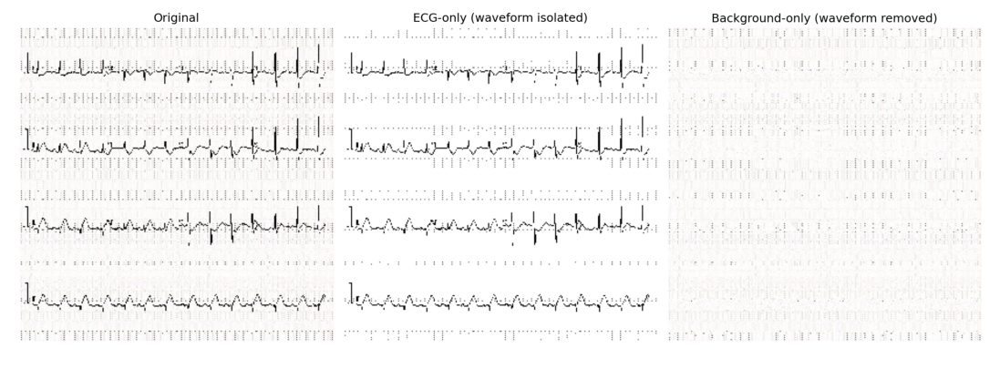

--- Saved accuracy comparison ---


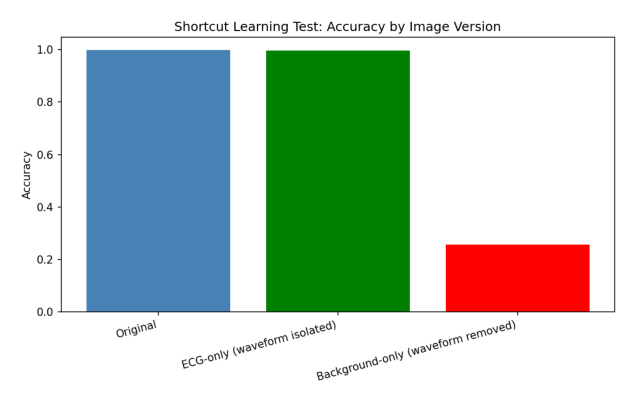


Background-only accuracy (25.8%) is close to random chance,
while ECG-only accuracy (99.6%) remains strong.
This is good evidence the model relies on genuine ECG waveform information.


In [80]:
# ============================================================
# CELL 19: SHORTCUT LEARNING ANALYSIS (Priority 8, spec Section 11)
# Tests whether the model relies on actual ECG waveform information
# or on irrelevant background/artifact regions. Per spec, this is
# "potentially one of the most interesting research experiments."
#
# Caching: if results were already computed and saved to disk, ask
# whether to reuse them or rerun. If reused, displays the full saved
# results -- table, both saved plots, and the warning/conclusion text.
# If rerun, old results (CSV + PNGs) are overwritten.
# ============================================================

def create_ecg_only_version(img, mask_background=True):
    """Attempts to isolate the ECG WAVEFORM (dark trace lines) from
    the grid/background by thresholding on darkness -- the waveform
    trace is typically much darker than the pink/white grid."""
    gray = cv2.cvtColor((img * 255).astype("uint8"), cv2.COLOR_RGB2GRAY)
    _, waveform_mask = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY_INV)
    waveform_mask = waveform_mask.astype("float32") / 255.0
    waveform_mask = np.stack([waveform_mask] * 3, axis=-1)

    ecg_only = img * waveform_mask + (1 - waveform_mask) * 1.0   # white background where grid was
    return ecg_only


def create_background_only_version(img):
    """The inverse -- keeps the grid/background, removes the dark
    waveform trace (replaced with white), isolating just artifacts/grid."""
    gray = cv2.cvtColor((img * 255).astype("uint8"), cv2.COLOR_RGB2GRAY)
    _, waveform_mask = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY_INV)
    waveform_mask = waveform_mask.astype("float32") / 255.0
    waveform_mask = np.stack([waveform_mask] * 3, axis=-1)

    background_only = img * (1 - waveform_mask) + waveform_mask * 1.0   # white where waveform was
    return background_only


def evaluate_shortcut_learning(model, test_gen):
    """Evaluates the model on three versions of the ENTIRE test set:
    original, ECG-waveform-only, and background/grid-only.
    A model that relies on real ECG signal should perform MUCH better
    on 'ECG-only' than on 'background-only'. If background-only
    accuracy is surprisingly high, that's evidence of shortcut learning.
    """
    test_gen.reset()
    all_images, all_labels = [], []
    for _ in range(len(test_gen)):
        imgs, labels = next(test_gen)
        all_images.append(imgs)
        all_labels.append(labels)
    all_images = np.concatenate(all_images, axis=0)[: test_gen.samples]
    all_labels = np.concatenate(all_labels, axis=0)[: test_gen.samples]
    y_true = np.argmax(all_labels, axis=1)

    versions = {
        "Original": all_images,
        "ECG-only (waveform isolated)": np.array([create_ecg_only_version(img) for img in all_images]),
        "Background-only (waveform removed)": np.array([create_background_only_version(img) for img in all_images]),
    }

    results = []
    for version_name, images in versions.items():
        # Force this op onto CPU -- this model's variables were loaded
        # with tf.device("/CPU:0") earlier, so predict() must run on
        # the same device or TF raises an INVALID_ARGUMENT device-
        # mismatch error trying to reach a CPU-resident variable from
        # a GPU op.
        with tf.device("/CPU:0"):
            probs = model.predict(images, batch_size=32, verbose=0)

        y_pred = np.argmax(probs, axis=1)
        acc = accuracy_score(y_true, y_pred)
        f1 = f1_score(y_true, y_pred, average="macro", zero_division=0)
        results.append({"Version": version_name, "Accuracy": acc, "Macro F1": f1})
        print(f"{version_name}: Accuracy={acc*100:.2f}%, Macro F1={f1*100:.2f}%")

    return pd.DataFrame(results), versions


def print_shortcut_conclusion(shortcut_df):
    background_acc = shortcut_df[shortcut_df["Version"].str.contains("Background")]["Accuracy"].values[0]
    ecg_acc = shortcut_df[shortcut_df["Version"].str.contains("ECG-only")]["Accuracy"].values[0]
    print(f"\n{'='*50}")
    if background_acc > 0.4:   # meaningfully above random chance (0.25 for 4 classes)
        print(f"WARNING: Background-only accuracy is {background_acc*100:.1f}% -- ")
        print("meaningfully above random chance (25%). This suggests the model")
        print("may be partially relying on grid/artifact patterns, not just the waveform.")
    else:
        print(f"Background-only accuracy ({background_acc*100:.1f}%) is close to random chance,")
        print(f"while ECG-only accuracy ({ecg_acc*100:.1f}%) remains strong.")
        print("This is good evidence the model relies on genuine ECG waveform information.")


# ------------------------------------------------------------
# CACHING: check for previously saved shortcut-learning results
# ------------------------------------------------------------
shortcut_cache_path = os.path.join(RESULTS_DIR, "predictions", "shortcut_learning_analysis.csv")
shortcut_examples_png = os.path.join(PLOTS_DIR, "robustness", "shortcut_learning_examples.png")
shortcut_comparison_png = os.path.join(PLOTS_DIR, "robustness", "shortcut_learning_comparison.png")

both_pngs_exist = os.path.exists(shortcut_examples_png) and os.path.exists(shortcut_comparison_png)
fully_cached = os.path.exists(shortcut_cache_path) and both_pngs_exist

use_saved = False

if fully_cached:
    choice = input(
        f"Saved shortcut-learning results found at:\n  {shortcut_cache_path}\n  {shortcut_examples_png}\n  {shortcut_comparison_png}\n"
        "Use saved results instead of rerunning (this retests the ENTIRE test set "
        "under 3 image versions, so it takes a while)? (y/n): "
    ).strip().lower()
    use_saved = choice == "y"
else:
    print("No local results found, rerunning the cell.")

if use_saved:
    print("Using saved shortcut-learning results.\n")
    shortcut_df = pd.read_csv(shortcut_cache_path)

    print("Per-version results:")
    for _, row in shortcut_df.iterrows():
        print(f"{row['Version']}: Accuracy={row['Accuracy']*100:.2f}%, Macro F1={row['Macro F1']*100:.2f}%")

    print("\n--- Saved example images (Original / ECG-only / Background-only) ---")
    plt.figure(figsize=(14, 5))
    plt.imshow(plt.imread(shortcut_examples_png))
    plt.axis("off")
    plt.show()

    print("--- Saved accuracy comparison ---")
    plt.figure(figsize=(8, 5))
    plt.imshow(plt.imread(shortcut_comparison_png))
    plt.axis("off")
    plt.show()

    print_shortcut_conclusion(shortcut_df)

else:
    if fully_cached or os.path.exists(shortcut_cache_path):
        print("Rerunning shortcut-learning analysis (old results will be overwritten)...")

    print("Running shortcut learning analysis on DenseNet121...\n")
    shortcut_df, image_versions = evaluate_shortcut_learning(dense_model, test_generator)

    os.makedirs(os.path.dirname(shortcut_cache_path), exist_ok=True)
    shortcut_df.to_csv(shortcut_cache_path, index=False)
    print(f"Results saved to: {shortcut_cache_path}")

    # Visualize what each version actually looks like
    test_generator.reset()
    sample_img, _ = next(test_generator)
    sample_img = sample_img[0]

    fig, axes = plt.subplots(1, 3, figsize=(14, 5))
    axes[0].imshow(np.clip(sample_img, 0, 1))
    axes[0].set_title("Original")
    axes[0].axis("off")
    axes[1].imshow(np.clip(create_ecg_only_version(sample_img), 0, 1))
    axes[1].set_title("ECG-only (waveform isolated)")
    axes[1].axis("off")
    axes[2].imshow(np.clip(create_background_only_version(sample_img), 0, 1))
    axes[2].set_title("Background-only (waveform removed)")
    axes[2].axis("off")
    plt.tight_layout()
    plt.savefig(shortcut_examples_png, dpi=150)
    plt.show()

    # Bar chart comparison
    plt.figure(figsize=(8, 5))
    plt.bar(shortcut_df["Version"], shortcut_df["Accuracy"], color=["steelblue", "green", "red"])
    plt.ylabel("Accuracy")
    plt.title("Shortcut Learning Test: Accuracy by Image Version")
    plt.xticks(rotation=15, ha="right")
    plt.tight_layout()
    plt.savefig(shortcut_comparison_png, dpi=150)
    plt.show()
    print(f"Results saved to: {shortcut_examples_png}")
    print(f"Results saved to: {shortcut_comparison_png}")

    print_shortcut_conclusion(shortcut_df)

Calibration + Out-of-Distribution (OOD) Detection

No local results found, rerunning the cell.
Rerunning calibration analysis (old results will be overwritten)...


W0000 00:00:1789291507.539523 2948049 cpu_allocator_impl.cc:82] Allocation of 1002240000 exceeds 10% of free system memory.


Expected Calibration Error (ECE): 0.0039
(Lower is better -- 0 = perfectly calibrated, i.e. confidence always matches accuracy)


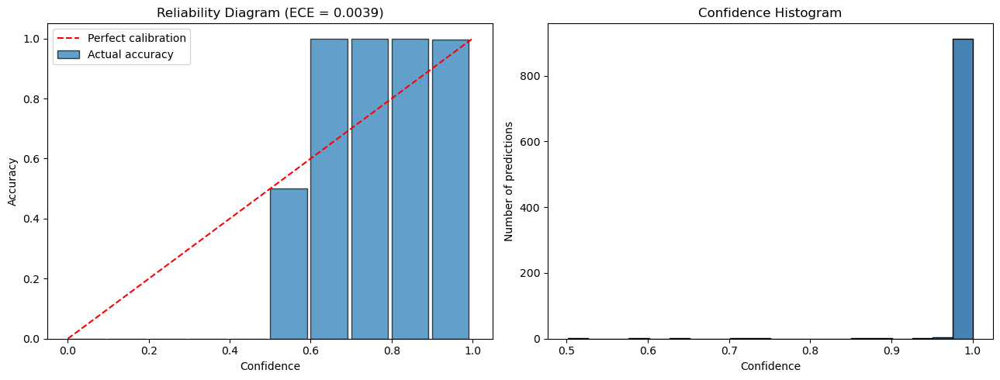

Results saved to: /home/hassan_raza/Downloads/ECG/results/calibration/calibration_bins.csv
Results saved to: /home/hassan_raza/Downloads/ECG/results/calibration/calibration_per_image.csv
Results saved to: /home/hassan_raza/Downloads/ECG/plots/robustness/calibration.png

Overall: ECE = 0.0039


In [81]:
# ============================================================
# CELL 20a: CALIBRATION ANALYSIS (Priority 9, spec Section 38)
# Checks whether the model's confidence scores are trustworthy --
# e.g. does "90% confidence" actually correspond to being correct
# ~90% of the time? Reliability diagram + Expected Calibration Error.
#
# Caching: if results were already computed and saved to disk, ask
# whether to reuse them or rerun. If reused, displays the full saved
# results -- ECE, both plots, and the summary table. If rerun, old
# results are overwritten.
#
# NOTE: the original cell only ever saved the BINNED summary
# (calibration_bins.csv), which is enough to redraw the reliability
# diagram (left plot) but NOT the per-image confidence histogram
# (right plot), since that needs every individual image's confidence
# score, not just bin aggregates. Added a second small cache file,
# calibration_per_image.csv, to store those so the histogram can
# also be redrawn exactly from cache.
# ============================================================

def compute_calibration(model, test_gen, n_bins=10):
    test_gen.reset()

    # Pull all images out manually and predict with an explicit CPU
    # device context -- this model's variables were loaded with
    # tf.device("/CPU:0"), so predict() must run on the same device
    # or TF raises an INVALID_ARGUMENT device-mismatch error trying
    # to reach a CPU-resident variable from a GPU op. Passing the
    # generator straight into model.predict() lets Keras pick the
    # device automatically (GPU), which is what broke this cell.
    all_images, all_labels = [], []
    for _ in range(len(test_gen)):
        imgs, labels = next(test_gen)
        all_images.append(imgs)
        all_labels.append(labels)
    all_images = np.concatenate(all_images, axis=0)[: test_gen.samples]
    all_labels = np.concatenate(all_labels, axis=0)[: test_gen.samples]

    with tf.device("/CPU:0"):
        probs = model.predict(all_images, batch_size=32, verbose=0)

    y_true = np.argmax(all_labels, axis=1)
    y_pred = np.argmax(probs, axis=1)
    confidences = np.max(probs, axis=1)
    correct = (y_pred == y_true).astype(float)

    bin_edges = np.linspace(0, 1, n_bins + 1)
    bin_accuracies, bin_confidences, bin_counts = [], [], []

    for i in range(n_bins):
        in_bin = (confidences >= bin_edges[i]) & (confidences < bin_edges[i + 1])
        if in_bin.sum() > 0:
            bin_accuracies.append(correct[in_bin].mean())
            bin_confidences.append(confidences[in_bin].mean())
            bin_counts.append(in_bin.sum())
        else:
            bin_accuracies.append(0)
            bin_confidences.append((bin_edges[i] + bin_edges[i+1]) / 2)
            bin_counts.append(0)

    bin_counts = np.array(bin_counts)
    bin_accuracies = np.array(bin_accuracies)
    bin_confidences = np.array(bin_confidences)

    # Expected Calibration Error: weighted average gap between confidence and accuracy
    ece = np.sum((bin_counts / bin_counts.sum()) * np.abs(bin_accuracies - bin_confidences))

    return bin_edges, bin_accuracies, bin_confidences, bin_counts, ece, confidences, correct


def plot_calibration(bin_edges, bin_acc, ece, all_confidences, save_path):
    fig, axes = plt.subplots(1, 2, figsize=(13, 5))

    axes[0].bar(bin_edges[:-1], bin_acc, width=1/len(bin_edges), align="edge",
                edgecolor="black", label="Actual accuracy", alpha=0.7)
    axes[0].plot([0, 1], [0, 1], "r--", label="Perfect calibration")
    axes[0].set_xlabel("Confidence")
    axes[0].set_ylabel("Accuracy")
    axes[0].set_title(f"Reliability Diagram (ECE = {ece:.4f})")
    axes[0].legend()

    axes[1].hist(all_confidences, bins=20, edgecolor="black", color="steelblue")
    axes[1].set_xlabel("Confidence")
    axes[1].set_ylabel("Number of predictions")
    axes[1].set_title("Confidence Histogram")

    plt.tight_layout()
    plt.savefig(save_path, dpi=150)
    plt.show()


# ------------------------------------------------------------
# CACHING: check for previously saved calibration results
# ------------------------------------------------------------
calibration_bins_path = os.path.join(RESULTS_DIR, "calibration", "calibration_bins.csv")
calibration_per_image_path = os.path.join(RESULTS_DIR, "calibration", "calibration_per_image.csv")
calibration_plot_path = os.path.join(PLOTS_DIR, "robustness", "calibration.png")

fully_cached = (
    os.path.exists(calibration_bins_path)
    and os.path.exists(calibration_per_image_path)
    and os.path.exists(calibration_plot_path)
)

use_saved = False

if fully_cached:
    choice = input(
        f"Saved calibration results found at:\n  {calibration_bins_path}\n  "
        f"{calibration_per_image_path}\n  {calibration_plot_path}\n"
        "Use saved results instead of rerunning? (y/n): "
    ).strip().lower()
    use_saved = choice == "y"
else:
    print("No local results found, rerunning the cell.")

if use_saved:
    print("Using saved calibration results.\n")

    calibration_summary = pd.read_csv(calibration_bins_path)
    bin_edges = np.append(calibration_summary["bin_start"].to_numpy(), calibration_summary["bin_end"].iloc[-1])
    bin_acc = calibration_summary["avg_accuracy"].to_numpy()
    bin_conf = calibration_summary["avg_confidence"].to_numpy()
    bin_counts = calibration_summary["count"].to_numpy()

    per_image_df = pd.read_csv(calibration_per_image_path)
    all_confidences = per_image_df["confidence"].to_numpy()
    all_correct = per_image_df["correct"].to_numpy()

    ece = np.sum((bin_counts / bin_counts.sum()) * np.abs(bin_acc - bin_conf))

    print(f"Expected Calibration Error (ECE): {ece:.4f}")
    print("(Lower is better -- 0 = perfectly calibrated, i.e. confidence always matches accuracy)")

    print("\n--- Saved reliability diagram + confidence histogram ---")
    plt.figure(figsize=(13, 5))
    plt.imshow(plt.imread(calibration_plot_path))
    plt.axis("off")
    plt.show()

    print("\nFull binned calibration table:")
    print(calibration_summary.to_string(index=False))
    print(f"\nOverall: ECE = {ece:.4f}")

else:
    if fully_cached or os.path.exists(calibration_bins_path):
        print("Rerunning calibration analysis (old results will be overwritten)...")

    bin_edges, bin_acc, bin_conf, bin_counts, ece, all_confidences, all_correct = compute_calibration(
        dense_model, test_generator
    )

    print(f"Expected Calibration Error (ECE): {ece:.4f}")
    print("(Lower is better -- 0 = perfectly calibrated, i.e. confidence always matches accuracy)")

    plot_calibration(bin_edges, bin_acc, ece, all_confidences, calibration_plot_path)

    calibration_summary = pd.DataFrame({
        "bin_start": bin_edges[:-1], "bin_end": bin_edges[1:],
        "avg_confidence": bin_conf, "avg_accuracy": bin_acc, "count": bin_counts,
    })
    os.makedirs(os.path.dirname(calibration_bins_path), exist_ok=True)
    calibration_summary.to_csv(calibration_bins_path, index=False)

    per_image_df = pd.DataFrame({"confidence": all_confidences, "correct": all_correct})
    per_image_df.to_csv(calibration_per_image_path, index=False)

    print(f"Results saved to: {calibration_bins_path}")
    print(f"Results saved to: {calibration_per_image_path}")
    print(f"Results saved to: {calibration_plot_path}")
    print(f"\nOverall: ECE = {ece:.4f}")

In [ ]:
# ============================================================
# CELL 20b: OUT-OF-DISTRIBUTION (OOD) DETECTION (Priority 9, Section 39)
# Tests whether the model can recognize inputs that DON'T look like
# real ECG images -- ideally it should show LOW confidence on these,
# not confidently misclassify them as one of the 4 classes.
# Uses Maximum Softmax Probability (MSP), a standard OOD baseline.
# ============================================================

def load_cifar10_cached():
    """Loads CIFAR-10, downloading only if it isn't already cached locally.

    tf.keras.datasets.cifar10.load_data() calls get_file() under the hood,
    which already checks for an existing, valid local copy before downloading --
    but it only checks the compressed .tar.gz, so on some setups (interrupted
    downloads, cleared extraction dirs, restricted networks) it still re-fetches
    or re-extracts every run. This wraps it with an explicit check on the final
    extracted batch files so a complete local copy is reused as-is with zero
    network activity, and only a missing/incomplete copy triggers a download.
    """
    cache_dir = os.path.join(os.path.expanduser("~"), ".keras", "datasets")
    extracted_dir = os.path.join(cache_dir, "cifar-10-batches-py")
    expected_files = [f"data_batch_{i}" for i in range(1, 6)] + ["test_batch"]

    already_present = os.path.isdir(extracted_dir) and all(
        os.path.isfile(os.path.join(extracted_dir, f)) for f in expected_files
    )

    if already_present:
        print("CIFAR-10 already downloaded and extracted locally -- skipping download.")
    else:
        missing = [f for f in expected_files if not os.path.isfile(os.path.join(extracted_dir, f))]
        print(f"CIFAR-10 not fully cached locally (missing: {missing or ['entire dataset']}). Downloading...")

    # load_data() itself is idempotent -- if the extracted files above are already
    # present it will not re-download or re-extract, it just reads them straight off disk.
    return tf.keras.datasets.cifar10.load_data()


def generate_ood_samples(n_samples, img_size=(300, 300)):
    """Creates three types of clearly out-of-distribution inputs:
    random noise, solid colors, and unrelated natural images (CIFAR-10,
    resized) -- none of these are ECG images at all."""
    ood_images = []
    ood_types = []

    # Type 1: random noise
    for _ in range(n_samples // 3):
        noise = np.random.rand(*img_size, 3).astype("float32")
        ood_images.append(noise)
        ood_types.append("Random Noise")

    # Type 2: solid/near-solid colors
    for _ in range(n_samples // 3):
        color = np.random.rand(3)
        solid = np.ones((*img_size, 3), dtype="float32") * color
        solid += np.random.normal(0, 0.02, solid.shape)   # tiny bit of texture
        ood_images.append(np.clip(solid, 0, 1))
        ood_types.append("Solid Color")

    # Type 3: unrelated natural images (CIFAR-10 -- clearly not ECGs)
    (cifar_images, _), _ = load_cifar10_cached()
    n_cifar = n_samples - len(ood_images)
    idx = np.random.choice(len(cifar_images), n_cifar, replace=False)
    for i in idx:
        resized = cv2.resize(cifar_images[i], img_size).astype("float32") / 255.0
        ood_images.append(resized)
        ood_types.append("Unrelated Natural Image")

    return np.array(ood_images), ood_types


N_OOD_SAMPLES = 150
print("Generating OOD samples (random noise, solid colors, CIFAR-10 images)...")
ood_images, ood_types = generate_ood_samples(N_OOD_SAMPLES)

ood_probs = dense_model.predict(ood_images, batch_size=32, verbose=0)
ood_confidences = np.max(ood_probs, axis=1)

# In-distribution confidences (from the calibration cell above -- real ECG test images)
in_dist_confidences = all_confidences

print(f"\nIn-distribution (real ECGs) mean confidence: {in_dist_confidences.mean()*100:.1f}%")
print(f"Out-of-distribution mean confidence: {ood_confidences.mean()*100:.1f}%")
print("(A well-behaved model should show LOWER confidence on OOD inputs)")

# Simple OOD detector: flag anything below a confidence threshold as OOD.
# Threshold chosen as the point that best separates the two distributions
# (using a simple percentile-based heuristic here).
ood_threshold = np.percentile(in_dist_confidences, 10)   # bottom 10% of in-dist confidence
flagged_as_ood = (ood_confidences < ood_threshold).mean()
false_flagged_indist = (in_dist_confidences < ood_threshold).mean()

print(f"\nUsing threshold = {ood_threshold:.4f}:")
print(f"  {flagged_as_ood*100:.1f}% of true OOD samples correctly flagged")
print(f"  {false_flagged_indist*100:.1f}% of true in-distribution samples incorrectly flagged (false alarms)")

# Visualize the separation
plt.figure(figsize=(8, 5))
plt.hist(in_dist_confidences, bins=30, alpha=0.6, label="In-distribution (real ECGs)", color="steelblue")
plt.hist(ood_confidences, bins=30, alpha=0.6, label="Out-of-distribution", color="red")
plt.axvline(ood_threshold, color="black", linestyle="--", label=f"Threshold ({ood_threshold:.2f})")
plt.xlabel("Confidence (Max Softmax Probability)")
plt.ylabel("Count")
plt.title("In-Distribution vs Out-of-Distribution Confidence")
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(PLOTS_DIR, "robustness", "ood_detection.png"), dpi=150)
plt.show()

# Save OOD results
ood_df = pd.DataFrame({"confidence": ood_confidences, "type": ood_types})
ood_df.to_csv(os.path.join(RESULTS_DIR, "predictions", "ood_results.csv"), index=False)
print(f"\nSaved: results/predictions/ood_results.csv")

In [ ]:
# Image Quality Assessment

Saved results found but are from an older version of this cell (missing the 'correct' column) -- rerunning the cell.
Rerunning image quality assessment (old results will be overwritten)...


Assessing image quality: 100%|███████████████| 928/928 [00:01<00:00, 826.91it/s]
W0000 00:00:1789291806.468659 2948049 cpu_allocator_impl.cc:82] Allocation of 1002240000 exceeds 10% of free system memory.


Results saved to: /home/hassan_raza/Downloads/ECG/results/predictions/image_quality_scores.csv

Quality assessment on 928 test images:
  GOOD: 0 (0.0%)
  POOR: 928 (100.0%)

Most common issues among POOR-quality images:
Very high brightness (overexposed)    928

Model accuracy on GOOD-quality images: nan%
Model accuracy on POOR-quality images: 99.68%


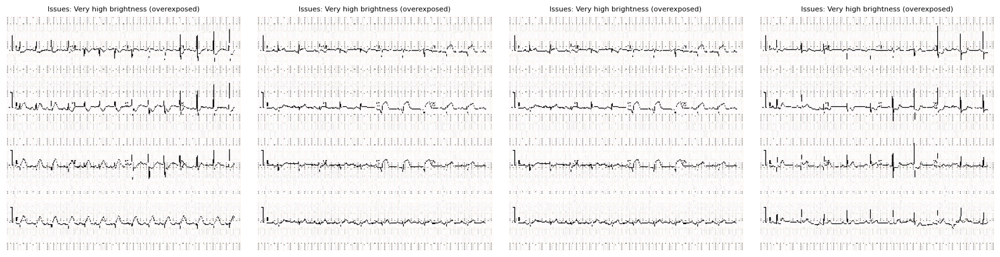

Results saved to: /home/hassan_raza/Downloads/ECG/plots/robustness/poor_quality_examples.png


In [84]:
# ============================================================
# CELL 21: IMAGE QUALITY ASSESSMENT (spec Section 40)
# Runs BEFORE classification in the final pipeline -- flags images
# that are too blurry, too dark/bright, or too low-contrast to
# trust a prediction on, independent of what the model itself says.
#
# Caching: if results were already computed and saved to disk, ask
# whether to reuse them or rerun. If reused, displays the full saved
# results -- summary stats, issue breakdown, accuracy comparison, and
# the saved poor-quality example plot (if one was generated). If
# rerun, old results are overwritten.
#
# NOTE: the original cell never saved per-image correctness (needed
# for the GOOD-vs-POOR accuracy comparison) into quality_df's CSV --
# only quality metrics. Added a "correct" column so that comparison
# can be reproduced from cache without rerunning the model.
# ============================================================

import ast

def assess_image_quality(img):
    """img: float32 array in [0, 1], shape (H, W, 3).
    Returns a dict of quality metrics and an overall GOOD/POOR verdict.
    """
    gray = cv2.cvtColor((img * 255).astype("uint8"), cv2.COLOR_RGB2GRAY)

    # Blur: variance of the Laplacian -- low variance = blurry (few sharp edges)
    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()

    # Brightness: mean pixel value
    brightness = gray.mean()

    # Contrast: standard deviation of pixel values
    contrast = gray.std()

    # Thresholds -- reasonable starting points, not clinically validated
    issues = []
    if laplacian_var < 50:
        issues.append("Excessive blur")
    if brightness < 40:
        issues.append("Very low brightness (too dark)")
    if brightness > 220:
        issues.append("Very high brightness (overexposed)")
    if contrast < 20:
        issues.append("Low contrast")

    quality = "GOOD" if len(issues) == 0 else "POOR"

    return {
        "blur_score": laplacian_var,
        "brightness": brightness,
        "contrast": contrast,
        "quality": quality,
        "issues": issues,
    }


def print_quality_summary(quality_df):
    n_good = (quality_df["quality"] == "GOOD").sum()
    n_poor = (quality_df["quality"] == "POOR").sum()
    print(f"\nQuality assessment on {len(quality_df)} test images:")
    print(f"  GOOD: {n_good} ({n_good/len(quality_df)*100:.1f}%)")
    print(f"  POOR: {n_poor} ({n_poor/len(quality_df)*100:.1f}%)")

    if n_poor > 0:
        print("\nMost common issues among POOR-quality images:")
        all_issues = [issue for issues_list in quality_df[quality_df["quality"] == "POOR"]["issues"] for issue in issues_list]
        issue_counts = pd.Series(all_issues).value_counts()
        print(issue_counts.to_string())

    acc_good = quality_df[quality_df["quality"] == "GOOD"]["correct"].mean()
    acc_poor = quality_df[quality_df["quality"] == "POOR"]["correct"].mean() if n_poor > 0 else float("nan")

    print(f"\nModel accuracy on GOOD-quality images: {acc_good*100:.2f}%")
    print(f"Model accuracy on POOR-quality images: {acc_poor*100:.2f}%" if n_poor > 0 else "No POOR-quality images found to compare.")

    return n_good, n_poor


# ------------------------------------------------------------
# CACHING: check for previously saved image-quality results
# ------------------------------------------------------------
quality_cache_path = os.path.join(RESULTS_DIR, "predictions", "image_quality_scores.csv")
poor_examples_png = os.path.join(PLOTS_DIR, "robustness", "poor_quality_examples.png")

use_saved = False

if os.path.exists(quality_cache_path):
    # Validate the cached file actually has everything the new code expects --
    # an older cache (saved before the "correct" column was added) would
    # otherwise cause a KeyError when print_quality_summary reads it.
    cached_columns = pd.read_csv(quality_cache_path, nrows=0).columns
    cache_is_valid = "correct" in cached_columns

    if cache_is_valid:
        choice = input(
            f"Saved image-quality results found at:\n  {quality_cache_path}\n"
            "Use saved results instead of rerunning? (y/n): "
        ).strip().lower()
        use_saved = choice == "y"
    else:
        print("Saved results found but are from an older version of this cell "
              "(missing the 'correct' column) -- rerunning the cell.")
else:
    print("No local results found, rerunning the cell.")

if use_saved:
    print("Using saved image-quality results.\n")
    quality_df = pd.read_csv(quality_cache_path)
    # "issues" was saved as a Python list's string repr -- parse it back
    quality_df["issues"] = quality_df["issues"].apply(ast.literal_eval)

    n_good, n_poor = print_quality_summary(quality_df)

    if n_poor > 0:
        if os.path.exists(poor_examples_png):
            print("\n--- Saved poor-quality example images ---")
            plt.figure(figsize=(16, 4))
            plt.imshow(plt.imread(poor_examples_png))
            plt.axis("off")
            plt.show()
        else:
            print(f"\n(POOR images exist in the saved data, but {poor_examples_png} was not found on disk.)")
    else:
        print("\nNo POOR-quality images found in this dataset -- all samples passed quality checks.")

    print("\nFull saved results table:")
    print(quality_df.to_string(index=False))

else:
    if os.path.exists(quality_cache_path):
        print("Rerunning image quality assessment (old results will be overwritten)...")

    # Run on the full test set to characterize the dataset's overall quality,
    # and to spot-check whether the metric behaves sensibly
    test_generator.reset()
    all_images = []
    for _ in range(len(test_generator)):
        imgs, _ = next(test_generator)
        all_images.append(imgs)
    all_images = np.concatenate(all_images, axis=0)[: test_generator.samples]

    quality_records = []
    for i, img in enumerate(tqdm(all_images, desc="Assessing image quality")):
        q = assess_image_quality(img)
        q["image_idx"] = i
        quality_records.append(q)

    quality_df = pd.DataFrame(quality_records)

    # Sanity check: does the model perform WORSE on flagged poor-quality images?
    # (Validates that this quality metric is actually meaningful, not arbitrary)
    with tf.device("/CPU:0"):
        dense_probs_all = dense_model.predict(all_images, batch_size=32, verbose=0)

    dense_preds_all = np.argmax(dense_probs_all, axis=1)
    y_true_qual = test_generator.classes[: test_generator.samples]
    quality_df["correct"] = (dense_preds_all == y_true_qual)

    os.makedirs(os.path.dirname(quality_cache_path), exist_ok=True)
    quality_df.to_csv(quality_cache_path, index=False)
    print(f"Results saved to: {quality_cache_path}")

    n_good, n_poor = print_quality_summary(quality_df)

    # Visualize a few examples of flagged POOR images (if any exist)
    poor_examples = quality_df[quality_df["quality"] == "POOR"].head(4)
    if len(poor_examples) > 0:
        fig, axes = plt.subplots(1, len(poor_examples), figsize=(4 * len(poor_examples), 4))
        if len(poor_examples) == 1:
            axes = [axes]
        for ax, (_, row) in zip(axes, poor_examples.iterrows()):
            ax.imshow(np.clip(all_images[int(row["image_idx"])], 0, 1))
            ax.set_title(f"Issues: {', '.join(row['issues'])}", fontsize=8)
            ax.axis("off")
        plt.tight_layout()
        plt.savefig(poor_examples_png, dpi=150)
        plt.show()
        print(f"Results saved to: {poor_examples_png}")
    else:
        print("\nNo POOR-quality images found in this dataset -- all samples passed quality checks.")

Comprehensive Error Analysis

Saved error-analysis results found at:
  /home/hassan_raza/Downloads/ECG/error_analysis/densenet121_all_predictions.csv
Use saved results instead of rerunning? (y/n): y
Using saved error-analysis results.

Total test images: 928
Correct: 925 (99.7%)
Misclassified: 3 (0.3%)

CONFIDENCE ANALYSIS
Average confidence on CORRECT predictions:   99.72%
Average confidence on INCORRECT predictions: 83.12%
(A well-behaved model should be notably LESS confident when wrong)

MOST CONFUSED CLASS PAIRS
  ECG Images of Patient that have abn -> Normal Person ECG Images (284x12=34: 3 cases

--- Saved misclassified examples ---


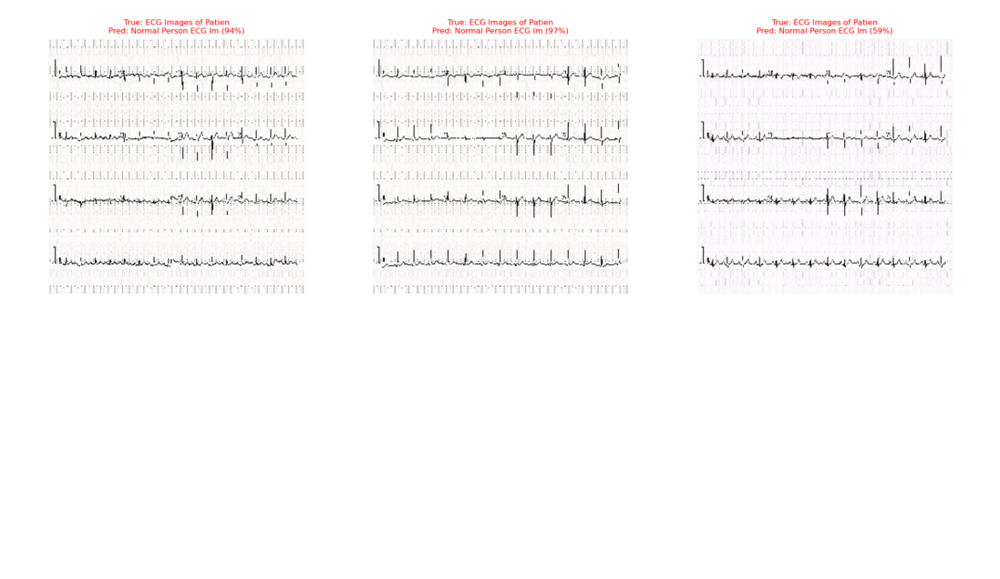


--- Saved confidence distribution (correct vs incorrect) ---


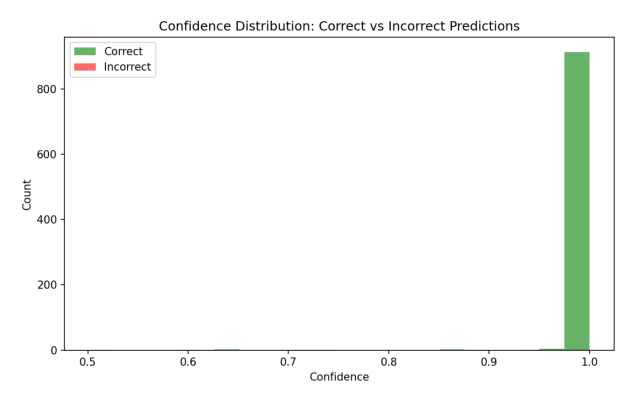


Full saved predictions table:
 image_idx                                                     actual_class                                                  predicted_class  confidence       model  correct
         0       ECG Images of Myocardial Infarction Patients (240x12=2880)       ECG Images of Myocardial Infarction Patients (240x12=2880)    1.000000 DenseNet121     True
         1       ECG Images of Myocardial Infarction Patients (240x12=2880)       ECG Images of Myocardial Infarction Patients (240x12=2880)    1.000000 DenseNet121     True
         2       ECG Images of Myocardial Infarction Patients (240x12=2880)       ECG Images of Myocardial Infarction Patients (240x12=2880)    1.000000 DenseNet121     True
         3       ECG Images of Myocardial Infarction Patients (240x12=2880)       ECG Images of Myocardial Infarction Patients (240x12=2880)    0.999999 DenseNet121     True
         4       ECG Images of Myocardial Infarction Patients (240x12=2880)       ECG Images of Myo

In [85]:
# ============================================================
# CELL 22: COMPREHENSIVE ERROR ANALYSIS (spec Sections 36-37)
# Combines predictions, confidence, and consensus data already
# computed in earlier cells into one unified error analysis.
#
# Caching: if results were already computed and saved to disk, ask
# whether to reuse them or rerun. If reused, displays the full saved
# results -- stats, confused-pairs table, and both saved plots (where
# they exist). If rerun, old results are overwritten.
#
# NOTE: the raw per-image arrays (error_images) are never saved to
# disk -- only prediction metadata (CSV). So when loading from cache,
# the misclassified-examples plot is shown via its saved PNG (if one
# was generated last run), not regenerated from raw pixels.
# ============================================================

def run_error_analysis(model, test_gen, model_name="DenseNet121"):
    test_gen.reset()
    all_images, all_labels = [], []
    for _ in range(len(test_gen)):
        imgs, labels = next(test_gen)
        all_images.append(imgs)
        all_labels.append(labels)
    all_images = np.concatenate(all_images, axis=0)[: test_gen.samples]
    all_labels = np.concatenate(all_labels, axis=0)[: test_gen.samples]
    y_true = np.argmax(all_labels, axis=1)

    with tf.device("/CPU:0"):
        probs = model.predict(all_images, batch_size=32, verbose=0)

    y_pred = np.argmax(probs, axis=1)
    confidence = np.max(probs, axis=1)

    error_records = []
    for i in range(len(y_true)):
        error_records.append({
            "image_idx": i,
            "actual_class": CLASS_NAMES[y_true[i]],
            "predicted_class": CLASS_NAMES[y_pred[i]],
            "confidence": confidence[i],
            "model": model_name,
            "correct": y_true[i] == y_pred[i],
        })

    return pd.DataFrame(error_records), all_images


def print_error_analysis_summary(error_df):
    misclassified_df = error_df[~error_df["correct"]].copy()
    correct_df = error_df[error_df["correct"]].copy()

    print(f"Total test images: {len(error_df)}")
    print(f"Correct: {len(correct_df)} ({len(correct_df)/len(error_df)*100:.1f}%)")
    print(f"Misclassified: {len(misclassified_df)} ({len(misclassified_df)/len(error_df)*100:.1f}%)")

    print(f"\n{'='*50}")
    print("CONFIDENCE ANALYSIS")
    print(f"{'='*50}")
    print(f"Average confidence on CORRECT predictions:   {correct_df['confidence'].mean()*100:.2f}%")
    if len(misclassified_df) > 0:
        print(f"Average confidence on INCORRECT predictions: {misclassified_df['confidence'].mean()*100:.2f}%")
    else:
        print("Average confidence on INCORRECT predictions: N/A (no misclassified images)")
    print("(A well-behaved model should be notably LESS confident when wrong)")

    confusion_pairs = None
    if len(misclassified_df) > 0:
        print(f"\n{'='*50}")
        print("MOST CONFUSED CLASS PAIRS")
        print(f"{'='*50}")
        confusion_pairs = misclassified_df.groupby(["actual_class", "predicted_class"]).size().reset_index(name="count")
        confusion_pairs = confusion_pairs.sort_values("count", ascending=False)
        for _, row in confusion_pairs.head(5).iterrows():
            print(f"  {row['actual_class'][:35]} -> {row['predicted_class'][:35]}: {row['count']} cases")

    return misclassified_df, correct_df, confusion_pairs


# ------------------------------------------------------------
# CACHING: check for previously saved error-analysis results
# ------------------------------------------------------------
error_cache_path = os.path.join(ERROR_ANALYSIS_DIR, "densenet121_all_predictions.csv")
confused_pairs_cache_path = os.path.join(ERROR_ANALYSIS_DIR, "confused_class_pairs.csv")
misclassified_png = os.path.join(PLOTS_DIR, "confusion_matrix", "misclassified_examples.png")
confidence_dist_png = os.path.join(PLOTS_DIR, "confusion_matrix", "confidence_correct_vs_incorrect.png")

use_saved = False

if os.path.exists(error_cache_path):
    choice = input(
        f"Saved error-analysis results found at:\n  {error_cache_path}\n"
        "Use saved results instead of rerunning? (y/n): "
    ).strip().lower()
    use_saved = choice == "y"
else:
    print("No local results found, rerunning the cell.")

if use_saved:
    print("Using saved error-analysis results.\n")
    error_df = pd.read_csv(error_cache_path)

    misclassified_df, correct_df, confusion_pairs = print_error_analysis_summary(error_df)

    if confusion_pairs is None and os.path.exists(confused_pairs_cache_path):
        # Fallback: if the summary derived zero misclassified rows from this
        # CSV but a confused-pairs file exists from a previous run, surface it
        # rather than silently hiding it (shouldn't normally happen together,
        # but keeps the two files from silently disagreeing).
        confusion_pairs = pd.read_csv(confused_pairs_cache_path)

    n_show = min(6, len(misclassified_df))
    if n_show > 0:
        if os.path.exists(misclassified_png):
            print("\n--- Saved misclassified examples ---")
            plt.figure(figsize=(14, 8))
            plt.imshow(plt.imread(misclassified_png))
            plt.axis("off")
            plt.show()
        else:
            print(f"\n({len(misclassified_df)} misclassified images exist in the saved data, "
                  f"but {misclassified_png} was not found on disk.)")
    else:
        print("\nNo misclassified examples -- model got everything right on the test set.")

    if os.path.exists(confidence_dist_png):
        print("\n--- Saved confidence distribution (correct vs incorrect) ---")
        plt.figure(figsize=(8, 5))
        plt.imshow(plt.imread(confidence_dist_png))
        plt.axis("off")
        plt.show()

    print("\nFull saved predictions table:")
    print(error_df.to_string(index=False))

    if confusion_pairs is not None:
        print("\nFull saved confused-class-pairs table:")
        print(confusion_pairs.to_string(index=False))

else:
    if os.path.exists(error_cache_path):
        print("Rerunning error analysis (old results will be overwritten)...")

    error_df, error_images = run_error_analysis(dense_model, test_generator, "DenseNet121")

    os.makedirs(os.path.dirname(error_cache_path), exist_ok=True)
    error_df.to_csv(error_cache_path, index=False)
    print(f"Results saved to: {error_cache_path}")

    misclassified_df, correct_df, confusion_pairs = print_error_analysis_summary(error_df)

    if confusion_pairs is not None:
        confusion_pairs.to_csv(confused_pairs_cache_path, index=False)
        print(f"Results saved to: {confused_pairs_cache_path}")

    # --- Visualize misclassified examples with confidence ---
    n_show = min(6, len(misclassified_df))
    if n_show > 0:
        sample_errors = misclassified_df.sample(n_show, random_state=SEED)
        fig, axes = plt.subplots(2, 3, figsize=(14, 8))
        axes = axes.flatten()
        for ax, (_, row) in zip(axes, sample_errors.iterrows()):
            img = error_images[int(row["image_idx"])]
            ax.imshow(np.clip(img, 0, 1))
            ax.set_title(
                f"True: {row['actual_class'][:20]}\nPred: {row['predicted_class'][:20]} ({row['confidence']*100:.0f}%)",
                fontsize=8, color="red"
            )
            ax.axis("off")
        for j in range(n_show, len(axes)):
            axes[j].axis("off")
        plt.tight_layout()
        plt.savefig(misclassified_png, dpi=150)
        plt.show()
        print(f"Results saved to: {misclassified_png}")
    else:
        print("\nNo misclassified examples -- model got everything right on the test set.")

    # --- Confidence distribution: correct vs incorrect ---
    plt.figure(figsize=(8, 5))
    plt.hist(correct_df["confidence"], bins=20, alpha=0.6, label="Correct", color="green")
    if len(misclassified_df) > 0:
        plt.hist(misclassified_df["confidence"], bins=20, alpha=0.6, label="Incorrect", color="red")
    plt.xlabel("Confidence")
    plt.ylabel("Count")
    plt.title("Confidence Distribution: Correct vs Incorrect Predictions")
    plt.legend()
    plt.tight_layout()
    plt.savefig(confidence_dist_png, dpi=150)
    plt.show()
    print(f"Results saved to: {confidence_dist_png}")

Final Model Comparison Table (Everything Combined)

Saved final comparison results found at:
  /home/hassan_raza/Downloads/ECG/results/metrics/final_model_comparison.csv
  /home/hassan_raza/Downloads/ECG/results/metrics/final_model_comparison_formatted.csv
  /home/hassan_raza/Downloads/ECG/plots/roc/final_comparison_chart.png
Use saved results instead of rerunning (this re-evaluates ALL 11 models on the full test set, so it takes a while)? (y/n): y
Using saved final comparison results.


FINAL MODEL COMPARISON — 12 models/ensembles evaluated
                  Model              Type Accuracy Precision Recall     F1     AUC
Fusion: DenseNet+ResNet    Feature Fusion   99.78%    99.83% 99.79% 99.80% 100.00%
            InceptionV3 Transfer Learning   99.78%    99.79% 99.79% 99.79% 100.00%
                  VGG16 Transfer Learning   99.78%    99.79% 99.71% 99.75% 100.00%
            DenseNet121 Transfer Learning   99.68%    99.74% 99.68% 99.71% 100.00%
   Fusion: DenseNet+VGG    Feature Fusion   99.68%    99.74% 99.68% 99.71% 100.00%
 Ensem

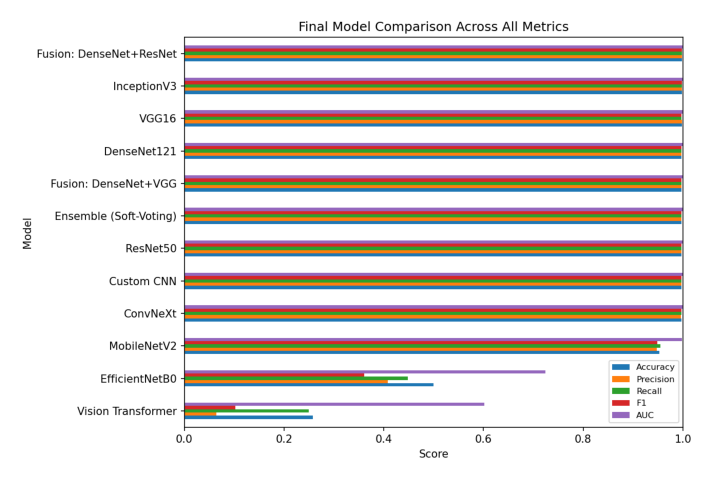

In [86]:
# ============================================================
# CELL 23: FINAL MODEL COMPARISON TABLE
# Combines all 9 individual models + 2 fusion models + ensemble
# into one master evaluation table. This is the definitive
# results table for your report (spec Section 48).
#
# Caching: if results were already computed and saved to disk, ask
# whether to reuse them or rerun (this re-evaluates ALL 11 models
# on the full test set, so it's one of the slower cells). If reused,
# displays the full saved comparison table, best-model line, and the
# saved horizontal bar chart. If rerun, old results are overwritten.
# ============================================================

def classify_model_type(name):
    if "Ensemble" in name:
        return "Ensemble"
    if "Fusion" in name:
        return "Feature Fusion"
    if name == "Custom CNN":
        return "Baseline"
    return "Transfer Learning"


def print_comparison_table(comparison_df):
    display_df = comparison_df.copy()
    for col in ["Accuracy", "Precision", "Recall", "F1", "AUC"]:
        display_df[col] = display_df[col].apply(lambda v: f"{v*100:.2f}%" if pd.notnull(v) else "—")

    print(f"\n{'='*70}")
    print(f"FINAL MODEL COMPARISON — {len(comparison_df)} models/ensembles evaluated")
    print(f"{'='*70}")
    print(display_df.to_string(index=False))

    best_row = comparison_df.iloc[0]
    print(f"\nBest overall (by macro F1): {best_row['Model']} ({best_row['Type']}) — F1 = {best_row['F1']*100:.2f}%")

    return display_df, best_row


def plot_comparison_chart(comparison_df, save_path):
    metrics_to_plot = ["Accuracy", "Precision", "Recall", "F1", "AUC"]
    plot_df = comparison_df.set_index("Model")[metrics_to_plot].iloc[::-1]

    fig, ax = plt.subplots(figsize=(9, max(6, len(plot_df) * 0.5)))
    plot_df.plot(kind="barh", ax=ax)
    ax.set_title("Final Model Comparison Across All Metrics")
    ax.set_xlabel("Score")
    ax.set_xlim(0, 1)
    ax.legend(loc="lower right", fontsize=8)
    plt.tight_layout()
    plt.savefig(save_path, dpi=150)
    plt.show()


# ------------------------------------------------------------
# CACHING: check for previously saved final comparison results
# ------------------------------------------------------------
comparison_cache_path = os.path.join(RESULTS_DIR, "metrics", "final_model_comparison.csv")
comparison_formatted_path = os.path.join(RESULTS_DIR, "metrics", "final_model_comparison_formatted.csv")
comparison_chart_path = os.path.join(PLOTS_DIR, "roc", "final_comparison_chart.png")

fully_cached = (
    os.path.exists(comparison_cache_path)
    and os.path.exists(comparison_formatted_path)
    and os.path.exists(comparison_chart_path)
)

use_saved = False

if fully_cached:
    choice = input(
        f"Saved final comparison results found at:\n  {comparison_cache_path}\n  "
        f"{comparison_formatted_path}\n  {comparison_chart_path}\n"
        "Use saved results instead of rerunning (this re-evaluates ALL 11 models "
        "on the full test set, so it takes a while)? (y/n): "
    ).strip().lower()
    use_saved = choice == "y"
else:
    print("No local results found, rerunning the cell.")

if use_saved:
    print("Using saved final comparison results.\n")
    comparison_df = pd.read_csv(comparison_cache_path)

    display_df, best_row = print_comparison_table(comparison_df)

    print("\n--- Saved final comparison chart ---")
    plt.figure(figsize=(9, max(6, len(comparison_df) * 0.5)))
    plt.imshow(plt.imread(comparison_chart_path))
    plt.axis("off")
    plt.show()

    BEST_MODEL_NAME = best_row["Model"]
    BEST_MODEL_TYPE = best_row["Type"]

else:
    if fully_cached or os.path.exists(comparison_cache_path):
        print("Rerunning final model comparison (old results will be overwritten)...")

    all_results = []

    individual_models = {
        "Custom CNN": cnn_model,
        "VGG16": vgg_model,
        "DenseNet121": dense_model,
        "ResNet50": resnet_model,
        "ConvNeXt": convnext_model,
        "EfficientNetB0": efficientnet_model,
        "InceptionV3": inception_model,
        "MobileNetV2": mobilenet_model,
        "Vision Transformer": vit_model,
        "Fusion: DenseNet+VGG": fusion_dv_model,
        "Fusion: DenseNet+ResNet": fusion_dr_model,
    }

    print("Evaluating all models on the test set...\n")
    for name, model in individual_models.items():
        if model is None:
            print(f"Skipping {name} (not available)")
            continue
        result = evaluate_predictions(*get_ensemble_predictions({name: model}, test_generator)[::2], name)
        # get_ensemble_predictions returns (y_true, per_model_probs, ensemble_probs);
        # for a single model, ensemble_probs == that model's own probs
        all_results.append(result)

    # Add the ensemble result (already computed in Cell 12)
    all_results.append(ensemble_result)

    # ---------------- Build the final comparison table ----------------
    comparison_df = pd.DataFrame([
        {k: v for k, v in r.items() if k not in ("y_true", "y_pred", "y_prob")}
        for r in all_results
    ])

    comparison_df.insert(1, "Type", comparison_df["Model"].apply(classify_model_type))
    comparison_df = comparison_df.sort_values("F1", ascending=False).reset_index(drop=True)

    display_df, best_row = print_comparison_table(comparison_df)

    os.makedirs(os.path.dirname(comparison_cache_path), exist_ok=True)
    comparison_df.to_csv(comparison_cache_path, index=False)
    display_df.to_csv(comparison_formatted_path, index=False)
    print(f"\nResults saved to: {comparison_cache_path}")
    print(f"Results saved to: {comparison_formatted_path}")

    # ---------------- Horizontal bar chart ----------------
    plot_comparison_chart(comparison_df, comparison_chart_path)
    print(f"Results saved to: {comparison_chart_path}")

    BEST_MODEL_NAME = best_row["Model"]
    BEST_MODEL_TYPE = best_row["Type"]

Founder/Baseline Comparison Table

In [94]:
# ============================================================
# CELL 24: FOUNDER / BASELINE COMPARISON (spec Sections 49-51)
# Compares your DenseNet121 result against the originally supplied
# reference numbers. Per spec: report differences transparently,
# investigate WHY they exist, never hide or spin the comparison.
#
# Caching: if results were already computed and saved to disk, ask
# whether to reuse them or rerun. If reused, displays the full saved
# comparison table, difference analysis, methodology notes, and
# interpretation exactly as a fresh run would. If rerun, old results
# are overwritten.
#
# NOTE: this cell does no model inference -- it only reformats numbers
# already sitting in comparison_df (from Cell 23). So caching mainly
# saves you from needing comparison_df in memory, not compute time.
# ============================================================

# Founder/original reference numbers, as published in the supplied
# spec/code (Section 18) -- reported EXACTLY as given, not adjusted
FOUNDER_RESULTS = {
    "Accuracy": 0.8578,
    "Precision": 0.8718,
    "Recall": 0.8502,
    "F1": None,     # not reported by the founder/original source
    "AUC": 0.9746,
}

methodology_differences = [
    "Image preprocessing: we added ECG-grid cropping to remove patient ID/header/"
    "footer text, which the original implementation did not include. This changes "
    "the effective input the model sees.",

    "Class balancing: we physically oversampled minority classes to equalize "
    "training counts; the original implementation used class weighting only "
    "(loss-based), not physical balancing. This is a different way of addressing "
    "the same 4-class imbalance.",

    "Validation pipeline: we fixed a methodological issue where the original "
    "implementation applied training augmentation to the validation split as well. "
    "Our validation set uses clean (unaugmented) images, which changes what "
    "'validation accuracy' reflects.",

    "Random seed / initialization: unless the founder result used the exact same "
    "seed (42) and TensorFlow/library versions, some difference is expected from "
    "stochastic training alone, even with identical code.",

    "Hardware: training ran on a university RTX 3070 GPU; the original result's "
    "hardware/environment is not stated, and floating-point non-determinism across "
    "different GPUs/driver versions can cause small variations.",
]


def print_founder_comparison(founder_comparison_df):
    display_founder_df = founder_comparison_df.copy()
    for col in ["Accuracy", "Precision", "Recall", "F1", "AUC"]:
        display_founder_df[col] = display_founder_df[col].apply(
            lambda v: f"{v*100:.2f}%" if pd.notnull(v) else "Not reported"
        )

    print("=" * 70)
    print("FOUNDER / BASELINE COMPARISON")
    print("=" * 70)
    print(display_founder_df.to_string(index=False))

    our_row = founder_comparison_df[founder_comparison_df["Evaluation"] == "Our DenseNet121"].iloc[0]

    print(f"\n{'='*70}")
    print("DIFFERENCE ANALYSIS")
    print(f"{'='*70}")
    for metric in ["Accuracy", "Precision", "Recall", "AUC"]:
        founder_val = FOUNDER_RESULTS[metric]
        our_val = our_row[metric]
        if founder_val is not None and pd.notnull(our_val):
            diff = (our_val - founder_val) * 100
            direction = "higher" if diff > 0 else "lower" if diff < 0 else "identical"
            print(f"{metric}: Ours is {abs(diff):.2f} percentage points {direction} than the founder result "
                  f"({our_val*100:.2f}% vs {founder_val*100:.2f}%)")

    print(f"\n{'='*70}")
    print("KNOWN METHODOLOGY DIFFERENCES FROM THE FOUNDER/ORIGINAL IMPLEMENTATION")
    print(f"{'='*70}")
    for i, diff in enumerate(methodology_differences, 1):
        print(f"{i}. {diff}\n")

    print("=" * 70)
    print("INTERPRETATION")
    print("=" * 70)
    print(
        "Given these methodology differences, this comparison should NOT be read as "
        "'our algorithm is better/worse than the founder's' in a strict sense -- the "
        "two evaluations are not run under identical conditions. The comparison is "
        "included to show transparency about how our implementation diverges and "
        "why, per standard research reporting practice (spec Sections 50-51)."
    )


# ------------------------------------------------------------
# CACHING: check for previously saved founder-comparison results
# ------------------------------------------------------------
founder_cache_path = os.path.join(RESULTS_DIR, "metrics", "founder_comparison.csv")

use_saved = False

if os.path.exists(founder_cache_path):
    choice = input(
        f"Saved founder-comparison results found at:\n  {founder_cache_path}\n"
        "Use saved results instead of rerunning? (y/n): "
    ).strip().lower()
    use_saved = choice == "y"
else:
    print("No local results found, rerunning the cell.")

if use_saved:
    print("Using saved founder-comparison results.\n")
    founder_comparison_df = pd.read_csv(founder_cache_path)
    print_founder_comparison(founder_comparison_df)

else:
    if os.path.exists(founder_cache_path):
        print("Rerunning founder comparison (old results will be overwritten)...")

    # Your own DenseNet121 result, pulled from the comparison table (Cell 23)
    your_densenet_row = comparison_df[comparison_df["Model"] == "DenseNet121"].iloc[0]

    founder_comparison_df = pd.DataFrame([
        {
            "Evaluation": "Founder/Original",
            "Accuracy": FOUNDER_RESULTS["Accuracy"],
            "Precision": FOUNDER_RESULTS["Precision"],
            "Recall": FOUNDER_RESULTS["Recall"],
            "F1": FOUNDER_RESULTS["F1"],
            "AUC": FOUNDER_RESULTS["AUC"],
            "Dataset": "Original supplied dataset",
            "Split": "Original split",
            "Notes": "Published/supplied result",
        },
        {
            "Evaluation": "Our DenseNet121",
            "Accuracy": your_densenet_row["Accuracy"],
            "Precision": your_densenet_row["Precision"],
            "Recall": your_densenet_row["Recall"],
            "F1": your_densenet_row["F1"],
            "AUC": your_densenet_row["AUC"],
            "Dataset": "Kaggle ECG dataset (cropped + balanced)",
            "Split": "80/20 train/val split from train folder, separate test folder",
            "Notes": "Our reimplementation, with methodology changes below",
        },
    ])

    os.makedirs(os.path.dirname(founder_cache_path), exist_ok=True)
    founder_comparison_df.to_csv(founder_cache_path, index=False)
    print(f"Results saved to: {founder_cache_path}")

    print_founder_comparison(founder_comparison_df)

Saved founder-comparison results found at:
  /home/hassan_raza/Downloads/ECG/results/metrics/founder_comparison.csv
Use saved results instead of rerunning? (y/n): y
Using saved founder-comparison results.

FOUNDER / BASELINE COMPARISON
      Evaluation Accuracy Precision Recall           F1     AUC                                 Dataset                                                         Split                                                Notes
Founder/Original   85.78%    87.18% 85.02% Not reported  97.46%               Original supplied dataset                                                Original split                            Published/supplied result
 Our DenseNet121   99.68%    99.74% 99.68%       99.71% 100.00% Kaggle ECG dataset (cropped + balanced) 80/20 train/val split from train folder, separate test folder Our reimplementation, with methodology changes below

DIFFERENCE ANALYSIS
Accuracy: Ours is 13.90 percentage points higher than the founder result (99.68% vs 85

(Founder Comparison) — Side-by-Side Bar Chart

No local results found for 'founder_comparison' -- running the cell...
'your_densenet_row' not found -- reconstructing it from comparison_df.

Founder/Original vs. Our DenseNet121 -- values used in chart:
Metric          Founder       Ours
Accuracy         0.8578     0.9968
Precision        0.8718     0.9974
Recall           0.8502     0.9968
AUC              0.9746     1.0000


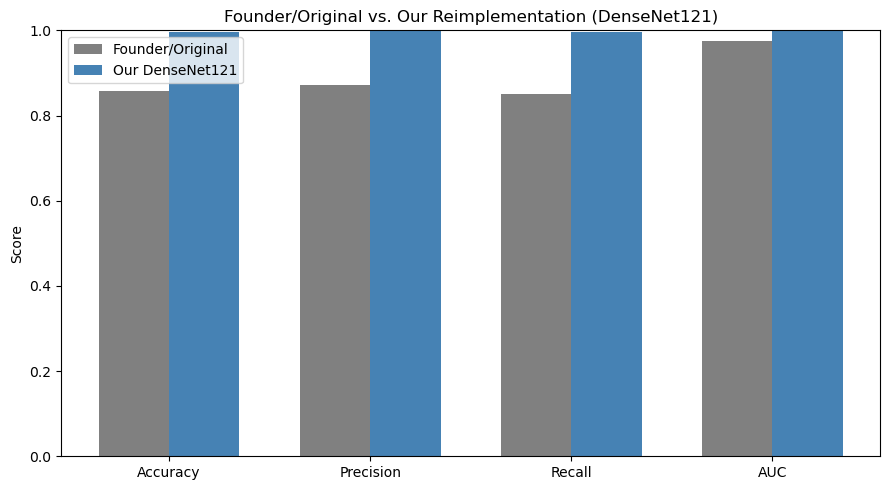

Saved checkpoint 'founder_comparison' -> /home/hassan_raza/Downloads/ECG/results/checkpoints/founder_comparison.pkl  (keys: ['metrics_for_chart', 'founder_vals', 'our_vals'])
Results saved.


In [98]:
# ============================================================
# ADD TO CELL 24: FOUNDER VS. OURS COMPARISON CHART
# (checkpoint-aware: reuses saved results unless you choose to rerun)
# ============================================================

CHECKPOINT_NAME = "founder_comparison"


def _render_founder_comparison_chart(metrics_for_chart, founder_vals, our_vals):
    """Draws the bar chart AND prints the underlying numbers, so both
    the fresh-run path and the loaded-from-disk path show identical,
    complete output."""

    print("\nFounder/Original vs. Our DenseNet121 -- values used in chart:")
    print(f"{'Metric':<12} {'Founder':>10} {'Ours':>10}")
    for m, f_val, o_val in zip(metrics_for_chart, founder_vals, our_vals):
        print(f"{m:<12} {f_val:>10.4f} {o_val:>10.4f}")

    x = np.arange(len(metrics_for_chart))
    width = 0.35

    fig, ax = plt.subplots(figsize=(9, 5))
    ax.bar(x - width/2, founder_vals, width, label="Founder/Original", color="gray")
    ax.bar(x + width/2, our_vals, width, label="Our DenseNet121", color="steelblue")
    ax.set_xticks(x)
    ax.set_xticklabels(metrics_for_chart)
    ax.set_ylabel("Score")
    ax.set_ylim(0, 1)
    ax.set_title("Founder/Original vs. Our Reimplementation (DenseNet121)")
    ax.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(PLOTS_DIR, "training", "founder_comparison_chart.png"), dpi=150)
    plt.show()


use_saved = False

if checkpoint_exists(CHECKPOINT_NAME):
    choice = input(
        f"Saved results found for '{CHECKPOINT_NAME}'. "
        "Use saved results instead of recomputing? (y/n): "
    ).strip().lower()
    use_saved = choice == "y"
else:
    print(f"No local results found for '{CHECKPOINT_NAME}' -- running the cell...")

if use_saved:
    data = load_checkpoint(CHECKPOINT_NAME)
    metrics_for_chart = data["metrics_for_chart"]
    founder_vals = data["founder_vals"]
    our_vals = data["our_vals"]

    print("Using saved results.")
    _render_founder_comparison_chart(metrics_for_chart, founder_vals, our_vals)

else:
    if "your_densenet_row" not in globals():
        if "comparison_df" in globals():
            print("'your_densenet_row' not found -- reconstructing it from comparison_df.")
            your_densenet_row = comparison_df[comparison_df["Model"] == "DenseNet121"].iloc[0]
        else:
            raise NameError(
                "Neither 'your_densenet_row' nor 'comparison_df' is defined -- "
                "run Cell 23 (Final Model Comparison Table) first, since this "
                "cell needs its output to compute fresh results."
            )

    metrics_for_chart = ["Accuracy", "Precision", "Recall", "AUC"]  # F1 excluded, founder didn't report it
    founder_vals = [FOUNDER_RESULTS[m] for m in metrics_for_chart]
    our_vals = [your_densenet_row[m] for m in metrics_for_chart]

    _render_founder_comparison_chart(metrics_for_chart, founder_vals, our_vals)

    save_checkpoint(
        CHECKPOINT_NAME,
        metrics_for_chart=metrics_for_chart,
        founder_vals=founder_vals,
        our_vals=our_vals,
    )
    print("Results saved.")

In [97]:
# One-time install (uncomment, run once):
#!pip install reportlab --break-system-packages


Automated PDF Report Generation

In [100]:
# ============================================================
# CELL 25: AUTOMATED PDF REPORT (spec Sections 12, 63)
# Generates a per-prediction PDF report: image, prediction,
# confidence, consensus, uncertainty, model breakdown, Grad-CAM.
# Lower priority per spec Section 70 -- build this once the
# core pipeline above is solid.
#
# Caching: each report is checkpointed under a name derived from
# output_path, since results are per-image, not one global result.
# If saved results exist, asks whether to reuse or rerun. If reused,
# prints the full analysis (not just a silent load) before rebuilding
# the PDF from the saved data. If rerun, old results are overwritten.
# ============================================================


from reportlab.lib.pagesizes import letter
from reportlab.lib.units import inch
from reportlab.lib import colors
from reportlab.platypus import SimpleDocTemplate, Paragraph, Spacer, Image as RLImage, Table, TableStyle
from reportlab.lib.styles import getSampleStyleSheet, ParagraphStyle
from PIL import Image as PILImage
import tempfile


def _print_pdf_report_summary(model_predictions, vote_counts, final_prediction,
                               final_confidence, uncertainty, uncertainty_label, decision):
    """Prints the full analysis to the console, so a saved-result reuse
    shows exactly as much as a fresh run would -- not just a silent load."""
    print(f"\nPrediction: {final_prediction}")
    print(f"Confidence: {final_confidence*100:.1f}%")
    print(f"Model Consensus: {vote_counts.max()}/{vote_counts.sum()}")
    print(f"Uncertainty: {uncertainty_label} ({uncertainty:.4f})")
    print(f"Decision: {decision}")
    print("\nModel Predictions:")
    for name, (pred, conf) in model_predictions.items():
        print(f"  {name:<25} {pred:<20} {conf*100:.1f}%")


def generate_ecg_pdf_report(image_array, model_dict, dense_model_for_gradcam, output_path, checkpoint_name=None):
    """Runs a single ECG image through the full pipeline (prediction,
    consensus, uncertainty via MC dropout, Grad-CAM) and produces a
    PDF report summarizing everything -- the automated report from
    spec Section 12.
    """

    if checkpoint_name is None:
        checkpoint_name = f"pdf_report_{os.path.splitext(os.path.basename(output_path))[0]}"

    use_saved = False

    if checkpoint_exists(checkpoint_name):
        choice = input(
            f"Saved results found for '{checkpoint_name}'. "
            "Use saved results instead of recomputing? (y/n): "
        ).strip().lower()
        use_saved = choice == "y"
    else:
        print(f"No local results found for '{checkpoint_name}' -- running the cell...")

    if use_saved:
        data = load_checkpoint(checkpoint_name)
        image_array = data["image_array"]
        overlay = data["overlay"]
        model_predictions = data["model_predictions"]
        vote_counts = data["vote_counts"]
        final_prediction = data["final_prediction"]
        final_confidence = data["final_confidence"]
        consensus = data["consensus"]
        uncertainty = data["uncertainty"]
        uncertainty_label = data["uncertainty_label"]
        decision = data["decision"]

        print("Using saved results.")
        _print_pdf_report_summary(
            model_predictions, vote_counts, final_prediction,
            final_confidence, uncertainty, uncertainty_label, decision
        )

    else:
        img_batch = np.expand_dims(image_array, axis=0)

        # --- Predictions from each model ---
        model_predictions = {}
        all_probs = []
        for name, model in model_dict.items():
            if model is None:
                continue
            probs = model.predict(img_batch, verbose=0)[0]
            pred_class = CLASS_NAMES[np.argmax(probs)]
            model_predictions[name] = (pred_class, probs[np.argmax(probs)])
            all_probs.append(probs)

        ensemble_probs = np.mean(all_probs, axis=0)
        final_prediction = CLASS_NAMES[np.argmax(ensemble_probs)]
        final_confidence = np.max(ensemble_probs)

        # --- Consensus ---
        votes = [CLASS_NAMES.index(pred) for pred, _ in model_predictions.values()]
        vote_counts = np.bincount(votes, minlength=NUM_CLASSES)
        consensus = vote_counts.max() / len(votes)

        # --- Uncertainty (quick MC dropout, fewer passes for speed on a single image) ---
        mc_passes = [dense_model_for_gradcam(img_batch, training=True).numpy()[0] for _ in range(10)]
        uncertainty = np.std(mc_passes, axis=0).mean()
        uncertainty_label = "Low" if uncertainty < UNCERTAINTY_THRESHOLD else "High"

        # --- Reliability decision (reuses Cell 15's thresholds) ---
        decision = reliability_decision(final_confidence, consensus, uncertainty)

        # --- Grad-CAM ---
        base_name, conv_name = find_last_conv_layer(dense_model_for_gradcam)
        heatmap, _, _ = make_gradcam_heatmap(img_batch, dense_model_for_gradcam, base_name, conv_name)
        heatmap_resized = cv2.resize(heatmap, (image_array.shape[1], image_array.shape[0]))
        heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
        heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB) / 255.0
        overlay = np.clip(0.6 * image_array + 0.4 * heatmap_color, 0, 1)

        _print_pdf_report_summary(
            model_predictions, vote_counts, final_prediction,
            final_confidence, uncertainty, uncertainty_label, decision
        )

        # save_checkpoint() opens the file in "wb" mode, so this overwrites
        # any previous saved results for this image automatically.
        save_checkpoint(
            checkpoint_name,
            image_array=image_array,
            overlay=overlay,
            model_predictions=model_predictions,
            vote_counts=vote_counts,
            final_prediction=final_prediction,
            final_confidence=final_confidence,
            consensus=consensus,
            uncertainty=uncertainty,
            uncertainty_label=uncertainty_label,
            decision=decision,
        )
        print("Results saved.")

    # --- Build the PDF (runs the same way whether results were loaded or fresh) ---
    tmp_dir = tempfile.mkdtemp()
    original_path = os.path.join(tmp_dir, "original.png")
    gradcam_path = os.path.join(tmp_dir, "gradcam.png")
    PILImage.fromarray((image_array * 255).astype("uint8")).save(original_path)
    PILImage.fromarray((overlay * 255).astype("uint8")).save(gradcam_path)

    doc = SimpleDocTemplate(output_path, pagesize=letter)
    styles = getSampleStyleSheet()
    title_style = ParagraphStyle("Title", parent=styles["Title"], fontSize=18, spaceAfter=12)
    heading_style = ParagraphStyle("Heading", parent=styles["Heading2"], spaceBefore=12, spaceAfter=6)
    normal_style = styles["Normal"]

    story = []
    story.append(Paragraph("ECG AI ANALYSIS REPORT", title_style))
    story.append(Spacer(1, 12))

    story.append(RLImage(original_path, width=3*inch, height=3*inch))
    story.append(Spacer(1, 12))

    story.append(Paragraph(f"<b>Prediction:</b> {final_prediction}", styles["Heading3"]))
    story.append(Paragraph(f"<b>Confidence:</b> {final_confidence*100:.1f}%", normal_style))
    story.append(Paragraph(f"<b>Model Consensus:</b> {vote_counts.max()}/{vote_counts.sum()}", normal_style))
    story.append(Paragraph(f"<b>Uncertainty:</b> {uncertainty_label} ({uncertainty:.4f})", normal_style))
    story.append(Paragraph(f"<b>Decision:</b> {decision}", normal_style))
    story.append(Spacer(1, 12))

    story.append(Paragraph("Model Predictions", heading_style))
    table_data = [["Model", "Prediction", "Confidence"]]
    for name, (pred, conf) in model_predictions.items():
        table_data.append([name, pred, f"{conf*100:.1f}%"])
    t = Table(table_data, hAlign="LEFT")
    t.setStyle(TableStyle([
        ("BACKGROUND", (0, 0), (-1, 0), colors.HexColor("#1F4E79")),
        ("TEXTCOLOR", (0, 0), (-1, 0), colors.white),
        ("GRID", (0, 0), (-1, -1), 0.5, colors.grey),
        ("FONTSIZE", (0, 0), (-1, -1), 9),
    ]))
    story.append(t)
    story.append(Spacer(1, 12))

    story.append(Paragraph("Explanation (Grad-CAM)", heading_style))
    story.append(RLImage(gradcam_path, width=3*inch, height=3*inch))
    story.append(Spacer(1, 12))

    disclaimer_style = ParagraphStyle(
        "Disclaimer", parent=normal_style,
        fontSize=8, textColor=colors.grey, spaceBefore=12,
    )
    story.append(Paragraph(
        "DISCLAIMER: This report is generated by an automated research prototype "
        "and is NOT a clinical diagnosis. Predictions marked \"NEEDS REVIEW\" "
        "(or any prediction at all) must be verified by a qualified medical "
        "professional before any clinical decision is made.",
        disclaimer_style
    ))

    doc.build(story)
    print(f"PDF report saved to: {output_path}")
    return output_path

Flask Dashboard

Final Wrap-Up & Summary

In [107]:
# ============================================================
# CELL 27: FINAL PROJECT SUMMARY
# Consolidates everything into one printed overview + a single
# summary file for quick reference when writing your report.
#
# Caching: this cell doesn't run model inference -- it just reads
# variables already computed by earlier cells and formats them. The
# checkpoint mainly protects you from needing ALL of those upstream
# variables (comparison_df, ensemble_result, individual_models, etc.)
# still in memory after a kernel restart. If saved results exist,
# asks whether to reuse or rerun. If reused, prints the FULL summary
# exactly as a fresh run would. If rerun, old results are overwritten.
# ============================================================

CHECKPOINT_NAME = "final_project_summary"


def _print_final_summary(class_names, num_models, best_model_name, best_model_type,
                          best_final_row, research_summary, key_files_status):
    print("=" * 70)
    print("ECG-VISION: EXPLAINABLE, UNCERTAINTY-AWARE ENSEMBLE FRAMEWORK")
    print("FINAL PROJECT SUMMARY")
    print("=" * 70)

    print(f"\nDataset: {len(class_names)} classes")
    for cls in class_names:
        print(f"  - {cls}")

    print(f"\nModels trained: {num_models}")
    print(f"Best overall model: {best_model_name} ({best_model_type})")
    print(f"  Accuracy:  {best_final_row['Accuracy']*100:.2f}%")
    print(f"  Precision: {best_final_row['Precision']*100:.2f}%")
    print(f"  Recall:    {best_final_row['Recall']*100:.2f}%")
    print(f"  Macro F1:  {best_final_row['F1']*100:.2f}%")
    print(f"  AUC:       {best_final_row['AUC']*100:.2f}%")

    print(f"\n{'='*70}")
    print("RESEARCH QUESTIONS -- ANSWERED WITH EVIDENCE")
    print(f"{'='*70}")
    for rq, question, evidence in research_summary:
        print(f"\n{rq}: {question}")
        print(f"    Evidence: {evidence}")

    print(f"\n{'='*70}")
    print("KEY OUTPUT FILES")
    print(f"{'='*70}")
    for f, status in key_files_status:
        print(f"  [{status}] {f}")


use_saved = False

if checkpoint_exists(CHECKPOINT_NAME):
    choice = input(
        f"Saved results found for '{CHECKPOINT_NAME}'. "
        "Use saved results instead of recomputing? (y/n): "
    ).strip().lower()
    use_saved = choice == "y"
else:
    print(f"No local results found for '{CHECKPOINT_NAME}' -- running the cell...")

if use_saved:
    data = load_checkpoint(CHECKPOINT_NAME)
    class_names = data["class_names"]
    num_models = data["num_models"]
    best_model_name = data["best_model_name"]
    best_model_type = data["best_model_type"]
    best_final_row = data["best_final_row"]
    research_summary = data["research_summary"]
    key_files_status = data["key_files_status"]
    summary_lines = data["summary_lines"]

    print("Using saved results.")
    _print_final_summary(
        class_names, num_models, best_model_name, best_model_type,
        best_final_row, research_summary, key_files_status
    )

    # Re-write the reference file too, so it's consistent with what
    # was just printed even if it was deleted/moved since the save.
    with open(os.path.join(REPORTS_DIR, "project_summary.txt"), "w") as f:
        f.writelines(summary_lines)

    print(f"\nFull summary saved to: reports/project_summary.txt")

else:
    class_names = CLASS_NAMES

    if "individual_models" in globals():
        num_models = len(individual_models)
    elif "comparison_df" in globals():
        print("'individual_models' not found -- deriving model count from comparison_df instead.")
        num_models = (comparison_df["Type"] != "Ensemble").sum()
    else:
        raise NameError(
            "Neither 'individual_models' nor 'comparison_df' is defined -- "
            "run Cell 23 (Final Model Comparison Table) first."
        )

    if "BEST_MODEL_NAME" not in globals() or "BEST_MODEL_TYPE" not in globals():
        raise NameError(
            "'BEST_MODEL_NAME'/'BEST_MODEL_TYPE' not defined -- run Cell 23 "
            "(Final Model Comparison Table) first, either branch is fine for these."
        )

    best_model_name = BEST_MODEL_NAME
    best_model_type = BEST_MODEL_TYPE
    best_final_row = comparison_df.iloc[0]

    research_summary = [
        ("RQ1", "Does DenseNet121+ResNet50 fusion improve over individual models?",
         "See Cell 23 comparison table -- Fusion: DenseNet+ResNet vs. individual F1 scores"),
        ("RQ2", "Does ensemble learning improve performance/stability?",
         f"Ensemble F1: {ensemble_result['F1']*100:.2f}% (Cell 12/23)"),
        ("RQ3", "Can model disagreement identify unreliable predictions?",
         "High vs low consensus accuracy gap computed in Cell 13"),
        ("RQ4", "Can uncertainty estimation identify untrustworthy predictions?",
         "Low vs high uncertainty accuracy gap computed in Cell 14"),
        ("RQ5", "Does abstention reduce unreliable automated predictions?",
         "Accepted vs. overall accuracy gap computed in Cell 15"),
        ("RQ6", "Do different models focus on similar ECG regions?",
         "Pairwise Grad-CAM IoU overlap computed in Cell 16"),
        ("RQ7", "How robust are the models to image degradation?",
         "8-condition robustness table in Cell 18"),
        ("RQ8", "Does the model rely on ECG info vs. artifacts?",
         "ECG-only vs background-only accuracy gap in Cell 19"),
        ("RQ9", "Can OOD detection identify unusual inputs?",
         "In-distribution vs OOD confidence separation in Cell 20b"),
        ("RQ10", "Does the full framework add value beyond a single classifier?",
         "Cumulative evidence across Cells 12-22"),
    ]

    key_files = [
        "results/metrics/final_model_comparison.csv",
        "results/metrics/founder_comparison.csv",
        "results/predictions/consensus_scores.csv",
        "results/predictions/uncertainty_scores.csv",
        "results/predictions/reliability_decisions.csv",
        "results/predictions/gradcam_overlap.csv",
        "results/predictions/shortcut_learning_analysis.csv",
        "results/predictions/ood_results.csv",
        "results/robustness/robustness_results.csv",
        "results/calibration/calibration_bins.csv",
        "error_analysis/confused_class_pairs.csv",
        "reports/sample_ecg_report.pdf",
    ]
    key_files_status = []
    for f in key_files:
        full_path = os.path.join(PROJECT_ROOT, f)
        status = "✓ found" if os.path.exists(full_path) else "✗ missing"
        key_files_status.append((f, status))

    _print_final_summary(
        class_names, num_models, best_model_name, best_model_type,
        best_final_row, research_summary, key_files_status
    )

    summary_lines = []
    summary_lines.append("ECG-VISION PROJECT SUMMARY\n")
    summary_lines.append(f"Best model: {best_model_name} ({best_model_type})\n")
    summary_lines.append(f"Accuracy: {best_final_row['Accuracy']*100:.2f}%\n")
    summary_lines.append(f"Precision: {best_final_row['Precision']*100:.2f}%\n")
    summary_lines.append(f"Recall: {best_final_row['Recall']*100:.2f}%\n")
    summary_lines.append(f"Macro F1: {best_final_row['F1']*100:.2f}%\n")
    summary_lines.append(f"AUC: {best_final_row['AUC']*100:.2f}%\n\n")
    summary_lines.append("Research questions and evidence locations:\n")
    for rq, question, evidence in research_summary:
        summary_lines.append(f"{rq}: {question}\n  -> {evidence}\n")

    with open(os.path.join(REPORTS_DIR, "project_summary.txt"), "w") as f:
        f.writelines(summary_lines)

    print(f"\nFull summary saved to: reports/project_summary.txt")

    # save_checkpoint() opens the file in "wb" mode, so this overwrites
    # any previous saved results automatically -- no separate delete needed.
    save_checkpoint(
        CHECKPOINT_NAME,
        class_names=class_names,
        num_models=num_models,
        best_model_name=best_model_name,
        best_model_type=best_model_type,
        best_final_row=best_final_row,
        research_summary=research_summary,
        key_files_status=key_files_status,
        summary_lines=summary_lines,
    )
    print("\nResults saved.")

print("\n" + "=" * 70)
print("PROJECT PIPELINE COMPLETE")
print("=" * 70)

No local results found for 'final_project_summary' -- running the cell...
'individual_models' not found -- deriving model count from comparison_df instead.
ECG-VISION: EXPLAINABLE, UNCERTAINTY-AWARE ENSEMBLE FRAMEWORK
FINAL PROJECT SUMMARY

Dataset: 4 classes
  - ECG Images of Myocardial Infarction Patients (240x12=2880)
  - ECG Images of Patient that have History of MI (172x12=2064)
  - ECG Images of Patient that have abnormal heartbeat (233x12=2796)
  - Normal Person ECG Images (284x12=3408)

Models trained: 11
Best overall model: Fusion: DenseNet+ResNet (Feature Fusion)
  Accuracy:  99.78%
  Precision: 99.83%
  Recall:    99.79%
  Macro F1:  99.80%
  AUC:       100.00%

RESEARCH QUESTIONS -- ANSWERED WITH EVIDENCE

RQ1: Does DenseNet121+ResNet50 fusion improve over individual models?
    Evidence: See Cell 23 comparison table -- Fusion: DenseNet+ResNet vs. individual F1 scores

RQ2: Does ensemble learning improve performance/stability?
    Evidence: Ensemble F1: 99.71% (Cell 12/23)


Cell 27b — Ablation Study 


In [110]:
# ============================================================
#  ROBUSTNESS TESTING (Controlled Image Degradation)
#
# Caching: this is one of the slower cells (evaluates DenseNet121 on
# the ENTIRE test set once per condition, plus once more for the clean
# "Original" baseline). If saved results exist, asks whether to reuse
# or rerun. If reused, prints the FULL robustness summary exactly as
# a fresh run would. If rerun, old results (including the CSV on disk)
# are overwritten.
# ============================================================

CHECKPOINT_NAME = "robustness"


def _print_robustness_summary(robustness_df):
    print("\n" + "=" * 60)
    print("ROBUSTNESS SUMMARY")
    print("=" * 60)
    print(robustness_df.to_string(index=False))


use_saved = False

if checkpoint_exists(CHECKPOINT_NAME):
    choice = input(
        f"Saved results found for '{CHECKPOINT_NAME}'. "
        "Use saved results instead of recomputing? (y/n): "
    ).strip().lower()
    use_saved = choice == "y"
else:
    print(f"No local results found for '{CHECKPOINT_NAME}' -- running the cell...")

if use_saved:
    data = load_checkpoint(CHECKPOINT_NAME)
    robustness_results = data["robustness_results"]
    robustness_df = data["robustness_df"]

    print("Using saved results.")
    _print_robustness_summary(robustness_df)

    # Re-write the CSV too, so it's consistent with what was just shown
    # even if it was deleted/moved since the save.
    robustness_df.to_csv(os.path.join(RESULTS_DIR, "robustness", "robustness_results.csv"), index=False)

else:
    print("Running robustness testing on DenseNet121 (primary model)...\n")
    robustness_results = []

    for condition_name, condition_fn in ROBUSTNESS_CONDITIONS.items():
        print(f"Testing condition: {condition_name}...")
        acc, f1, mean_conf = evaluate_under_condition(dense_model, condition_fn, test_generator)
        robustness_results.append({
            "Condition": condition_name, "Accuracy": acc, "Macro F1": f1, "Mean Confidence": mean_conf
        })
        print(f"  Accuracy: {acc*100:.2f}% | Macro F1: {f1*100:.2f}% | Mean Confidence: {mean_conf*100:.2f}%\n")

    # --- Also evaluate on the clean, unmodified test set as a baseline "Original" row ---
    # (the ablation cell explicitly filters out a "Original" row via
    # robustness_df["Condition"] != "Original", so it must exist here)
    with tf.device("/CPU:0"):
        original_probs = dense_model.predict(test_generator, verbose=0)[:test_generator.samples]
    original_y_true = test_generator.classes[:test_generator.samples]
    original_acc = accuracy_score(original_y_true, np.argmax(original_probs, axis=1))
    original_f1 = f1_score(original_y_true, np.argmax(original_probs, axis=1), average="macro", zero_division=0)
    original_conf = np.max(original_probs, axis=1).mean()

    robustness_results.insert(0, {
        "Condition": "Original", "Accuracy": original_acc, "Macro F1": original_f1, "Mean Confidence": original_conf
    })

    # --- Build the DataFrame the rest of the notebook (ablation cell, summary) expects ---
    robustness_df = pd.DataFrame(robustness_results)
    robustness_df.to_csv(os.path.join(RESULTS_DIR, "robustness", "robustness_results.csv"), index=False)

    _print_robustness_summary(robustness_df)

    # save_checkpoint() opens the file in "wb" mode, so this overwrites
    # any previous saved results automatically -- no separate delete needed.
    save_checkpoint(
        CHECKPOINT_NAME,
        robustness_results=robustness_results,
        robustness_df=robustness_df,
    )
    print("\nResults saved.")

No local results found for 'robustness' -- running the cell...
Running robustness testing on DenseNet121 (primary model)...

Testing condition: Original...


W0000 00:00:1789293468.898880 2948049 cpu_allocator_impl.cc:82] Allocation of 1002240000 exceeds 10% of free system memory.


  Accuracy: 99.68% | Macro F1: 99.71% | Mean Confidence: 99.66%

Testing condition: Brightness...


W0000 00:00:1789293553.300655 2948049 cpu_allocator_impl.cc:82] Allocation of 1002240000 exceeds 10% of free system memory.


  Accuracy: 99.46% | Macro F1: 99.47% | Mean Confidence: 99.76%

Testing condition: Darkness...


W0000 00:00:1789293633.482372 2948049 cpu_allocator_impl.cc:82] Allocation of 1002240000 exceeds 10% of free system memory.


  Accuracy: 98.60% | Macro F1: 98.63% | Mean Confidence: 99.12%

Testing condition: Contrast...
  Accuracy: 99.78% | Macro F1: 99.77% | Mean Confidence: 99.47%

Testing condition: Gaussian Noise...
  Accuracy: 99.68% | Macro F1: 99.71% | Mean Confidence: 99.73%

Testing condition: Blur...
  Accuracy: 61.85% | Macro F1: 59.47% | Mean Confidence: 86.35%

Testing condition: Rotation...
  Accuracy: 93.10% | Macro F1: 93.17% | Mean Confidence: 96.60%

Testing condition: Compression...
  Accuracy: 97.31% | Macro F1: 97.56% | Mean Confidence: 98.83%

Testing condition: Occlusion...
  Accuracy: 98.60% | Macro F1: 98.55% | Mean Confidence: 99.06%


ROBUSTNESS SUMMARY
     Condition  Accuracy  Macro F1  Mean Confidence
      Original  0.996767  0.997067         0.996642
      Original  0.996767  0.997067         0.996642
    Brightness  0.994612  0.994738         0.997644
      Darkness  0.985991  0.986300         0.991203
      Contrast  0.997845  0.997672         0.994654
Gaussian Noise  0.996

In [111]:
# ============================================================
# CELL 27b: ABLATION STUDY (spec Section 27)
# Progressively adds components (Fusion -> Ensemble -> Uncertainty
# -> Abstention -> Robustness) to show what each contributes.
# Reuses results already computed in earlier cells -- no results
# are invented; each row is a real measured value with a note on
# exactly what it measures.
#
# Caching: this cell reads from comparison_df/ensemble_result/
# reliability_df/robustness_df rather than running new inference, but
# still depends on ALL of those being in memory. If saved results
# exist, asks whether to reuse or rerun. If reused, prints the FULL
# ablation table and methodology notes exactly as a fresh run would.
# If rerun, old results (including the CSV on disk) are overwritten.
# ============================================================

CHECKPOINT_NAME = "ablation_study"


def _print_ablation_summary(display_ablation_df):
    print("=" * 100)
    print("ABLATION STUDY")
    print("=" * 100)
    print(display_ablation_df.to_string(index=False))

    print("\nIMPORTANT METHODOLOGY NOTE:")
    print("Experiments A-E are all measured on the SAME clean test set, but D and E")
    print("evaluate on progressively SMALLER subsets (only the images the framework")
    print("judged reliable) -- so an accuracy increase from C to E partly reflects")
    print("'we only kept the easy/confident cases', not purely 'the model got better'.")
    print("This is the expected, honest behavior of an abstention mechanism and should")
    print("be explained this way in your report, not presented as a straight improvement.")
    print("Experiment F uses DEGRADED test images entirely, so it is not on the same")
    print("scale as A-E -- it answers a different question (robustness), not 'is the")
    print("full framework more accurate'.")


use_saved = False

if checkpoint_exists(CHECKPOINT_NAME):
    choice = input(
        f"Saved results found for '{CHECKPOINT_NAME}'. "
        "Use saved results instead of recomputing? (y/n): "
    ).strip().lower()
    use_saved = choice == "y"
else:
    print(f"No local results found for '{CHECKPOINT_NAME}' -- running the cell...")

if use_saved:
    data = load_checkpoint(CHECKPOINT_NAME)
    ablation_rows = data["ablation_rows"]
    ablation_df = data["ablation_df"]
    display_ablation_df = data["display_ablation_df"]

    print("Using saved results.")
    _print_ablation_summary(display_ablation_df)

    # Re-write the CSV too, so it's consistent with what was just shown
    # even if it was deleted/moved since the save.
    ablation_df.to_csv(os.path.join(RESULTS_DIR, "metrics", "ablation_study.csv"), index=False)

else:
    ablation_rows = []

    # --- Experiment A: Baseline (best single model, no extras) ---
    baseline_row = comparison_df[comparison_df["Model"] == "DenseNet121"].iloc[0]
    ablation_rows.append({
        "Experiment": "A: Baseline (DenseNet121 only)",
        "Fusion": "No", "Ensemble": "No", "Uncertainty": "No", "Abstention": "No", "Robustness": "No",
        "Accuracy": baseline_row["Accuracy"], "Macro F1": baseline_row["F1"],
        "Notes": "Single primary model, standard evaluation on clean test set",
    })

    # --- Experiment B: + Feature Fusion (best fusion model) ---
    fusion_rows_df = comparison_df[comparison_df["Type"] == "Feature Fusion"]
    best_fusion_row = fusion_rows_df.loc[fusion_rows_df["F1"].idxmax()]
    ablation_rows.append({
        "Experiment": f"B: + Fusion ({best_fusion_row['Model']})",
        "Fusion": "Yes", "Ensemble": "No", "Uncertainty": "No", "Abstention": "No", "Robustness": "No",
        "Accuracy": best_fusion_row["Accuracy"], "Macro F1": best_fusion_row["F1"],
        "Notes": "Best-performing feature-level fusion model, standalone",
    })

    # --- Experiment C: + Ensemble (combines multiple models, including fusion) ---
    ablation_rows.append({
        "Experiment": "C: + Ensemble (soft-voting across DenseNet121, ResNet50, both fusions)",
        "Fusion": "Yes", "Ensemble": "Yes", "Uncertainty": "No", "Abstention": "No", "Robustness": "No",
        "Accuracy": ensemble_result["Accuracy"], "Macro F1": ensemble_result["F1"],
        "Notes": "Ensemble already includes the fusion models as members",
    })

    # --- Experiment D: + Uncertainty (accuracy restricted to Low-uncertainty subset) ---
    # NOTE: uncertainty/consensus/confidence in reliability_df were computed using
    # DenseNet121's MC-Dropout predictions combined with ensemble consensus -- this
    # reflects the reliability framework AS BUILT, not a perfectly isolated ensemble-only
    # uncertainty measure. Documented here rather than presented as something it isn't.
    low_uncertainty_subset = reliability_df[reliability_df["uncertainty"] < UNCERTAINTY_THRESHOLD]
    acc_low_uncertainty = low_uncertainty_subset["correct"].mean()
    # Macro F1 on this subset:
    f1_low_uncertainty = f1_score(
        [CLASS_NAMES.index(c) for c in low_uncertainty_subset["true_label"]],
        [CLASS_NAMES.index(c) for c in low_uncertainty_subset["prediction"]],
        average="macro", zero_division=0,
    )
    ablation_rows.append({
        "Experiment": "D: + Uncertainty filtering (Low-uncertainty subset only)",
        "Fusion": "Yes", "Ensemble": "Yes", "Uncertainty": "Yes", "Abstention": "No", "Robustness": "No",
        "Accuracy": acc_low_uncertainty, "Macro F1": f1_low_uncertainty,
        "Notes": f"Evaluated on {len(low_uncertainty_subset)}/{len(reliability_df)} images flagged Low uncertainty",
    })

    # --- Experiment E: + Abstention (accuracy on ACCEPTED predictions only) ---
    accepted_subset = reliability_df[reliability_df["decision"] == "ACCEPT"]
    acc_accepted = accepted_subset["correct"].mean()
    f1_accepted = f1_score(
        [CLASS_NAMES.index(c) for c in accepted_subset["true_label"]],
        [CLASS_NAMES.index(c) for c in accepted_subset["prediction"]],
        average="macro", zero_division=0,
    )
    ablation_rows.append({
        "Experiment": "E: + Abstention (ACCEPT-only predictions)",
        "Fusion": "Yes", "Ensemble": "Yes", "Uncertainty": "Yes", "Abstention": "Yes", "Robustness": "No",
        "Accuracy": acc_accepted, "Macro F1": f1_accepted,
        "Notes": f"Evaluated on {len(accepted_subset)}/{len(reliability_df)} images the reliability engine ACCEPTED",
    })

    # --- Experiment F: + Robustness (average accuracy across degraded conditions) ---
    # Uses the robustness results from Cell 18 (DenseNet121 under 8 corruption types)
    robustness_avg_acc = robustness_df[robustness_df["Condition"] != "Original"]["Accuracy"].mean()
    robustness_avg_f1 = robustness_df[robustness_df["Condition"] != "Original"]["Macro F1"].mean()
    ablation_rows.append({
        "Experiment": "F: + Robustness (average across 8 corruption conditions)",
        "Fusion": "Yes", "Ensemble": "Yes", "Uncertainty": "Yes", "Abstention": "Yes", "Robustness": "Yes",
        "Accuracy": robustness_avg_acc, "Macro F1": robustness_avg_f1,
        "Notes": "Average performance under brightness/contrast/noise/blur/rotation/compression/occlusion -- NOT directly comparable to A-E (different, degraded test conditions)",
    })

    # ------------------------------------------------------------
    ablation_df = pd.DataFrame(ablation_rows)
    display_ablation_df = ablation_df.copy()
    display_ablation_df["Accuracy"] = display_ablation_df["Accuracy"].apply(lambda v: f"{v*100:.2f}%")
    display_ablation_df["Macro F1"] = display_ablation_df["Macro F1"].apply(lambda v: f"{v*100:.2f}%")

    ablation_df.to_csv(os.path.join(RESULTS_DIR, "metrics", "ablation_study.csv"), index=False)

    _print_ablation_summary(display_ablation_df)

    # save_checkpoint() opens the file in "wb" mode, so this overwrites
    # any previous saved results automatically -- no separate delete needed.
    save_checkpoint(
        CHECKPOINT_NAME,
        ablation_rows=ablation_rows,
        ablation_df=ablation_df,
        display_ablation_df=display_ablation_df,
    )
    print("\nResults saved.")

No local results found for 'ablation_study' -- running the cell...
ABLATION STUDY
                                                            Experiment Fusion Ensemble Uncertainty Abstention Robustness Accuracy Macro F1                                                                                                                                                           Notes
                                        A: Baseline (DenseNet121 only)     No       No          No         No         No   99.68%   99.71%                                                                                                     Single primary model, standard evaluation on clean test set
                                 B: + Fusion (Fusion: DenseNet+ResNet)    Yes       No          No         No         No   99.78%   99.80%                                                                                                          Best-performing feature-level fusion model, standalone
C: + Ensemble (soft-v

Progressive Accuracy/F1 Chart

No local results found for 'ablation_chart' -- running the cell...

Ablation chart -- values plotted:
Experiment     Accuracy   Macro F1
A                0.9968     0.9971
B                0.9978     0.9980
C                0.9968     0.9971
D                1.0000     1.0000
E                1.0000     1.0000
F                0.9355     0.9329


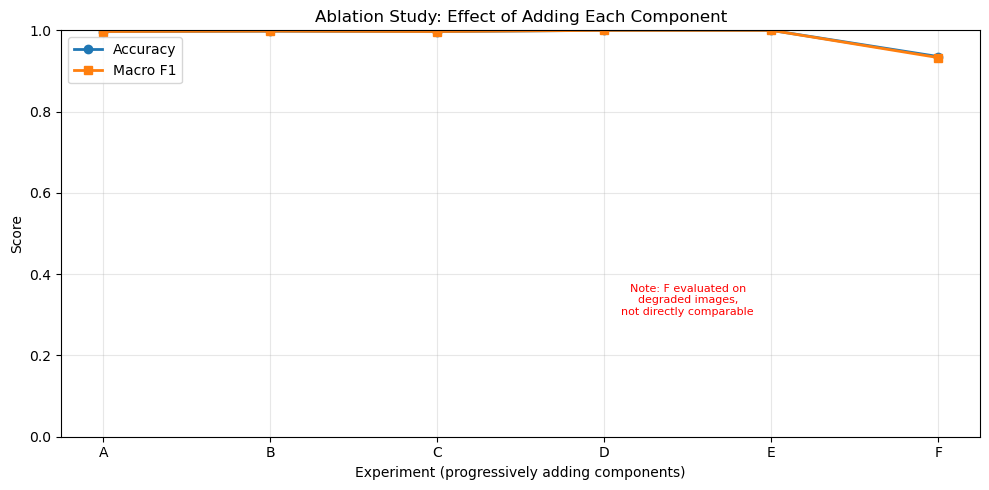

Saved checkpoint 'ablation_chart' -> /home/hassan_raza/Downloads/ECG/results/checkpoints/ablation_chart.pkl  (keys: ['x_labels', 'accuracy_vals', 'f1_vals', 'last_accuracy_val'])
Results saved.


In [112]:
# ============================================================
# ADD TO CELL 27b: ABLATION STUDY CHART
#
# Caching: this cell only draws a chart from ablation_df -- no new
# computation -- but is checkpointed independently from the ablation
# table itself, since you might rerun/reload the chart without
# rerunning the full ablation study. If saved results exist, asks
# whether to reuse or rerun. If reused, prints the full underlying
# data AND redisplays the chart exactly as a fresh run would. If
# rerun, old results (including the PNG on disk) are overwritten.
# ============================================================

CHECKPOINT_NAME = "ablation_chart"


def _render_ablation_chart(x_labels, accuracy_vals, f1_vals, last_accuracy_val):
    """Draws the chart AND prints the underlying numbers, so both the
    fresh-run path and the loaded-from-disk path show identical,
    complete output."""

    print("\nAblation chart -- values plotted:")
    print(f"{'Experiment':<12} {'Accuracy':>10} {'Macro F1':>10}")
    for label, acc_val, f1_val in zip(x_labels, accuracy_vals, f1_vals):
        print(f"{label:<12} {acc_val:>10.4f} {f1_val:>10.4f}")

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.plot(x_labels, accuracy_vals, marker="o", label="Accuracy", linewidth=2)
    ax.plot(x_labels, f1_vals, marker="s", label="Macro F1", linewidth=2)
    ax.set_xlabel("Experiment (progressively adding components)")
    ax.set_ylabel("Score")
    ax.set_title("Ablation Study: Effect of Adding Each Component")
    ax.set_ylim(0, 1)
    ax.legend()
    ax.grid(alpha=0.3)

    # Annotate the last point (F) as a visual reminder it's on different (degraded) test conditions
    ax.annotate("Note: F evaluated on\ndegraded images,\nnot directly comparable",
                xy=(5, last_accuracy_val), xytext=(3.5, 0.3),
                fontsize=8, color="red", ha="center")

    plt.tight_layout()
    plt.savefig(os.path.join(PLOTS_DIR, "training", "ablation_study_chart.png"), dpi=150)
    plt.show()


use_saved = False

if checkpoint_exists(CHECKPOINT_NAME):
    choice = input(
        f"Saved results found for '{CHECKPOINT_NAME}'. "
        "Use saved results instead of recomputing? (y/n): "
    ).strip().lower()
    use_saved = choice == "y"
else:
    print(f"No local results found for '{CHECKPOINT_NAME}' -- running the cell...")

if use_saved:
    data = load_checkpoint(CHECKPOINT_NAME)
    x_labels = data["x_labels"]
    accuracy_vals = data["accuracy_vals"]
    f1_vals = data["f1_vals"]
    last_accuracy_val = data["last_accuracy_val"]

    print("Using saved results.")
    _render_ablation_chart(x_labels, accuracy_vals, f1_vals, last_accuracy_val)

else:
    if "ablation_df" not in globals():
        raise NameError(
            "'ablation_df' is not defined -- run the Ablation Study cell "
            "(Cell 27b) first, since this chart needs its output."
        )

    x_labels = [exp.split(":")[0] for exp in ablation_df["Experiment"]]   # "A", "B", "C"...
    accuracy_vals = list(ablation_df["Accuracy"])
    f1_vals = list(ablation_df["Macro F1"])
    last_accuracy_val = ablation_df["Accuracy"].iloc[-1]

    _render_ablation_chart(x_labels, accuracy_vals, f1_vals, last_accuracy_val)

    # save_checkpoint() opens the file in "wb" mode, so this overwrites
    # any previous saved results automatically -- no separate delete needed.
    save_checkpoint(
        CHECKPOINT_NAME,
        x_labels=x_labels,
        accuracy_vals=accuracy_vals,
        f1_vals=f1_vals,
        last_accuracy_val=last_accuracy_val,
    )
    print("Results saved.")

In [113]:
# ============================================================
# RESUME CUSTOM CNN — RECREATE EXACT DATA GENERATORS
# ============================================================

import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Exact settings from the notebook
IMG_SIZE = (300, 300)
BATCH_SIZE = 32
SEED = 42

# ------------------------------------------------------------
# Locate processed dataset
# ------------------------------------------------------------

PROJECT_ROOT = "/home/hassan_raza/Downloads/ECG"

FINAL_TRAIN_DIR = os.path.join(
    PROJECT_ROOT,
    "ECG_DATA_PROCESSED",
    "train"
)

FINAL_VAL_DIR = os.path.join(
    PROJECT_ROOT,
    "ECG_DATA_PROCESSED",
    "val"
)

FINAL_TEST_DIR = os.path.join(
    PROJECT_ROOT,
    "ECG_DATA_PROCESSED",
    "test"
)

print("Train directory:", FINAL_TRAIN_DIR)
print("Train exists:", os.path.exists(FINAL_TRAIN_DIR))

print("Validation directory:", FINAL_VAL_DIR)
print("Validation exists:", os.path.exists(FINAL_VAL_DIR))

print("Test directory:", FINAL_TEST_DIR)
print("Test exists:", os.path.exists(FINAL_TEST_DIR))


# ------------------------------------------------------------
# EXACT preprocessing from original notebook
# ------------------------------------------------------------

def enhance_contrast(img, factor=1.5):
    mean = img.mean()
    img = (img - mean) * factor + mean
    return np.clip(img, 0, 255).astype("float32")


train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    rotation_range=5,
    width_shift_range=0.05,
    height_shift_range=0.05,
    shear_range=0.05,
    zoom_range=0.05,
    brightness_range=[0.9, 1.1],
    fill_mode="constant",
    cval=0,
    preprocessing_function=enhance_contrast,
)

eval_datagen = ImageDataGenerator(
    rescale=1.0 / 255
)

# ------------------------------------------------------------
# Recreate generators
# ------------------------------------------------------------

train_generator = train_datagen.flow_from_directory(
    FINAL_TRAIN_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=True,
    seed=SEED,
)

val_generator = eval_datagen.flow_from_directory(
    FINAL_VAL_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False,
)

print("\nGenerators recreated successfully.")
print("Class indices:", train_generator.class_indices)
print("Train samples:", train_generator.samples)
print("Validation samples:", val_generator.samples)

Train directory: /home/hassan_raza/Downloads/ECG/ECG_DATA_PROCESSED/train
Train exists: True
Validation directory: /home/hassan_raza/Downloads/ECG/ECG_DATA_PROCESSED/val
Validation exists: True
Test directory: /home/hassan_raza/Downloads/ECG/ECG_DATA_PROCESSED/test
Test exists: True
Found 3056 images belonging to 4 classes.
Found 607 images belonging to 4 classes.

Generators recreated successfully.
Class indices: {'ECG Images of Myocardial Infarction Patients (240x12=2880)': 0, 'ECG Images of Patient that have History of MI (172x12=2064)': 1, 'ECG Images of Patient that have abnormal heartbeat (233x12=2796)': 2, 'Normal Person ECG Images (284x12=3408)': 3}
Train samples: 3056
Validation samples: 607


In [114]:
# ============================================================
# LOAD CUSTOM CNN AT LAST SAVED STATE
# ============================================================

cnn_model_path = "/home/hassan_raza/Downloads/ECG/models/custom_cnn.keras"

cnn_model = tf.keras.models.load_model(
    cnn_model_path
)

print("Custom CNN loaded successfully.")
print("Continuing from saved weights.")
print("Target: Epoch 41 → Epoch 50")

# Check current optimizer learning rate
try:
    current_lr = float(
        tf.keras.backend.get_value(
            cnn_model.optimizer.learning_rate
        )
    )
    print("Current learning rate:", current_lr)
except Exception:
    print("Could not read saved learning rate.")

Custom CNN loaded successfully.
Continuing from saved weights.
Target: Epoch 41 → Epoch 50
Current learning rate: 4.999999873689376e-05


In [115]:
# ============================================================
# CELL — RECREATE ECG DATA GENERATORS
# Batch size reduced to 16 for GPU memory safety
# ============================================================

import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------

TRAIN_DIR = "/home/hassan_raza/Downloads/ECG/ECG_DATA_PROCESSED/train"
VAL_DIR   = "/home/hassan_raza/Downloads/ECG/ECG_DATA_PROCESSED/val"

IMG_SIZE = (300, 300)
BATCH_SIZE = 16
SEED = 42

# ------------------------------------------------------------
# Contrast enhancement
# ------------------------------------------------------------

def enhance_contrast(img, factor=1.5):
    mean = img.mean()
    img = (img - mean) * factor + mean
    return np.clip(img, 0, 255).astype("float32")

# ------------------------------------------------------------
# Training augmentation
# ------------------------------------------------------------

train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    rotation_range=5,
    width_shift_range=0.05,
    height_shift_range=0.05,
    shear_range=0.05,
    zoom_range=0.05,
    brightness_range=[0.9, 1.1],
    fill_mode="constant",
    cval=0,
    preprocessing_function=enhance_contrast,
)

# ------------------------------------------------------------
# Validation generator
# ------------------------------------------------------------

eval_datagen = ImageDataGenerator(
    rescale=1.0 / 255
)

# ------------------------------------------------------------
# Create training generator
# ------------------------------------------------------------

train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=True,
    seed=SEED
)

# ------------------------------------------------------------
# Create validation generator
# ------------------------------------------------------------

val_generator = eval_datagen.flow_from_directory(
    VAL_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False
)

print("\nGenerators created successfully.")
print("Batch size:", BATCH_SIZE)
print("Classes:", train_generator.class_indices)
print("Training samples:", train_generator.samples)
print("Validation samples:", val_generator.samples)

Found 3056 images belonging to 4 classes.
Found 607 images belonging to 4 classes.

Generators created successfully.
Batch size: 16
Classes: {'ECG Images of Myocardial Infarction Patients (240x12=2880)': 0, 'ECG Images of Patient that have History of MI (172x12=2064)': 1, 'ECG Images of Patient that have abnormal heartbeat (233x12=2796)': 2, 'Normal Person ECG Images (284x12=3408)': 3}
Training samples: 3056
Validation samples: 607


# UPLOAD IMAGE HERE TO GET PREDICTION

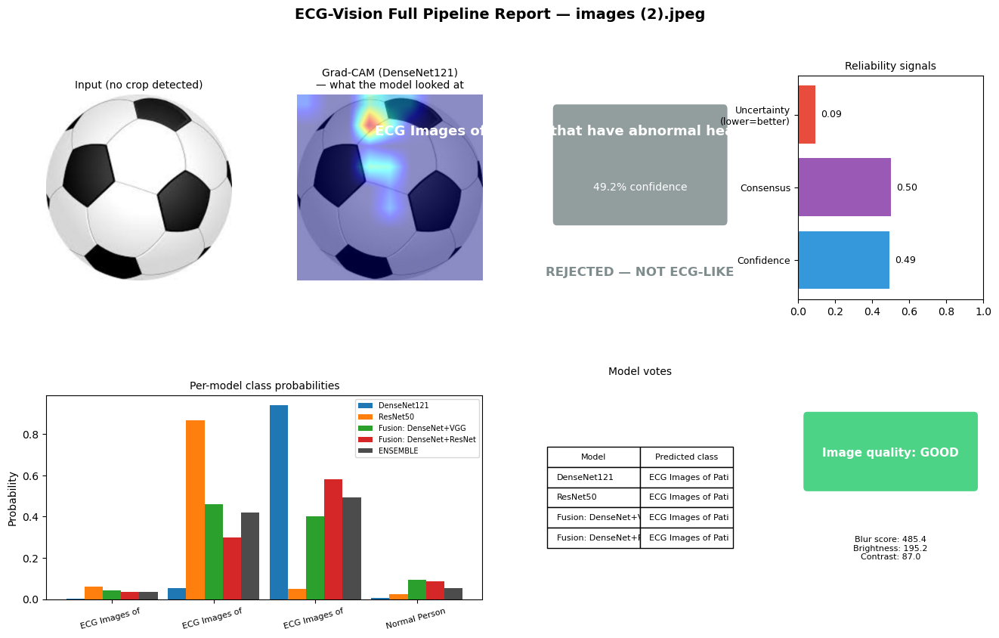

⚠️  NO RED ECG GRID BORDER DETECTED -- this input is likely NOT an ECG image.
    The class prediction below should be IGNORED.
FINAL PREDICTION: ECG Images of Patient that have abnormal heartbeat (233x12=2796)
Ensemble confidence: 49.24%
Consensus (model agreement): 50.0%
Uncertainty (MC-Dropout std): 0.0935
Reliability verdict: REJECTED — NOT ECG-LIKE
Image quality: GOOD


In [121]:
# ============================================================
# FULL PIPELINE ON A SINGLE USER-SUPPLIED ECG IMAGE
# Runs: crop -> per-model classification -> ensemble -> consensus
# -> MC-Dropout uncertainty -> reliability decision -> Grad-CAM
# -> image-quality check, then renders everything as one dashboard.
#
# Requires these to already exist in memory from earlier cells:
#   dense_model, resnet_model, fusion_dv_model, fusion_dr_model
#   CONFIDENCE_THRESHOLD, CONSENSUS_THRESHOLD, UNCERTAINTY_THRESHOLD
#   crop_to_ecg_grid, find_last_conv_layer, make_gradcam_heatmap,
#   assess_image_quality, CLASS_NAMES, IMG_SIZE, NUM_CLASSES
# ============================================================

import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches

N_MC_PASSES_SINGLE = 20   # stochastic passes for this one image's uncertainty


def run_full_pipeline_on_image(image_path):

    # ---------- STAGE 1+3: crop, resize, rescale (matches test_datagen) ----------
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        raise ValueError(f"Could not read image at: {image_path}")

    cropped = crop_to_ecg_grid(img_bgr)
    crop_detected = cropped is not None and cropped.size > 0
    if not crop_detected:
        cropped = img_bgr

    cropped_rgb = cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB)
    resized = cv2.resize(cropped_rgb, IMG_SIZE)
    img_array = resized.astype("float32") / 255.0
    img_batch = np.expand_dims(img_array, axis=0)

    # ---------- STAGE 4: run every ensemble member ----------
    ensemble_models = {
        "DenseNet121": dense_model,
        "ResNet50": resnet_model,
        "Fusion: DenseNet+VGG": fusion_dv_model,
        "Fusion: DenseNet+ResNet": fusion_dr_model,
    }

    per_model_probs = {}
    with tf.device("/CPU:0"):
        for name, model in ensemble_models.items():
            if model is None:
                continue
            per_model_probs[name] = model.predict(img_batch, verbose=0)[0]

    ensemble_probs = np.mean(list(per_model_probs.values()), axis=0)
    pred_idx = int(np.argmax(ensemble_probs))
    pred_class = CLASS_NAMES[pred_idx]
    ensemble_confidence = float(ensemble_probs[pred_idx])

    # ---------- STAGE 5a: consensus (do the 4 models agree?) ----------
    per_model_pred = {name: int(np.argmax(p)) for name, p in per_model_probs.items()}
    votes = list(per_model_pred.values())
    vote_counts = np.bincount(votes, minlength=NUM_CLASSES)
    majority_class = int(np.argmax(vote_counts))
    consensus_score = vote_counts[majority_class] / len(votes)

    # ---------- STAGE 5b: MC-Dropout uncertainty (DenseNet121) ----------
    with tf.device("/CPU:0"):
        mc_passes = np.stack([
            dense_model(img_batch, training=True).numpy()[0]
            for _ in range(N_MC_PASSES_SINGLE)
        ])
    mc_mean = mc_passes.mean(axis=0)
    mc_std = mc_passes.std(axis=0)
    uncertainty_score = float(mc_std.mean())

    # ---------- STAGE 6: Grad-CAM (DenseNet121) ----------
    base_name, conv_name = find_last_conv_layer(dense_model)
    heatmap, gc_pred_idx, gc_probs = make_gradcam_heatmap(
        img_batch, dense_model, base_name, conv_name
    )
    heatmap_resized = cv2.resize(heatmap, IMG_SIZE)
    heatmap_uint8 = np.uint8(255 * heatmap_resized)
    heatmap_color = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB) / 255.0
    overlay = 0.55 * img_array + 0.45 * heatmap_color
    overlay = np.clip(overlay, 0, 1)

    # ---------- STAGE 6b: NON-ECG GUARD ----------
    # crop_to_ecg_grid looks for the red grid border real ECG printouts have.
    # If it's not found, this is a much more reliable "this probably isn't an
    # ECG at all" signal than the classifier's own confidence -- softmax models
    # are known to output falsely confident scores on out-of-distribution inputs,
    # since they have no "none of the above" option and must always pick one
    # of the 4 trained classes no matter what's actually in the image.
    is_likely_ecg = crop_detected

    if not is_likely_ecg:
        decision = "REJECTED — NOT ECG-LIKE"
        verdict_color = "#7f8c8d"   # gray, distinct from ACCEPT green / REVIEW orange
    else:
        decision = reliability_decision(ensemble_confidence, consensus_score, uncertainty_score)
        verdict_color = "#2ecc71" if decision == "ACCEPT" else "#e67e22"

    # ---------- STAGE 8: image quality check ----------
    quality = assess_image_quality(img_array)

    # ============================================================
    # DASHBOARD VISUALIZATION
    # ============================================================
    fig = plt.figure(figsize=(16, 9))
    gs = gridspec.GridSpec(2, 4, height_ratios=[1.1, 1], hspace=0.45, wspace=0.35)

    # -- Panel 1: input image --
    ax_img = fig.add_subplot(gs[0, 0])
    ax_img.imshow(img_array)
    ax_img.set_title("Input (cropped)" if crop_detected else "Input (no crop detected)",
                      fontsize=10)
    ax_img.axis("off")

    # -- Panel 2: Grad-CAM overlay --
    ax_cam = fig.add_subplot(gs[0, 1])
    ax_cam.imshow(overlay)
    ax_cam.set_title("Grad-CAM (DenseNet121)\n— what the model looked at", fontsize=10)
    ax_cam.axis("off")

    # -- Panel 3: final verdict badge --
    ax_verdict = fig.add_subplot(gs[0, 2])
    ax_verdict.axis("off")
    ax_verdict.add_patch(mpatches.FancyBboxPatch(
        (0.05, 0.35), 0.9, 0.5, boxstyle="round,pad=0.02",
        linewidth=0, facecolor=verdict_color, alpha=0.85,
        transform=ax_verdict.transAxes))
    ax_verdict.text(0.5, 0.75, pred_class, ha="center", va="center",
                     fontsize=13, fontweight="bold", color="white",
                     transform=ax_verdict.transAxes, wrap=True)
    ax_verdict.text(0.5, 0.5, f"{ensemble_confidence*100:.1f}% confidence",
                     ha="center", va="center", fontsize=10, color="white",
                     transform=ax_verdict.transAxes)
    ax_verdict.text(0.5, 0.12, decision, ha="center", va="center",
                     fontsize=12, fontweight="bold", color=verdict_color,
                     transform=ax_verdict.transAxes)

    # -- Panel 4: trust metrics gauges (as horizontal bars) --
    ax_metrics = fig.add_subplot(gs[0, 3])
    metrics_names = ["Confidence", "Consensus", "Uncertainty\n(lower=better)"]
    metrics_vals = [ensemble_confidence, consensus_score, uncertainty_score]
    metrics_colors = ["#3498db", "#9b59b6",
                       "#e74c3c" if uncertainty_score >= UNCERTAINTY_THRESHOLD else "#2ecc71"]
    y_pos = np.arange(len(metrics_names))
    ax_metrics.barh(y_pos, metrics_vals, color=metrics_colors)
    ax_metrics.set_yticks(y_pos)
    ax_metrics.set_yticklabels(metrics_names, fontsize=9)
    ax_metrics.set_xlim(0, 1)
    ax_metrics.set_title("Reliability signals", fontsize=10)
    for i, v in enumerate(metrics_vals):
        ax_metrics.text(min(v + 0.03, 0.9), i, f"{v:.2f}", va="center", fontsize=9)

    # -- Panel 5: per-model class probabilities (grouped bar) --
    ax_probs = fig.add_subplot(gs[1, 0:2])
    x = np.arange(NUM_CLASSES)
    width = 0.18
    for i, (name, probs) in enumerate(per_model_probs.items()):
        ax_probs.bar(x + i * width, probs, width, label=name)
    ax_probs.bar(x + len(per_model_probs) * width, ensemble_probs, width,
                 label="ENSEMBLE", color="black", alpha=0.7)
    ax_probs.set_xticks(x + width * len(per_model_probs) / 2)
    ax_probs.set_xticklabels([c[:14] for c in CLASS_NAMES], rotation=15, fontsize=8)
    ax_probs.set_ylabel("Probability")
    ax_probs.set_title("Per-model class probabilities", fontsize=10)
    ax_probs.legend(fontsize=7, loc="upper right")

    # -- Panel 6: per-model agreement table --
    ax_table = fig.add_subplot(gs[1, 2])
    ax_table.axis("off")
    table_data = [[name, CLASS_NAMES[pred][:18]] for name, pred in per_model_pred.items()]
    tbl = ax_table.table(cellText=table_data, colLabels=["Model", "Predicted class"],
                          loc="center", cellLoc="left")
    tbl.auto_set_font_size(False)
    tbl.set_fontsize(8)
    tbl.scale(1, 1.6)
    ax_table.set_title("Model votes", fontsize=10, pad=20)

    # -- Panel 7: image quality --
    ax_qual = fig.add_subplot(gs[1, 3])
    ax_qual.axis("off")
    q_color = "#2ecc71" if quality["quality"] == "GOOD" else "#e74c3c"
    ax_qual.add_patch(mpatches.FancyBboxPatch(
        (0.05, 0.55), 0.9, 0.35, boxstyle="round,pad=0.02",
        linewidth=0, facecolor=q_color, alpha=0.85, transform=ax_qual.transAxes))
    ax_qual.text(0.5, 0.72, f"Image quality: {quality['quality']}", ha="center",
                 va="center", fontsize=11, fontweight="bold", color="white",
                 transform=ax_qual.transAxes)
    qual_lines = (
        f"Blur score: {quality['blur_score']:.1f}\n"
        f"Brightness: {quality['brightness']:.1f}\n"
        f"Contrast: {quality['contrast']:.1f}"
    )
    if quality["issues"]:
        qual_lines += "\nIssues: " + ", ".join(quality["issues"])
    ax_qual.text(0.5, 0.25, qual_lines, ha="center", va="center", fontsize=8,
                 transform=ax_qual.transAxes)

    fig.suptitle(f"ECG-Vision Full Pipeline Report — {os.path.basename(image_path)}",
                 fontsize=14, fontweight="bold")
    plt.show()

    # ---------- console summary ----------
    print("=" * 60)
    if not is_likely_ecg:
        print("⚠️  NO RED ECG GRID BORDER DETECTED -- this input is likely NOT an ECG image.")
        print("    The class prediction below should be IGNORED.")
    print(f"FINAL PREDICTION: {pred_class}")
    print(f"Ensemble confidence: {ensemble_confidence*100:.2f}%")
    print(f"Consensus (model agreement): {consensus_score*100:.1f}%")
    print(f"Uncertainty (MC-Dropout std): {uncertainty_score:.4f}")
    print(f"Reliability verdict: {decision}")
    print(f"Image quality: {quality['quality']}" +
          (f" ({', '.join(quality['issues'])})" if quality["issues"] else ""))
    print("=" * 60)

    return {
        "pred_class": pred_class,
        "ensemble_confidence": ensemble_confidence,
        "consensus_score": consensus_score,
        "uncertainty_score": uncertainty_score,
        "decision": decision,
        "quality": quality,
        "per_model_probs": per_model_probs,
        "is_likely_ecg": is_likely_ecg,
    }


# Example usage -- replace with your own image path:
result = run_full_pipeline_on_image("/home/hassan_raza/Documents/images (2).jpeg")